# Suo

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: False


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "dataset_complete_Suo_age.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata.obs["age"] = adata.obs["age"].astype(float)
adata.obs["age_categorical"] = adata.obs["age"].astype(str)
d = {i: ind for ind, i in enumerate(sorted(adata.obs["age"].astype(float).unique()))}
adata.obs["age_training"] = [d[float(i)] for i in adata.obs["age"]]
print(adata_file_path, flush=True)
print(adata, flush=True)

/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/processed/dataset_complete_Suo_age.h5ad


AnnData object with n_obs × n_vars = 73697 × 8192
    obs: 'sample_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'concatenated_integration_covariates', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'n_genes', 'age_categorical', 'age_training'
    uns: 'rank_genes_groups'
    obsm: 'Unintegrated', 'X_pca', 'harmony'


In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|age_categorical",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 0.25,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 512,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "age_training",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.5,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=True
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=64,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=5e-5,
        weight_decay=1e-2,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['age_categorical']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "suo_age-continuous_8"
)

vae.save(
    dir_path,
    overwrite=True,
)

W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: sjg3ztxd
Name: legendary-sea-581
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/sjg3ztxd
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240506_182846-sjg3ztxd/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_training` for `training` set. Number of elements in each group: 6641,15117,18866,4832,7547,5955
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_training` for `validation` set. Number of elements in each group: 1703,3848,4746,1181,1897,1364
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [10:33<105:24:32, 633.51s/it]

Epoch 1/600:   0%|          | 1/600 [10:33<105:24:32, 633.51s/it, v_num=xd_1, total_loss_train=628, kl_local_train=29.4]

Epoch 2/600:   0%|          | 1/600 [10:33<105:24:32, 633.51s/it, v_num=xd_1, total_loss_train=628, kl_local_train=29.4]

Epoch 2/600:   0%|          | 2/600 [11:38<49:39:11, 298.92s/it, v_num=xd_1, total_loss_train=628, kl_local_train=29.4] 

Epoch 2/600:   0%|          | 2/600 [11:38<49:39:11, 298.92s/it, v_num=xd_1, total_loss_train=487, kl_local_train=49.2]

Epoch 3/600:   0%|          | 2/600 [11:38<49:39:11, 298.92s/it, v_num=xd_1, total_loss_train=487, kl_local_train=49.2]

Epoch 3/600:   0%|          | 3/600 [12:41<31:44:28, 191.40s/it, v_num=xd_1, total_loss_train=487, kl_local_train=49.2]

Epoch 3/600:   0%|          | 3/600 [12:41<31:44:28, 191.40s/it, v_num=xd_1, total_loss_train=456, kl_local_train=58.9]

Epoch 4/600:   0%|          | 3/600 [12:41<31:44:28, 191.40s/it, v_num=xd_1, total_loss_train=456, kl_local_train=58.9]

Epoch 4/600:   1%|          | 4/600 [13:49<23:34:42, 142.42s/it, v_num=xd_1, total_loss_train=456, kl_local_train=58.9]

Epoch 4/600:   1%|          | 4/600 [13:49<23:34:42, 142.42s/it, v_num=xd_1, total_loss_train=445, kl_local_train=63.9]

Epoch 5/600:   1%|          | 4/600 [13:49<23:34:42, 142.42s/it, v_num=xd_1, total_loss_train=445, kl_local_train=63.9]

Epoch 5/600:   1%|          | 5/600 [14:52<18:50:28, 114.00s/it, v_num=xd_1, total_loss_train=445, kl_local_train=63.9]

Epoch 5/600:   1%|          | 5/600 [14:52<18:50:28, 114.00s/it, v_num=xd_1, total_loss_train=439, kl_local_train=65.9]

Epoch 6/600:   1%|          | 5/600 [14:53<18:50:28, 114.00s/it, v_num=xd_1, total_loss_train=439, kl_local_train=65.9]

Epoch 6/600:   1%|          | 6/600 [15:50<15:40:42, 95.02s/it, v_num=xd_1, total_loss_train=439, kl_local_train=65.9] 

Epoch 6/600:   1%|          | 6/600 [15:50<15:40:42, 95.02s/it, v_num=xd_1, total_loss_train=435, kl_local_train=65.9, metric_mi|age_categorical_train=0.0691]

Epoch 7/600:   1%|          | 6/600 [15:50<15:40:42, 95.02s/it, v_num=xd_1, total_loss_train=435, kl_local_train=65.9, metric_mi|age_categorical_train=0.0691]

Epoch 7/600:   1%|          | 7/600 [16:48<13:40:00, 82.97s/it, v_num=xd_1, total_loss_train=435, kl_local_train=65.9, metric_mi|age_categorical_train=0.0691]

Epoch 7/600:   1%|          | 7/600 [16:48<13:40:00, 82.97s/it, v_num=xd_1, total_loss_train=432, kl_local_train=65, metric_mi|age_categorical_train=0.0691]  

Epoch 8/600:   1%|          | 7/600 [16:48<13:40:00, 82.97s/it, v_num=xd_1, total_loss_train=432, kl_local_train=65, metric_mi|age_categorical_train=0.0691]

Epoch 8/600:   1%|▏         | 8/600 [17:44<12:12:35, 74.25s/it, v_num=xd_1, total_loss_train=432, kl_local_train=65, metric_mi|age_categorical_train=0.0691]

Epoch 8/600:   1%|▏         | 8/600 [17:44<12:12:35, 74.25s/it, v_num=xd_1, total_loss_train=437, kl_local_train=60.5, metric_mi|age_categorical_train=0.0691]

Epoch 9/600:   1%|▏         | 8/600 [17:44<12:12:35, 74.25s/it, v_num=xd_1, total_loss_train=437, kl_local_train=60.5, metric_mi|age_categorical_train=0.0691]

Epoch 9/600:   2%|▏         | 9/600 [18:38<11:10:20, 68.06s/it, v_num=xd_1, total_loss_train=437, kl_local_train=60.5, metric_mi|age_categorical_train=0.0691]

Epoch 9/600:   2%|▏         | 9/600 [18:38<11:10:20, 68.06s/it, v_num=xd_1, total_loss_train=441, kl_local_train=49.9, metric_mi|age_categorical_train=0.0691]

Epoch 10/600:   2%|▏         | 9/600 [18:38<11:10:20, 68.06s/it, v_num=xd_1, total_loss_train=441, kl_local_train=49.9, metric_mi|age_categorical_train=0.0691]

Epoch 10/600:   2%|▏         | 10/600 [19:34<10:30:41, 64.14s/it, v_num=xd_1, total_loss_train=441, kl_local_train=49.9, metric_mi|age_categorical_train=0.0691]

Epoch 10/600:   2%|▏         | 10/600 [19:34<10:30:41, 64.14s/it, v_num=xd_1, total_loss_train=444, kl_local_train=45.1, metric_mi|age_categorical_train=0.0691]

Epoch 11/600:   2%|▏         | 10/600 [19:35<10:30:41, 64.14s/it, v_num=xd_1, total_loss_train=444, kl_local_train=45.1, metric_mi|age_categorical_train=0.0691]

Epoch 11/600:   2%|▏         | 11/600 [20:32<10:10:44, 62.21s/it, v_num=xd_1, total_loss_train=444, kl_local_train=45.1, metric_mi|age_categorical_train=0.0691]

Epoch 11/600:   2%|▏         | 11/600 [20:32<10:10:44, 62.21s/it, v_num=xd_1, total_loss_train=447, kl_local_train=43.7, metric_mi|age_categorical_train=0.0671]

Epoch 12/600:   2%|▏         | 11/600 [20:32<10:10:44, 62.21s/it, v_num=xd_1, total_loss_train=447, kl_local_train=43.7, metric_mi|age_categorical_train=0.0671]

Epoch 12/600:   2%|▏         | 12/600 [21:31<10:01:52, 61.42s/it, v_num=xd_1, total_loss_train=447, kl_local_train=43.7, metric_mi|age_categorical_train=0.0671]

Epoch 12/600:   2%|▏         | 12/600 [21:31<10:01:52, 61.42s/it, v_num=xd_1, total_loss_train=451, kl_local_train=43.1, metric_mi|age_categorical_train=0.0671]

Epoch 13/600:   2%|▏         | 12/600 [21:31<10:01:52, 61.42s/it, v_num=xd_1, total_loss_train=451, kl_local_train=43.1, metric_mi|age_categorical_train=0.0671]

Epoch 13/600:   2%|▏         | 13/600 [22:28<9:47:33, 60.06s/it, v_num=xd_1, total_loss_train=451, kl_local_train=43.1, metric_mi|age_categorical_train=0.0671] 

Epoch 13/600:   2%|▏         | 13/600 [22:28<9:47:33, 60.06s/it, v_num=xd_1, total_loss_train=455, kl_local_train=43.1, metric_mi|age_categorical_train=0.0671]

Epoch 14/600:   2%|▏         | 13/600 [22:28<9:47:33, 60.06s/it, v_num=xd_1, total_loss_train=455, kl_local_train=43.1, metric_mi|age_categorical_train=0.0671]

Epoch 14/600:   2%|▏         | 14/600 [23:25<9:37:03, 59.08s/it, v_num=xd_1, total_loss_train=455, kl_local_train=43.1, metric_mi|age_categorical_train=0.0671]

Epoch 14/600:   2%|▏         | 14/600 [23:25<9:37:03, 59.08s/it, v_num=xd_1, total_loss_train=459, kl_local_train=44, metric_mi|age_categorical_train=0.0671]  

Epoch 15/600:   2%|▏         | 14/600 [23:25<9:37:03, 59.08s/it, v_num=xd_1, total_loss_train=459, kl_local_train=44, metric_mi|age_categorical_train=0.0671]

Epoch 15/600:   2%|▎         | 15/600 [24:24<9:36:44, 59.15s/it, v_num=xd_1, total_loss_train=459, kl_local_train=44, metric_mi|age_categorical_train=0.0671]

Epoch 15/600:   2%|▎         | 15/600 [24:24<9:36:44, 59.15s/it, v_num=xd_1, total_loss_train=463, kl_local_train=44.8, metric_mi|age_categorical_train=0.0671]

Epoch 16/600:   2%|▎         | 15/600 [24:25<9:36:44, 59.15s/it, v_num=xd_1, total_loss_train=463, kl_local_train=44.8, metric_mi|age_categorical_train=0.0671]

Epoch 16/600:   3%|▎         | 16/600 [25:23<9:33:45, 58.95s/it, v_num=xd_1, total_loss_train=463, kl_local_train=44.8, metric_mi|age_categorical_train=0.0671]

Epoch 16/600:   3%|▎         | 16/600 [25:23<9:33:45, 58.95s/it, v_num=xd_1, total_loss_train=468, kl_local_train=46.4, metric_mi|age_categorical_train=0.0672]

Epoch 17/600:   3%|▎         | 16/600 [25:23<9:33:45, 58.95s/it, v_num=xd_1, total_loss_train=468, kl_local_train=46.4, metric_mi|age_categorical_train=0.0672]

Epoch 17/600:   3%|▎         | 17/600 [26:19<9:24:57, 58.14s/it, v_num=xd_1, total_loss_train=468, kl_local_train=46.4, metric_mi|age_categorical_train=0.0672]

Epoch 17/600:   3%|▎         | 17/600 [26:19<9:24:57, 58.14s/it, v_num=xd_1, total_loss_train=471, kl_local_train=48.5, metric_mi|age_categorical_train=0.0672]

Epoch 18/600:   3%|▎         | 17/600 [26:19<9:24:57, 58.14s/it, v_num=xd_1, total_loss_train=471, kl_local_train=48.5, metric_mi|age_categorical_train=0.0672]

Epoch 18/600:   3%|▎         | 18/600 [27:29<9:58:11, 61.67s/it, v_num=xd_1, total_loss_train=471, kl_local_train=48.5, metric_mi|age_categorical_train=0.0672]

Epoch 18/600:   3%|▎         | 18/600 [27:29<9:58:11, 61.67s/it, v_num=xd_1, total_loss_train=476, kl_local_train=52.2, metric_mi|age_categorical_train=0.0672]

Epoch 19/600:   3%|▎         | 18/600 [27:29<9:58:11, 61.67s/it, v_num=xd_1, total_loss_train=476, kl_local_train=52.2, metric_mi|age_categorical_train=0.0672]

Epoch 19/600:   3%|▎         | 19/600 [28:37<10:14:46, 63.49s/it, v_num=xd_1, total_loss_train=476, kl_local_train=52.2, metric_mi|age_categorical_train=0.0672]

Epoch 19/600:   3%|▎         | 19/600 [28:37<10:14:46, 63.49s/it, v_num=xd_1, total_loss_train=479, kl_local_train=55.9, metric_mi|age_categorical_train=0.0672]

Epoch 20/600:   3%|▎         | 19/600 [28:37<10:14:46, 63.49s/it, v_num=xd_1, total_loss_train=479, kl_local_train=55.9, metric_mi|age_categorical_train=0.0672]

Epoch 20/600:   3%|▎         | 20/600 [29:37<10:05:24, 62.63s/it, v_num=xd_1, total_loss_train=479, kl_local_train=55.9, metric_mi|age_categorical_train=0.0672]

Epoch 20/600:   3%|▎         | 20/600 [29:37<10:05:24, 62.63s/it, v_num=xd_1, total_loss_train=481, kl_local_train=69.7, metric_mi|age_categorical_train=0.0672]

Epoch 21/600:   3%|▎         | 20/600 [29:38<10:05:24, 62.63s/it, v_num=xd_1, total_loss_train=481, kl_local_train=69.7, metric_mi|age_categorical_train=0.0672]

Epoch 21/600:   4%|▎         | 21/600 [30:36<9:52:54, 61.44s/it, v_num=xd_1, total_loss_train=481, kl_local_train=69.7, metric_mi|age_categorical_train=0.0672] 

Epoch 21/600:   4%|▎         | 21/600 [30:36<9:52:54, 61.44s/it, v_num=xd_1, total_loss_train=471, kl_local_train=96.1, metric_mi|age_categorical_train=0.0786]

Epoch 22/600:   4%|▎         | 21/600 [30:36<9:52:54, 61.44s/it, v_num=xd_1, total_loss_train=471, kl_local_train=96.1, metric_mi|age_categorical_train=0.0786]

Epoch 22/600:   4%|▎         | 22/600 [31:33<9:40:01, 60.21s/it, v_num=xd_1, total_loss_train=471, kl_local_train=96.1, metric_mi|age_categorical_train=0.0786]

Epoch 22/600:   4%|▎         | 22/600 [31:33<9:40:01, 60.21s/it, v_num=xd_1, total_loss_train=465, kl_local_train=105, metric_mi|age_categorical_train=0.0786] 

Epoch 23/600:   4%|▎         | 22/600 [31:33<9:40:01, 60.21s/it, v_num=xd_1, total_loss_train=465, kl_local_train=105, metric_mi|age_categorical_train=0.0786]

Epoch 23/600:   4%|▍         | 23/600 [32:30<9:29:49, 59.25s/it, v_num=xd_1, total_loss_train=465, kl_local_train=105, metric_mi|age_categorical_train=0.0786]

Epoch 23/600:   4%|▍         | 23/600 [32:30<9:29:49, 59.25s/it, v_num=xd_1, total_loss_train=463, kl_local_train=99.7, metric_mi|age_categorical_train=0.0786]

Epoch 24/600:   4%|▍         | 23/600 [32:30<9:29:49, 59.25s/it, v_num=xd_1, total_loss_train=463, kl_local_train=99.7, metric_mi|age_categorical_train=0.0786]

Epoch 24/600:   4%|▍         | 24/600 [33:27<9:22:15, 58.57s/it, v_num=xd_1, total_loss_train=463, kl_local_train=99.7, metric_mi|age_categorical_train=0.0786]

Epoch 24/600:   4%|▍         | 24/600 [33:27<9:22:15, 58.57s/it, v_num=xd_1, total_loss_train=463, kl_local_train=104, metric_mi|age_categorical_train=0.0786] 

Epoch 25/600:   4%|▍         | 24/600 [33:27<9:22:15, 58.57s/it, v_num=xd_1, total_loss_train=463, kl_local_train=104, metric_mi|age_categorical_train=0.0786]

Epoch 25/600:   4%|▍         | 25/600 [34:25<9:19:08, 58.35s/it, v_num=xd_1, total_loss_train=463, kl_local_train=104, metric_mi|age_categorical_train=0.0786]

Epoch 25/600:   4%|▍         | 25/600 [34:25<9:19:08, 58.35s/it, v_num=xd_1, total_loss_train=463, kl_local_train=114, metric_mi|age_categorical_train=0.0786]

Epoch 26/600:   4%|▍         | 25/600 [34:26<9:19:08, 58.35s/it, v_num=xd_1, total_loss_train=463, kl_local_train=114, metric_mi|age_categorical_train=0.0786]

Epoch 26/600:   4%|▍         | 26/600 [35:24<9:18:58, 58.43s/it, v_num=xd_1, total_loss_train=463, kl_local_train=114, metric_mi|age_categorical_train=0.0786]

Epoch 26/600:   4%|▍         | 26/600 [35:24<9:18:58, 58.43s/it, v_num=xd_1, total_loss_train=464, kl_local_train=125, metric_mi|age_categorical_train=0.232] 

Epoch 27/600:   4%|▍         | 26/600 [35:24<9:18:58, 58.43s/it, v_num=xd_1, total_loss_train=464, kl_local_train=125, metric_mi|age_categorical_train=0.232]

Epoch 27/600:   4%|▍         | 27/600 [36:21<9:14:46, 58.09s/it, v_num=xd_1, total_loss_train=464, kl_local_train=125, metric_mi|age_categorical_train=0.232]

Epoch 27/600:   4%|▍         | 27/600 [36:21<9:14:46, 58.09s/it, v_num=xd_1, total_loss_train=465, kl_local_train=141, metric_mi|age_categorical_train=0.232]

Epoch 28/600:   4%|▍         | 27/600 [36:21<9:14:46, 58.09s/it, v_num=xd_1, total_loss_train=465, kl_local_train=141, metric_mi|age_categorical_train=0.232]

Epoch 28/600:   5%|▍         | 28/600 [37:18<9:10:02, 57.70s/it, v_num=xd_1, total_loss_train=465, kl_local_train=141, metric_mi|age_categorical_train=0.232]

Epoch 28/600:   5%|▍         | 28/600 [37:18<9:10:02, 57.70s/it, v_num=xd_1, total_loss_train=466, kl_local_train=149, metric_mi|age_categorical_train=0.232]

Epoch 29/600:   5%|▍         | 28/600 [37:18<9:10:02, 57.70s/it, v_num=xd_1, total_loss_train=466, kl_local_train=149, metric_mi|age_categorical_train=0.232]

Epoch 29/600:   5%|▍         | 29/600 [38:16<9:09:04, 57.70s/it, v_num=xd_1, total_loss_train=466, kl_local_train=149, metric_mi|age_categorical_train=0.232]

Epoch 29/600:   5%|▍         | 29/600 [38:16<9:09:04, 57.70s/it, v_num=xd_1, total_loss_train=468, kl_local_train=159, metric_mi|age_categorical_train=0.232]

Epoch 30/600:   5%|▍         | 29/600 [38:16<9:09:04, 57.70s/it, v_num=xd_1, total_loss_train=468, kl_local_train=159, metric_mi|age_categorical_train=0.232]

Epoch 30/600:   5%|▌         | 30/600 [39:15<9:13:09, 58.23s/it, v_num=xd_1, total_loss_train=468, kl_local_train=159, metric_mi|age_categorical_train=0.232]

Epoch 30/600:   5%|▌         | 30/600 [39:15<9:13:09, 58.23s/it, v_num=xd_1, total_loss_train=469, kl_local_train=165, metric_mi|age_categorical_train=0.232]

Epoch 31/600:   5%|▌         | 30/600 [39:16<9:13:09, 58.23s/it, v_num=xd_1, total_loss_train=469, kl_local_train=165, metric_mi|age_categorical_train=0.232]

Epoch 31/600:   5%|▌         | 31/600 [40:14<9:14:40, 58.49s/it, v_num=xd_1, total_loss_train=469, kl_local_train=165, metric_mi|age_categorical_train=0.232]

Epoch 31/600:   5%|▌         | 31/600 [40:14<9:14:40, 58.49s/it, v_num=xd_1, total_loss_train=471, kl_local_train=171, metric_mi|age_categorical_train=0.286]

Epoch 32/600:   5%|▌         | 31/600 [40:14<9:14:40, 58.49s/it, v_num=xd_1, total_loss_train=471, kl_local_train=171, metric_mi|age_categorical_train=0.286]

Epoch 32/600:   5%|▌         | 32/600 [41:12<9:12:54, 58.41s/it, v_num=xd_1, total_loss_train=471, kl_local_train=171, metric_mi|age_categorical_train=0.286]

Epoch 32/600:   5%|▌         | 32/600 [41:12<9:12:54, 58.41s/it, v_num=xd_1, total_loss_train=472, kl_local_train=180, metric_mi|age_categorical_train=0.286]

Epoch 33/600:   5%|▌         | 32/600 [41:12<9:12:54, 58.41s/it, v_num=xd_1, total_loss_train=472, kl_local_train=180, metric_mi|age_categorical_train=0.286]

Epoch 33/600:   6%|▌         | 33/600 [42:10<9:08:37, 58.06s/it, v_num=xd_1, total_loss_train=472, kl_local_train=180, metric_mi|age_categorical_train=0.286]

Epoch 33/600:   6%|▌         | 33/600 [42:10<9:08:37, 58.06s/it, v_num=xd_1, total_loss_train=473, kl_local_train=184, metric_mi|age_categorical_train=0.286]

Epoch 34/600:   6%|▌         | 33/600 [42:10<9:08:37, 58.06s/it, v_num=xd_1, total_loss_train=473, kl_local_train=184, metric_mi|age_categorical_train=0.286]

Epoch 34/600:   6%|▌         | 34/600 [43:05<8:59:06, 57.15s/it, v_num=xd_1, total_loss_train=473, kl_local_train=184, metric_mi|age_categorical_train=0.286]

Epoch 34/600:   6%|▌         | 34/600 [43:05<8:59:06, 57.15s/it, v_num=xd_1, total_loss_train=475, kl_local_train=188, metric_mi|age_categorical_train=0.286]

Epoch 35/600:   6%|▌         | 34/600 [43:05<8:59:06, 57.15s/it, v_num=xd_1, total_loss_train=475, kl_local_train=188, metric_mi|age_categorical_train=0.286]

Epoch 35/600:   6%|▌         | 35/600 [44:01<8:56:42, 56.99s/it, v_num=xd_1, total_loss_train=475, kl_local_train=188, metric_mi|age_categorical_train=0.286]

Epoch 35/600:   6%|▌         | 35/600 [44:01<8:56:42, 56.99s/it, v_num=xd_1, total_loss_train=476, kl_local_train=190, metric_mi|age_categorical_train=0.286]

Epoch 36/600:   6%|▌         | 35/600 [44:02<8:56:42, 56.99s/it, v_num=xd_1, total_loss_train=476, kl_local_train=190, metric_mi|age_categorical_train=0.286]

Epoch 36/600:   6%|▌         | 36/600 [45:03<9:09:01, 58.41s/it, v_num=xd_1, total_loss_train=476, kl_local_train=190, metric_mi|age_categorical_train=0.286]

Epoch 36/600:   6%|▌         | 36/600 [45:03<9:09:01, 58.41s/it, v_num=xd_1, total_loss_train=477, kl_local_train=194, metric_mi|age_categorical_train=0.329]

Epoch 37/600:   6%|▌         | 36/600 [45:03<9:09:01, 58.41s/it, v_num=xd_1, total_loss_train=477, kl_local_train=194, metric_mi|age_categorical_train=0.329]

Epoch 37/600:   6%|▌         | 37/600 [45:58<8:59:12, 57.47s/it, v_num=xd_1, total_loss_train=477, kl_local_train=194, metric_mi|age_categorical_train=0.329]

Epoch 37/600:   6%|▌         | 37/600 [45:58<8:59:12, 57.47s/it, v_num=xd_1, total_loss_train=479, kl_local_train=194, metric_mi|age_categorical_train=0.329]

Epoch 38/600:   6%|▌         | 37/600 [45:58<8:59:12, 57.47s/it, v_num=xd_1, total_loss_train=479, kl_local_train=194, metric_mi|age_categorical_train=0.329]

Epoch 38/600:   6%|▋         | 38/600 [46:53<8:50:16, 56.61s/it, v_num=xd_1, total_loss_train=479, kl_local_train=194, metric_mi|age_categorical_train=0.329]

Epoch 38/600:   6%|▋         | 38/600 [46:53<8:50:16, 56.61s/it, v_num=xd_1, total_loss_train=480, kl_local_train=192, metric_mi|age_categorical_train=0.329]

Epoch 39/600:   6%|▋         | 38/600 [46:53<8:50:16, 56.61s/it, v_num=xd_1, total_loss_train=480, kl_local_train=192, metric_mi|age_categorical_train=0.329]

Epoch 39/600:   6%|▋         | 39/600 [47:50<8:50:31, 56.74s/it, v_num=xd_1, total_loss_train=480, kl_local_train=192, metric_mi|age_categorical_train=0.329]

Epoch 39/600:   6%|▋         | 39/600 [47:50<8:50:31, 56.74s/it, v_num=xd_1, total_loss_train=481, kl_local_train=191, metric_mi|age_categorical_train=0.329]

Epoch 40/600:   6%|▋         | 39/600 [47:50<8:50:31, 56.74s/it, v_num=xd_1, total_loss_train=481, kl_local_train=191, metric_mi|age_categorical_train=0.329]

Epoch 40/600:   7%|▋         | 40/600 [48:47<8:50:03, 56.79s/it, v_num=xd_1, total_loss_train=481, kl_local_train=191, metric_mi|age_categorical_train=0.329]

Epoch 40/600:   7%|▋         | 40/600 [48:47<8:50:03, 56.79s/it, v_num=xd_1, total_loss_train=482, kl_local_train=188, metric_mi|age_categorical_train=0.329]

Epoch 41/600:   7%|▋         | 40/600 [48:48<8:50:03, 56.79s/it, v_num=xd_1, total_loss_train=482, kl_local_train=188, metric_mi|age_categorical_train=0.329]

Epoch 41/600:   7%|▋         | 41/600 [49:47<8:59:27, 57.90s/it, v_num=xd_1, total_loss_train=482, kl_local_train=188, metric_mi|age_categorical_train=0.329]

Epoch 41/600:   7%|▋         | 41/600 [49:47<8:59:27, 57.90s/it, v_num=xd_1, total_loss_train=484, kl_local_train=191, metric_mi|age_categorical_train=0.329]

Epoch 42/600:   7%|▋         | 41/600 [49:47<8:59:27, 57.90s/it, v_num=xd_1, total_loss_train=484, kl_local_train=191, metric_mi|age_categorical_train=0.329]

Epoch 42/600:   7%|▋         | 42/600 [50:44<8:54:10, 57.44s/it, v_num=xd_1, total_loss_train=484, kl_local_train=191, metric_mi|age_categorical_train=0.329]

Epoch 42/600:   7%|▋         | 42/600 [50:44<8:54:10, 57.44s/it, v_num=xd_1, total_loss_train=485, kl_local_train=196, metric_mi|age_categorical_train=0.329]

Epoch 43/600:   7%|▋         | 42/600 [50:44<8:54:10, 57.44s/it, v_num=xd_1, total_loss_train=485, kl_local_train=196, metric_mi|age_categorical_train=0.329]

Epoch 43/600:   7%|▋         | 43/600 [51:41<8:52:07, 57.32s/it, v_num=xd_1, total_loss_train=485, kl_local_train=196, metric_mi|age_categorical_train=0.329]

Epoch 43/600:   7%|▋         | 43/600 [51:41<8:52:07, 57.32s/it, v_num=xd_1, total_loss_train=486, kl_local_train=188, metric_mi|age_categorical_train=0.329]

Epoch 44/600:   7%|▋         | 43/600 [51:41<8:52:07, 57.32s/it, v_num=xd_1, total_loss_train=486, kl_local_train=188, metric_mi|age_categorical_train=0.329]

Epoch 44/600:   7%|▋         | 44/600 [52:39<8:53:01, 57.52s/it, v_num=xd_1, total_loss_train=486, kl_local_train=188, metric_mi|age_categorical_train=0.329]

Epoch 44/600:   7%|▋         | 44/600 [52:39<8:53:01, 57.52s/it, v_num=xd_1, total_loss_train=487, kl_local_train=184, metric_mi|age_categorical_train=0.329]

Epoch 45/600:   7%|▋         | 44/600 [52:39<8:53:01, 57.52s/it, v_num=xd_1, total_loss_train=487, kl_local_train=184, metric_mi|age_categorical_train=0.329]

Epoch 45/600:   8%|▊         | 45/600 [53:35<8:49:07, 57.20s/it, v_num=xd_1, total_loss_train=487, kl_local_train=184, metric_mi|age_categorical_train=0.329]

Epoch 45/600:   8%|▊         | 45/600 [53:35<8:49:07, 57.20s/it, v_num=xd_1, total_loss_train=488, kl_local_train=178, metric_mi|age_categorical_train=0.329]

Epoch 46/600:   8%|▊         | 45/600 [53:36<8:49:07, 57.20s/it, v_num=xd_1, total_loss_train=488, kl_local_train=178, metric_mi|age_categorical_train=0.329]

Epoch 46/600:   8%|▊         | 46/600 [54:33<8:50:13, 57.43s/it, v_num=xd_1, total_loss_train=488, kl_local_train=178, metric_mi|age_categorical_train=0.329]

Epoch 46/600:   8%|▊         | 46/600 [54:33<8:50:13, 57.43s/it, v_num=xd_1, total_loss_train=489, kl_local_train=180, metric_mi|age_categorical_train=0.356]

Epoch 47/600:   8%|▊         | 46/600 [54:33<8:50:13, 57.43s/it, v_num=xd_1, total_loss_train=489, kl_local_train=180, metric_mi|age_categorical_train=0.356]

Epoch 47/600:   8%|▊         | 47/600 [55:29<8:46:01, 57.07s/it, v_num=xd_1, total_loss_train=489, kl_local_train=180, metric_mi|age_categorical_train=0.356]

Epoch 47/600:   8%|▊         | 47/600 [55:29<8:46:01, 57.07s/it, v_num=xd_1, total_loss_train=490, kl_local_train=171, metric_mi|age_categorical_train=0.356]

Epoch 48/600:   8%|▊         | 47/600 [55:29<8:46:01, 57.07s/it, v_num=xd_1, total_loss_train=490, kl_local_train=171, metric_mi|age_categorical_train=0.356]

Epoch 48/600:   8%|▊         | 48/600 [56:23<8:35:13, 56.00s/it, v_num=xd_1, total_loss_train=490, kl_local_train=171, metric_mi|age_categorical_train=0.356]

Epoch 48/600:   8%|▊         | 48/600 [56:23<8:35:13, 56.00s/it, v_num=xd_1, total_loss_train=492, kl_local_train=174, metric_mi|age_categorical_train=0.356]

Epoch 49/600:   8%|▊         | 48/600 [56:23<8:35:13, 56.00s/it, v_num=xd_1, total_loss_train=492, kl_local_train=174, metric_mi|age_categorical_train=0.356]

Epoch 49/600:   8%|▊         | 49/600 [57:16<8:26:14, 55.13s/it, v_num=xd_1, total_loss_train=492, kl_local_train=174, metric_mi|age_categorical_train=0.356]

Epoch 49/600:   8%|▊         | 49/600 [57:16<8:26:14, 55.13s/it, v_num=xd_1, total_loss_train=493, kl_local_train=171, metric_mi|age_categorical_train=0.356]

Epoch 50/600:   8%|▊         | 49/600 [57:16<8:26:14, 55.13s/it, v_num=xd_1, total_loss_train=493, kl_local_train=171, metric_mi|age_categorical_train=0.356]

Epoch 50/600:   8%|▊         | 50/600 [58:10<8:22:58, 54.87s/it, v_num=xd_1, total_loss_train=493, kl_local_train=171, metric_mi|age_categorical_train=0.356]

Epoch 50/600:   8%|▊         | 50/600 [58:10<8:22:58, 54.87s/it, v_num=xd_1, total_loss_train=495, kl_local_train=170, metric_mi|age_categorical_train=0.356]

Epoch 51/600:   8%|▊         | 50/600 [58:11<8:22:58, 54.87s/it, v_num=xd_1, total_loss_train=495, kl_local_train=170, metric_mi|age_categorical_train=0.356]

Epoch 51/600:   8%|▊         | 51/600 [59:05<8:20:39, 54.72s/it, v_num=xd_1, total_loss_train=495, kl_local_train=170, metric_mi|age_categorical_train=0.356]

Epoch 51/600:   8%|▊         | 51/600 [59:05<8:20:39, 54.72s/it, v_num=xd_1, total_loss_train=494, kl_local_train=172, metric_mi|age_categorical_train=0.376]

Epoch 52/600:   8%|▊         | 51/600 [59:05<8:20:39, 54.72s/it, v_num=xd_1, total_loss_train=494, kl_local_train=172, metric_mi|age_categorical_train=0.376]

Epoch 52/600:   9%|▊         | 52/600 [59:58<8:17:32, 54.48s/it, v_num=xd_1, total_loss_train=494, kl_local_train=172, metric_mi|age_categorical_train=0.376]

Epoch 52/600:   9%|▊         | 52/600 [59:58<8:17:32, 54.48s/it, v_num=xd_1, total_loss_train=494, kl_local_train=167, metric_mi|age_categorical_train=0.376]

Epoch 53/600:   9%|▊         | 52/600 [59:58<8:17:32, 54.48s/it, v_num=xd_1, total_loss_train=494, kl_local_train=167, metric_mi|age_categorical_train=0.376]

Epoch 53/600:   9%|▉         | 53/600 [1:00:52<8:13:42, 54.15s/it, v_num=xd_1, total_loss_train=494, kl_local_train=167, metric_mi|age_categorical_train=0.376]

Epoch 53/600:   9%|▉         | 53/600 [1:00:52<8:13:42, 54.15s/it, v_num=xd_1, total_loss_train=493, kl_local_train=162, metric_mi|age_categorical_train=0.376]

Epoch 54/600:   9%|▉         | 53/600 [1:00:52<8:13:42, 54.15s/it, v_num=xd_1, total_loss_train=493, kl_local_train=162, metric_mi|age_categorical_train=0.376]

Epoch 54/600:   9%|▉         | 54/600 [1:01:44<8:08:36, 53.69s/it, v_num=xd_1, total_loss_train=493, kl_local_train=162, metric_mi|age_categorical_train=0.376]

Epoch 54/600:   9%|▉         | 54/600 [1:01:44<8:08:36, 53.69s/it, v_num=xd_1, total_loss_train=493, kl_local_train=162, metric_mi|age_categorical_train=0.376]

Epoch 55/600:   9%|▉         | 54/600 [1:01:44<8:08:36, 53.69s/it, v_num=xd_1, total_loss_train=493, kl_local_train=162, metric_mi|age_categorical_train=0.376]

Epoch 55/600:   9%|▉         | 55/600 [1:02:37<8:04:54, 53.39s/it, v_num=xd_1, total_loss_train=493, kl_local_train=162, metric_mi|age_categorical_train=0.376]

Epoch 55/600:   9%|▉         | 55/600 [1:02:37<8:04:54, 53.39s/it, v_num=xd_1, total_loss_train=492, kl_local_train=153, metric_mi|age_categorical_train=0.376]

Epoch 56/600:   9%|▉         | 55/600 [1:02:38<8:04:54, 53.39s/it, v_num=xd_1, total_loss_train=492, kl_local_train=153, metric_mi|age_categorical_train=0.376]

Epoch 56/600:   9%|▉         | 56/600 [1:03:31<8:04:02, 53.39s/it, v_num=xd_1, total_loss_train=492, kl_local_train=153, metric_mi|age_categorical_train=0.376]

Epoch 56/600:   9%|▉         | 56/600 [1:03:31<8:04:02, 53.39s/it, v_num=xd_1, total_loss_train=491, kl_local_train=150, metric_mi|age_categorical_train=0.363]

Epoch 57/600:   9%|▉         | 56/600 [1:03:31<8:04:02, 53.39s/it, v_num=xd_1, total_loss_train=491, kl_local_train=150, metric_mi|age_categorical_train=0.363]

Epoch 57/600:  10%|▉         | 57/600 [1:04:23<8:01:45, 53.23s/it, v_num=xd_1, total_loss_train=491, kl_local_train=150, metric_mi|age_categorical_train=0.363]

Epoch 57/600:  10%|▉         | 57/600 [1:04:23<8:01:45, 53.23s/it, v_num=xd_1, total_loss_train=491, kl_local_train=144, metric_mi|age_categorical_train=0.363]

Epoch 58/600:  10%|▉         | 57/600 [1:04:23<8:01:45, 53.23s/it, v_num=xd_1, total_loss_train=491, kl_local_train=144, metric_mi|age_categorical_train=0.363]

Epoch 58/600:  10%|▉         | 58/600 [1:05:16<7:59:32, 53.09s/it, v_num=xd_1, total_loss_train=491, kl_local_train=144, metric_mi|age_categorical_train=0.363]

Epoch 58/600:  10%|▉         | 58/600 [1:05:16<7:59:32, 53.09s/it, v_num=xd_1, total_loss_train=491, kl_local_train=143, metric_mi|age_categorical_train=0.363]

Epoch 59/600:  10%|▉         | 58/600 [1:05:16<7:59:32, 53.09s/it, v_num=xd_1, total_loss_train=491, kl_local_train=143, metric_mi|age_categorical_train=0.363]

Epoch 59/600:  10%|▉         | 59/600 [1:06:11<8:04:40, 53.75s/it, v_num=xd_1, total_loss_train=491, kl_local_train=143, metric_mi|age_categorical_train=0.363]

Epoch 59/600:  10%|▉         | 59/600 [1:06:11<8:04:40, 53.75s/it, v_num=xd_1, total_loss_train=491, kl_local_train=140, metric_mi|age_categorical_train=0.363]

Epoch 60/600:  10%|▉         | 59/600 [1:06:11<8:04:40, 53.75s/it, v_num=xd_1, total_loss_train=491, kl_local_train=140, metric_mi|age_categorical_train=0.363]

Epoch 60/600:  10%|█         | 60/600 [1:07:05<8:03:22, 53.71s/it, v_num=xd_1, total_loss_train=491, kl_local_train=140, metric_mi|age_categorical_train=0.363]

Epoch 60/600:  10%|█         | 60/600 [1:07:05<8:03:22, 53.71s/it, v_num=xd_1, total_loss_train=490, kl_local_train=136, metric_mi|age_categorical_train=0.363]

Epoch 61/600:  10%|█         | 60/600 [1:07:06<8:03:22, 53.71s/it, v_num=xd_1, total_loss_train=490, kl_local_train=136, metric_mi|age_categorical_train=0.363]

Epoch 61/600:  10%|█         | 61/600 [1:08:00<8:05:06, 54.00s/it, v_num=xd_1, total_loss_train=490, kl_local_train=136, metric_mi|age_categorical_train=0.363]

Epoch 61/600:  10%|█         | 61/600 [1:08:00<8:05:06, 54.00s/it, v_num=xd_1, total_loss_train=490, kl_local_train=132, metric_mi|age_categorical_train=0.327]

Epoch 62/600:  10%|█         | 61/600 [1:08:00<8:05:06, 54.00s/it, v_num=xd_1, total_loss_train=490, kl_local_train=132, metric_mi|age_categorical_train=0.327]

Epoch 62/600:  10%|█         | 62/600 [1:08:55<8:06:28, 54.25s/it, v_num=xd_1, total_loss_train=490, kl_local_train=132, metric_mi|age_categorical_train=0.327]

Epoch 62/600:  10%|█         | 62/600 [1:08:55<8:06:28, 54.25s/it, v_num=xd_1, total_loss_train=489, kl_local_train=130, metric_mi|age_categorical_train=0.327]

Epoch 63/600:  10%|█         | 62/600 [1:08:55<8:06:28, 54.25s/it, v_num=xd_1, total_loss_train=489, kl_local_train=130, metric_mi|age_categorical_train=0.327]

Epoch 63/600:  10%|█         | 63/600 [1:09:48<8:03:13, 53.99s/it, v_num=xd_1, total_loss_train=489, kl_local_train=130, metric_mi|age_categorical_train=0.327]

Epoch 63/600:  10%|█         | 63/600 [1:09:48<8:03:13, 53.99s/it, v_num=xd_1, total_loss_train=489, kl_local_train=126, metric_mi|age_categorical_train=0.327]

Epoch 64/600:  10%|█         | 63/600 [1:09:48<8:03:13, 53.99s/it, v_num=xd_1, total_loss_train=489, kl_local_train=126, metric_mi|age_categorical_train=0.327]

Epoch 64/600:  11%|█         | 64/600 [1:10:42<8:02:04, 53.96s/it, v_num=xd_1, total_loss_train=489, kl_local_train=126, metric_mi|age_categorical_train=0.327]

Epoch 64/600:  11%|█         | 64/600 [1:10:42<8:02:04, 53.96s/it, v_num=xd_1, total_loss_train=489, kl_local_train=127, metric_mi|age_categorical_train=0.327]

Epoch 65/600:  11%|█         | 64/600 [1:10:42<8:02:04, 53.96s/it, v_num=xd_1, total_loss_train=489, kl_local_train=127, metric_mi|age_categorical_train=0.327]

Epoch 65/600:  11%|█         | 65/600 [1:11:40<8:11:27, 55.12s/it, v_num=xd_1, total_loss_train=489, kl_local_train=127, metric_mi|age_categorical_train=0.327]

Epoch 65/600:  11%|█         | 65/600 [1:11:40<8:11:27, 55.12s/it, v_num=xd_1, total_loss_train=489, kl_local_train=123, metric_mi|age_categorical_train=0.327]

Epoch 66/600:  11%|█         | 65/600 [1:11:41<8:11:27, 55.12s/it, v_num=xd_1, total_loss_train=489, kl_local_train=123, metric_mi|age_categorical_train=0.327]

Epoch 66/600:  11%|█         | 66/600 [1:12:34<8:09:19, 54.98s/it, v_num=xd_1, total_loss_train=489, kl_local_train=123, metric_mi|age_categorical_train=0.327]

Epoch 66/600:  11%|█         | 66/600 [1:12:34<8:09:19, 54.98s/it, v_num=xd_1, total_loss_train=489, kl_local_train=121, metric_mi|age_categorical_train=0.34] 

Epoch 67/600:  11%|█         | 66/600 [1:12:34<8:09:19, 54.98s/it, v_num=xd_1, total_loss_train=489, kl_local_train=121, metric_mi|age_categorical_train=0.34]

Epoch 67/600:  11%|█         | 67/600 [1:13:32<8:15:38, 55.80s/it, v_num=xd_1, total_loss_train=489, kl_local_train=121, metric_mi|age_categorical_train=0.34]

Epoch 67/600:  11%|█         | 67/600 [1:13:32<8:15:38, 55.80s/it, v_num=xd_1, total_loss_train=489, kl_local_train=123, metric_mi|age_categorical_train=0.34]

Epoch 68/600:  11%|█         | 67/600 [1:13:32<8:15:38, 55.80s/it, v_num=xd_1, total_loss_train=489, kl_local_train=123, metric_mi|age_categorical_train=0.34]

Epoch 68/600:  11%|█▏        | 68/600 [1:14:29<8:19:09, 56.30s/it, v_num=xd_1, total_loss_train=489, kl_local_train=123, metric_mi|age_categorical_train=0.34]

Epoch 68/600:  11%|█▏        | 68/600 [1:14:30<8:19:09, 56.30s/it, v_num=xd_1, total_loss_train=488, kl_local_train=120, metric_mi|age_categorical_train=0.34]

Epoch 69/600:  11%|█▏        | 68/600 [1:14:30<8:19:09, 56.30s/it, v_num=xd_1, total_loss_train=488, kl_local_train=120, metric_mi|age_categorical_train=0.34]

Epoch 69/600:  12%|█▏        | 69/600 [1:15:28<8:23:26, 56.89s/it, v_num=xd_1, total_loss_train=488, kl_local_train=120, metric_mi|age_categorical_train=0.34]

Epoch 69/600:  12%|█▏        | 69/600 [1:15:28<8:23:26, 56.89s/it, v_num=xd_1, total_loss_train=488, kl_local_train=120, metric_mi|age_categorical_train=0.34]

Epoch 70/600:  12%|█▏        | 69/600 [1:15:28<8:23:26, 56.89s/it, v_num=xd_1, total_loss_train=488, kl_local_train=120, metric_mi|age_categorical_train=0.34]

Epoch 70/600:  12%|█▏        | 70/600 [1:16:26<8:26:35, 57.35s/it, v_num=xd_1, total_loss_train=488, kl_local_train=120, metric_mi|age_categorical_train=0.34]

Epoch 70/600:  12%|█▏        | 70/600 [1:16:26<8:26:35, 57.35s/it, v_num=xd_1, total_loss_train=488, kl_local_train=119, metric_mi|age_categorical_train=0.34]

Epoch 71/600:  12%|█▏        | 70/600 [1:16:27<8:26:35, 57.35s/it, v_num=xd_1, total_loss_train=488, kl_local_train=119, metric_mi|age_categorical_train=0.34]

Epoch 71/600:  12%|█▏        | 71/600 [1:17:24<8:27:18, 57.54s/it, v_num=xd_1, total_loss_train=488, kl_local_train=119, metric_mi|age_categorical_train=0.34]

Epoch 71/600:  12%|█▏        | 71/600 [1:17:24<8:27:18, 57.54s/it, v_num=xd_1, total_loss_train=487, kl_local_train=116, metric_mi|age_categorical_train=0.36]

Epoch 72/600:  12%|█▏        | 71/600 [1:17:24<8:27:18, 57.54s/it, v_num=xd_1, total_loss_train=487, kl_local_train=116, metric_mi|age_categorical_train=0.36]

Epoch 72/600:  12%|█▏        | 72/600 [1:18:21<8:23:50, 57.26s/it, v_num=xd_1, total_loss_train=487, kl_local_train=116, metric_mi|age_categorical_train=0.36]

Epoch 72/600:  12%|█▏        | 72/600 [1:18:21<8:23:50, 57.26s/it, v_num=xd_1, total_loss_train=487, kl_local_train=114, metric_mi|age_categorical_train=0.36]

Epoch 73/600:  12%|█▏        | 72/600 [1:18:21<8:23:50, 57.26s/it, v_num=xd_1, total_loss_train=487, kl_local_train=114, metric_mi|age_categorical_train=0.36]

Epoch 73/600:  12%|█▏        | 73/600 [1:19:17<8:21:03, 57.05s/it, v_num=xd_1, total_loss_train=487, kl_local_train=114, metric_mi|age_categorical_train=0.36]

Epoch 73/600:  12%|█▏        | 73/600 [1:19:17<8:21:03, 57.05s/it, v_num=xd_1, total_loss_train=487, kl_local_train=115, metric_mi|age_categorical_train=0.36]

Epoch 74/600:  12%|█▏        | 73/600 [1:19:17<8:21:03, 57.05s/it, v_num=xd_1, total_loss_train=487, kl_local_train=115, metric_mi|age_categorical_train=0.36]

Epoch 74/600:  12%|█▏        | 74/600 [1:20:14<8:18:54, 56.91s/it, v_num=xd_1, total_loss_train=487, kl_local_train=115, metric_mi|age_categorical_train=0.36]

Epoch 74/600:  12%|█▏        | 74/600 [1:20:14<8:18:54, 56.91s/it, v_num=xd_1, total_loss_train=487, kl_local_train=115, metric_mi|age_categorical_train=0.36]

Epoch 75/600:  12%|█▏        | 74/600 [1:20:14<8:18:54, 56.91s/it, v_num=xd_1, total_loss_train=487, kl_local_train=115, metric_mi|age_categorical_train=0.36]

Epoch 75/600:  12%|█▎        | 75/600 [1:21:11<8:19:41, 57.11s/it, v_num=xd_1, total_loss_train=487, kl_local_train=115, metric_mi|age_categorical_train=0.36]

Epoch 75/600:  12%|█▎        | 75/600 [1:21:11<8:19:41, 57.11s/it, v_num=xd_1, total_loss_train=487, kl_local_train=112, metric_mi|age_categorical_train=0.36]

Epoch 76/600:  12%|█▎        | 75/600 [1:21:12<8:19:41, 57.11s/it, v_num=xd_1, total_loss_train=487, kl_local_train=112, metric_mi|age_categorical_train=0.36]

Epoch 76/600:  13%|█▎        | 76/600 [1:22:11<8:24:36, 57.78s/it, v_num=xd_1, total_loss_train=487, kl_local_train=112, metric_mi|age_categorical_train=0.36]

Epoch 76/600:  13%|█▎        | 76/600 [1:22:11<8:24:36, 57.78s/it, v_num=xd_1, total_loss_train=487, kl_local_train=112, metric_mi|age_categorical_train=0.351]

Epoch 77/600:  13%|█▎        | 76/600 [1:22:11<8:24:36, 57.78s/it, v_num=xd_1, total_loss_train=487, kl_local_train=112, metric_mi|age_categorical_train=0.351]

Epoch 77/600:  13%|█▎        | 77/600 [1:23:09<8:23:42, 57.79s/it, v_num=xd_1, total_loss_train=487, kl_local_train=112, metric_mi|age_categorical_train=0.351]

Epoch 77/600:  13%|█▎        | 77/600 [1:23:09<8:23:42, 57.79s/it, v_num=xd_1, total_loss_train=487, kl_local_train=111, metric_mi|age_categorical_train=0.351]

Epoch 78/600:  13%|█▎        | 77/600 [1:23:09<8:23:42, 57.79s/it, v_num=xd_1, total_loss_train=487, kl_local_train=111, metric_mi|age_categorical_train=0.351]

Epoch 78/600:  13%|█▎        | 78/600 [1:24:04<8:16:40, 57.09s/it, v_num=xd_1, total_loss_train=487, kl_local_train=111, metric_mi|age_categorical_train=0.351]

Epoch 78/600:  13%|█▎        | 78/600 [1:24:04<8:16:40, 57.09s/it, v_num=xd_1, total_loss_train=487, kl_local_train=108, metric_mi|age_categorical_train=0.351]

Epoch 79/600:  13%|█▎        | 78/600 [1:24:04<8:16:40, 57.09s/it, v_num=xd_1, total_loss_train=487, kl_local_train=108, metric_mi|age_categorical_train=0.351]

Epoch 79/600:  13%|█▎        | 79/600 [1:24:59<8:11:09, 56.56s/it, v_num=xd_1, total_loss_train=487, kl_local_train=108, metric_mi|age_categorical_train=0.351]

Epoch 79/600:  13%|█▎        | 79/600 [1:24:59<8:11:09, 56.56s/it, v_num=xd_1, total_loss_train=487, kl_local_train=108, metric_mi|age_categorical_train=0.351]

Epoch 80/600:  13%|█▎        | 79/600 [1:24:59<8:11:09, 56.56s/it, v_num=xd_1, total_loss_train=487, kl_local_train=108, metric_mi|age_categorical_train=0.351]

Epoch 80/600:  13%|█▎        | 80/600 [1:25:54<8:04:17, 55.88s/it, v_num=xd_1, total_loss_train=487, kl_local_train=108, metric_mi|age_categorical_train=0.351]

Epoch 80/600:  13%|█▎        | 80/600 [1:25:54<8:04:17, 55.88s/it, v_num=xd_1, total_loss_train=486, kl_local_train=108, metric_mi|age_categorical_train=0.351]

Epoch 81/600:  13%|█▎        | 80/600 [1:25:55<8:04:17, 55.88s/it, v_num=xd_1, total_loss_train=486, kl_local_train=108, metric_mi|age_categorical_train=0.351]

Epoch 81/600:  14%|█▎        | 81/600 [1:26:49<8:00:52, 55.59s/it, v_num=xd_1, total_loss_train=486, kl_local_train=108, metric_mi|age_categorical_train=0.351]

Epoch 81/600:  14%|█▎        | 81/600 [1:26:49<8:00:52, 55.59s/it, v_num=xd_1, total_loss_train=486, kl_local_train=106, metric_mi|age_categorical_train=0.352]

Epoch 82/600:  14%|█▎        | 81/600 [1:26:49<8:00:52, 55.59s/it, v_num=xd_1, total_loss_train=486, kl_local_train=106, metric_mi|age_categorical_train=0.352]

Epoch 82/600:  14%|█▎        | 82/600 [1:27:42<7:54:25, 54.95s/it, v_num=xd_1, total_loss_train=486, kl_local_train=106, metric_mi|age_categorical_train=0.352]

Epoch 82/600:  14%|█▎        | 82/600 [1:27:42<7:54:25, 54.95s/it, v_num=xd_1, total_loss_train=486, kl_local_train=106, metric_mi|age_categorical_train=0.352]

Epoch 83/600:  14%|█▎        | 82/600 [1:27:42<7:54:25, 54.95s/it, v_num=xd_1, total_loss_train=486, kl_local_train=106, metric_mi|age_categorical_train=0.352]

Epoch 83/600:  14%|█▍        | 83/600 [1:28:37<7:52:55, 54.89s/it, v_num=xd_1, total_loss_train=486, kl_local_train=106, metric_mi|age_categorical_train=0.352]

Epoch 83/600:  14%|█▍        | 83/600 [1:28:37<7:52:55, 54.89s/it, v_num=xd_1, total_loss_train=486, kl_local_train=104, metric_mi|age_categorical_train=0.352]

Epoch 84/600:  14%|█▍        | 83/600 [1:28:37<7:52:55, 54.89s/it, v_num=xd_1, total_loss_train=486, kl_local_train=104, metric_mi|age_categorical_train=0.352]

Epoch 84/600:  14%|█▍        | 84/600 [1:29:30<7:48:39, 54.49s/it, v_num=xd_1, total_loss_train=486, kl_local_train=104, metric_mi|age_categorical_train=0.352]

Epoch 84/600:  14%|█▍        | 84/600 [1:29:30<7:48:39, 54.49s/it, v_num=xd_1, total_loss_train=486, kl_local_train=105, metric_mi|age_categorical_train=0.352]

Epoch 85/600:  14%|█▍        | 84/600 [1:29:30<7:48:39, 54.49s/it, v_num=xd_1, total_loss_train=486, kl_local_train=105, metric_mi|age_categorical_train=0.352]

Epoch 85/600:  14%|█▍        | 85/600 [1:30:24<7:45:38, 54.25s/it, v_num=xd_1, total_loss_train=486, kl_local_train=105, metric_mi|age_categorical_train=0.352]

Epoch 85/600:  14%|█▍        | 85/600 [1:30:24<7:45:38, 54.25s/it, v_num=xd_1, total_loss_train=486, kl_local_train=105, metric_mi|age_categorical_train=0.352]

Epoch 86/600:  14%|█▍        | 85/600 [1:30:25<7:45:38, 54.25s/it, v_num=xd_1, total_loss_train=486, kl_local_train=105, metric_mi|age_categorical_train=0.352]

Epoch 86/600:  14%|█▍        | 86/600 [1:31:18<7:44:53, 54.27s/it, v_num=xd_1, total_loss_train=486, kl_local_train=105, metric_mi|age_categorical_train=0.352]

Epoch 86/600:  14%|█▍        | 86/600 [1:31:18<7:44:53, 54.27s/it, v_num=xd_1, total_loss_train=486, kl_local_train=105, metric_mi|age_categorical_train=0.351]

Epoch 87/600:  14%|█▍        | 86/600 [1:31:18<7:44:53, 54.27s/it, v_num=xd_1, total_loss_train=486, kl_local_train=105, metric_mi|age_categorical_train=0.351]

Epoch 87/600:  14%|█▍        | 87/600 [1:32:12<7:42:25, 54.08s/it, v_num=xd_1, total_loss_train=486, kl_local_train=105, metric_mi|age_categorical_train=0.351]

Epoch 87/600:  14%|█▍        | 87/600 [1:32:12<7:42:25, 54.08s/it, v_num=xd_1, total_loss_train=486, kl_local_train=102, metric_mi|age_categorical_train=0.351]

Epoch 88/600:  14%|█▍        | 87/600 [1:32:12<7:42:25, 54.08s/it, v_num=xd_1, total_loss_train=486, kl_local_train=102, metric_mi|age_categorical_train=0.351]

Epoch 88/600:  15%|█▍        | 88/600 [1:33:06<7:40:34, 53.97s/it, v_num=xd_1, total_loss_train=486, kl_local_train=102, metric_mi|age_categorical_train=0.351]

Epoch 88/600:  15%|█▍        | 88/600 [1:33:06<7:40:34, 53.97s/it, v_num=xd_1, total_loss_train=486, kl_local_train=101, metric_mi|age_categorical_train=0.351]

Epoch 89/600:  15%|█▍        | 88/600 [1:33:06<7:40:34, 53.97s/it, v_num=xd_1, total_loss_train=486, kl_local_train=101, metric_mi|age_categorical_train=0.351]

Epoch 89/600:  15%|█▍        | 89/600 [1:34:00<7:40:03, 54.02s/it, v_num=xd_1, total_loss_train=486, kl_local_train=101, metric_mi|age_categorical_train=0.351]

Epoch 89/600:  15%|█▍        | 89/600 [1:34:00<7:40:03, 54.02s/it, v_num=xd_1, total_loss_train=486, kl_local_train=101, metric_mi|age_categorical_train=0.351]

Epoch 90/600:  15%|█▍        | 89/600 [1:34:00<7:40:03, 54.02s/it, v_num=xd_1, total_loss_train=486, kl_local_train=101, metric_mi|age_categorical_train=0.351]

Epoch 90/600:  15%|█▌        | 90/600 [1:34:54<7:38:32, 53.95s/it, v_num=xd_1, total_loss_train=486, kl_local_train=101, metric_mi|age_categorical_train=0.351]

Epoch 90/600:  15%|█▌        | 90/600 [1:34:54<7:38:32, 53.95s/it, v_num=xd_1, total_loss_train=486, kl_local_train=100, metric_mi|age_categorical_train=0.351]

Epoch 91/600:  15%|█▌        | 90/600 [1:34:55<7:38:32, 53.95s/it, v_num=xd_1, total_loss_train=486, kl_local_train=100, metric_mi|age_categorical_train=0.351]

Epoch 91/600:  15%|█▌        | 91/600 [1:35:49<7:40:14, 54.25s/it, v_num=xd_1, total_loss_train=486, kl_local_train=100, metric_mi|age_categorical_train=0.351]

Epoch 91/600:  15%|█▌        | 91/600 [1:35:49<7:40:14, 54.25s/it, v_num=xd_1, total_loss_train=486, kl_local_train=99, metric_mi|age_categorical_train=0.349] 

Epoch 92/600:  15%|█▌        | 91/600 [1:35:49<7:40:14, 54.25s/it, v_num=xd_1, total_loss_train=486, kl_local_train=99, metric_mi|age_categorical_train=0.349]

Epoch 92/600:  15%|█▌        | 92/600 [1:36:43<7:40:01, 54.33s/it, v_num=xd_1, total_loss_train=486, kl_local_train=99, metric_mi|age_categorical_train=0.349]

Epoch 92/600:  15%|█▌        | 92/600 [1:36:43<7:40:01, 54.33s/it, v_num=xd_1, total_loss_train=486, kl_local_train=99, metric_mi|age_categorical_train=0.349]

Epoch 93/600:  15%|█▌        | 92/600 [1:36:43<7:40:01, 54.33s/it, v_num=xd_1, total_loss_train=486, kl_local_train=99, metric_mi|age_categorical_train=0.349]

Epoch 93/600:  16%|█▌        | 93/600 [1:37:37<7:38:38, 54.28s/it, v_num=xd_1, total_loss_train=486, kl_local_train=99, metric_mi|age_categorical_train=0.349]

Epoch 93/600:  16%|█▌        | 93/600 [1:37:37<7:38:38, 54.28s/it, v_num=xd_1, total_loss_train=486, kl_local_train=99.3, metric_mi|age_categorical_train=0.349]

Epoch 94/600:  16%|█▌        | 93/600 [1:37:37<7:38:38, 54.28s/it, v_num=xd_1, total_loss_train=486, kl_local_train=99.3, metric_mi|age_categorical_train=0.349]

Epoch 94/600:  16%|█▌        | 94/600 [1:38:32<7:38:05, 54.32s/it, v_num=xd_1, total_loss_train=486, kl_local_train=99.3, metric_mi|age_categorical_train=0.349]

Epoch 94/600:  16%|█▌        | 94/600 [1:38:32<7:38:05, 54.32s/it, v_num=xd_1, total_loss_train=486, kl_local_train=96.7, metric_mi|age_categorical_train=0.349]

Epoch 95/600:  16%|█▌        | 94/600 [1:38:32<7:38:05, 54.32s/it, v_num=xd_1, total_loss_train=486, kl_local_train=96.7, metric_mi|age_categorical_train=0.349]

Epoch 95/600:  16%|█▌        | 95/600 [1:39:26<7:37:55, 54.41s/it, v_num=xd_1, total_loss_train=486, kl_local_train=96.7, metric_mi|age_categorical_train=0.349]

Epoch 95/600:  16%|█▌        | 95/600 [1:39:26<7:37:55, 54.41s/it, v_num=xd_1, total_loss_train=486, kl_local_train=98.2, metric_mi|age_categorical_train=0.349]

Epoch 96/600:  16%|█▌        | 95/600 [1:39:27<7:37:55, 54.41s/it, v_num=xd_1, total_loss_train=486, kl_local_train=98.2, metric_mi|age_categorical_train=0.349]

Epoch 96/600:  16%|█▌        | 96/600 [1:40:22<7:39:14, 54.67s/it, v_num=xd_1, total_loss_train=486, kl_local_train=98.2, metric_mi|age_categorical_train=0.349]

Epoch 96/600:  16%|█▌        | 96/600 [1:40:22<7:39:14, 54.67s/it, v_num=xd_1, total_loss_train=486, kl_local_train=98.2, metric_mi|age_categorical_train=0.351]

Epoch 97/600:  16%|█▌        | 96/600 [1:40:22<7:39:14, 54.67s/it, v_num=xd_1, total_loss_train=486, kl_local_train=98.2, metric_mi|age_categorical_train=0.351]

Epoch 97/600:  16%|█▌        | 97/600 [1:41:16<7:37:27, 54.57s/it, v_num=xd_1, total_loss_train=486, kl_local_train=98.2, metric_mi|age_categorical_train=0.351]

Epoch 97/600:  16%|█▌        | 97/600 [1:41:16<7:37:27, 54.57s/it, v_num=xd_1, total_loss_train=486, kl_local_train=98.3, metric_mi|age_categorical_train=0.351]

Epoch 98/600:  16%|█▌        | 97/600 [1:41:16<7:37:27, 54.57s/it, v_num=xd_1, total_loss_train=486, kl_local_train=98.3, metric_mi|age_categorical_train=0.351]

Epoch 98/600:  16%|█▋        | 98/600 [1:42:11<7:37:03, 54.63s/it, v_num=xd_1, total_loss_train=486, kl_local_train=98.3, metric_mi|age_categorical_train=0.351]

Epoch 98/600:  16%|█▋        | 98/600 [1:42:11<7:37:03, 54.63s/it, v_num=xd_1, total_loss_train=486, kl_local_train=97.3, metric_mi|age_categorical_train=0.351]

Epoch 99/600:  16%|█▋        | 98/600 [1:42:11<7:37:03, 54.63s/it, v_num=xd_1, total_loss_train=486, kl_local_train=97.3, metric_mi|age_categorical_train=0.351]

Epoch 99/600:  16%|█▋        | 99/600 [1:43:05<7:35:53, 54.60s/it, v_num=xd_1, total_loss_train=486, kl_local_train=97.3, metric_mi|age_categorical_train=0.351]

Epoch 99/600:  16%|█▋        | 99/600 [1:43:05<7:35:53, 54.60s/it, v_num=xd_1, total_loss_train=486, kl_local_train=95.7, metric_mi|age_categorical_train=0.351]

Epoch 100/600:  16%|█▋        | 99/600 [1:43:05<7:35:53, 54.60s/it, v_num=xd_1, total_loss_train=486, kl_local_train=95.7, metric_mi|age_categorical_train=0.351]

Epoch 100/600:  17%|█▋        | 100/600 [1:44:00<7:35:59, 54.72s/it, v_num=xd_1, total_loss_train=486, kl_local_train=95.7, metric_mi|age_categorical_train=0.351]

Epoch 100/600:  17%|█▋        | 100/600 [1:44:00<7:35:59, 54.72s/it, v_num=xd_1, total_loss_train=486, kl_local_train=95.5, metric_mi|age_categorical_train=0.351]

Epoch 101/600:  17%|█▋        | 100/600 [1:44:01<7:35:59, 54.72s/it, v_num=xd_1, total_loss_train=486, kl_local_train=95.5, metric_mi|age_categorical_train=0.351]

Epoch 101/600:  17%|█▋        | 101/600 [1:44:56<7:36:26, 54.88s/it, v_num=xd_1, total_loss_train=486, kl_local_train=95.5, metric_mi|age_categorical_train=0.351]

Epoch 101/600:  17%|█▋        | 101/600 [1:44:56<7:36:26, 54.88s/it, v_num=xd_1, total_loss_train=486, kl_local_train=95, metric_mi|age_categorical_train=0.374]  

Epoch 102/600:  17%|█▋        | 101/600 [1:44:56<7:36:26, 54.88s/it, v_num=xd_1, total_loss_train=486, kl_local_train=95, metric_mi|age_categorical_train=0.374]

Epoch 102/600:  17%|█▋        | 102/600 [1:45:50<7:33:21, 54.62s/it, v_num=xd_1, total_loss_train=486, kl_local_train=95, metric_mi|age_categorical_train=0.374]

Epoch 102/600:  17%|█▋        | 102/600 [1:45:50<7:33:21, 54.62s/it, v_num=xd_1, total_loss_train=486, kl_local_train=94, metric_mi|age_categorical_train=0.374]

Epoch 103/600:  17%|█▋        | 102/600 [1:45:50<7:33:21, 54.62s/it, v_num=xd_1, total_loss_train=486, kl_local_train=94, metric_mi|age_categorical_train=0.374]

Epoch 103/600:  17%|█▋        | 103/600 [1:46:43<7:30:40, 54.41s/it, v_num=xd_1, total_loss_train=486, kl_local_train=94, metric_mi|age_categorical_train=0.374]

Epoch 103/600:  17%|█▋        | 103/600 [1:46:43<7:30:40, 54.41s/it, v_num=xd_1, total_loss_train=486, kl_local_train=93.9, metric_mi|age_categorical_train=0.374]

Epoch 104/600:  17%|█▋        | 103/600 [1:46:43<7:30:40, 54.41s/it, v_num=xd_1, total_loss_train=486, kl_local_train=93.9, metric_mi|age_categorical_train=0.374]

Epoch 104/600:  17%|█▋        | 104/600 [1:47:39<7:33:03, 54.81s/it, v_num=xd_1, total_loss_train=486, kl_local_train=93.9, metric_mi|age_categorical_train=0.374]

Epoch 104/600:  17%|█▋        | 104/600 [1:47:39<7:33:03, 54.81s/it, v_num=xd_1, total_loss_train=486, kl_local_train=94.2, metric_mi|age_categorical_train=0.374]

Epoch 105/600:  17%|█▋        | 104/600 [1:47:39<7:33:03, 54.81s/it, v_num=xd_1, total_loss_train=486, kl_local_train=94.2, metric_mi|age_categorical_train=0.374]

Epoch 105/600:  18%|█▊        | 105/600 [1:48:33<7:29:51, 54.53s/it, v_num=xd_1, total_loss_train=486, kl_local_train=94.2, metric_mi|age_categorical_train=0.374]

Epoch 105/600:  18%|█▊        | 105/600 [1:48:33<7:29:51, 54.53s/it, v_num=xd_1, total_loss_train=486, kl_local_train=93, metric_mi|age_categorical_train=0.374]  

Epoch 106/600:  18%|█▊        | 105/600 [1:48:34<7:29:51, 54.53s/it, v_num=xd_1, total_loss_train=486, kl_local_train=93, metric_mi|age_categorical_train=0.374]

Epoch 106/600:  18%|█▊        | 106/600 [1:49:28<7:30:52, 54.76s/it, v_num=xd_1, total_loss_train=486, kl_local_train=93, metric_mi|age_categorical_train=0.374]

Epoch 106/600:  18%|█▊        | 106/600 [1:49:28<7:30:52, 54.76s/it, v_num=xd_1, total_loss_train=486, kl_local_train=92.8, metric_mi|age_categorical_train=0.329]

Epoch 107/600:  18%|█▊        | 106/600 [1:49:28<7:30:52, 54.76s/it, v_num=xd_1, total_loss_train=486, kl_local_train=92.8, metric_mi|age_categorical_train=0.329]

Epoch 107/600:  18%|█▊        | 107/600 [1:50:22<7:27:59, 54.52s/it, v_num=xd_1, total_loss_train=486, kl_local_train=92.8, metric_mi|age_categorical_train=0.329]

Epoch 107/600:  18%|█▊        | 107/600 [1:50:22<7:27:59, 54.52s/it, v_num=xd_1, total_loss_train=486, kl_local_train=91.5, metric_mi|age_categorical_train=0.329]

Epoch 108/600:  18%|█▊        | 107/600 [1:50:22<7:27:59, 54.52s/it, v_num=xd_1, total_loss_train=486, kl_local_train=91.5, metric_mi|age_categorical_train=0.329]

Epoch 108/600:  18%|█▊        | 108/600 [1:51:17<7:26:28, 54.45s/it, v_num=xd_1, total_loss_train=486, kl_local_train=91.5, metric_mi|age_categorical_train=0.329]

Epoch 108/600:  18%|█▊        | 108/600 [1:51:17<7:26:28, 54.45s/it, v_num=xd_1, total_loss_train=486, kl_local_train=89.9, metric_mi|age_categorical_train=0.329]

Epoch 109/600:  18%|█▊        | 108/600 [1:51:17<7:26:28, 54.45s/it, v_num=xd_1, total_loss_train=486, kl_local_train=89.9, metric_mi|age_categorical_train=0.329]

Epoch 109/600:  18%|█▊        | 109/600 [1:52:11<7:24:31, 54.32s/it, v_num=xd_1, total_loss_train=486, kl_local_train=89.9, metric_mi|age_categorical_train=0.329]

Epoch 109/600:  18%|█▊        | 109/600 [1:52:11<7:24:31, 54.32s/it, v_num=xd_1, total_loss_train=485, kl_local_train=90.6, metric_mi|age_categorical_train=0.329]

Epoch 110/600:  18%|█▊        | 109/600 [1:52:11<7:24:31, 54.32s/it, v_num=xd_1, total_loss_train=485, kl_local_train=90.6, metric_mi|age_categorical_train=0.329]

Epoch 110/600:  18%|█▊        | 110/600 [1:53:08<7:30:27, 55.16s/it, v_num=xd_1, total_loss_train=485, kl_local_train=90.6, metric_mi|age_categorical_train=0.329]

Epoch 110/600:  18%|█▊        | 110/600 [1:53:08<7:30:27, 55.16s/it, v_num=xd_1, total_loss_train=485, kl_local_train=90.5, metric_mi|age_categorical_train=0.329]

Epoch 111/600:  18%|█▊        | 110/600 [1:53:09<7:30:27, 55.16s/it, v_num=xd_1, total_loss_train=485, kl_local_train=90.5, metric_mi|age_categorical_train=0.329]

Epoch 111/600:  18%|█▊        | 111/600 [1:54:03<7:29:54, 55.20s/it, v_num=xd_1, total_loss_train=485, kl_local_train=90.5, metric_mi|age_categorical_train=0.329]

Epoch 111/600:  18%|█▊        | 111/600 [1:54:03<7:29:54, 55.20s/it, v_num=xd_1, total_loss_train=485, kl_local_train=90.1, metric_mi|age_categorical_train=0.356]

Epoch 112/600:  18%|█▊        | 111/600 [1:54:03<7:29:54, 55.20s/it, v_num=xd_1, total_loss_train=485, kl_local_train=90.1, metric_mi|age_categorical_train=0.356]

Epoch 112/600:  19%|█▊        | 112/600 [1:54:57<7:26:07, 54.85s/it, v_num=xd_1, total_loss_train=485, kl_local_train=90.1, metric_mi|age_categorical_train=0.356]

Epoch 112/600:  19%|█▊        | 112/600 [1:54:57<7:26:07, 54.85s/it, v_num=xd_1, total_loss_train=485, kl_local_train=89.8, metric_mi|age_categorical_train=0.356]

Epoch 113/600:  19%|█▊        | 112/600 [1:54:57<7:26:07, 54.85s/it, v_num=xd_1, total_loss_train=485, kl_local_train=89.8, metric_mi|age_categorical_train=0.356]

Epoch 113/600:  19%|█▉        | 113/600 [1:55:51<7:23:05, 54.59s/it, v_num=xd_1, total_loss_train=485, kl_local_train=89.8, metric_mi|age_categorical_train=0.356]

Epoch 113/600:  19%|█▉        | 113/600 [1:55:51<7:23:05, 54.59s/it, v_num=xd_1, total_loss_train=485, kl_local_train=90, metric_mi|age_categorical_train=0.356]  

Epoch 114/600:  19%|█▉        | 113/600 [1:55:51<7:23:05, 54.59s/it, v_num=xd_1, total_loss_train=485, kl_local_train=90, metric_mi|age_categorical_train=0.356]

Epoch 114/600:  19%|█▉        | 114/600 [1:56:48<7:26:53, 55.17s/it, v_num=xd_1, total_loss_train=485, kl_local_train=90, metric_mi|age_categorical_train=0.356]

Epoch 114/600:  19%|█▉        | 114/600 [1:56:48<7:26:53, 55.17s/it, v_num=xd_1, total_loss_train=485, kl_local_train=89.7, metric_mi|age_categorical_train=0.356]

Epoch 115/600:  19%|█▉        | 114/600 [1:56:48<7:26:53, 55.17s/it, v_num=xd_1, total_loss_train=485, kl_local_train=89.7, metric_mi|age_categorical_train=0.356]

Epoch 115/600:  19%|█▉        | 115/600 [1:57:44<7:28:56, 55.54s/it, v_num=xd_1, total_loss_train=485, kl_local_train=89.7, metric_mi|age_categorical_train=0.356]

Epoch 115/600:  19%|█▉        | 115/600 [1:57:44<7:28:56, 55.54s/it, v_num=xd_1, total_loss_train=485, kl_local_train=88.4, metric_mi|age_categorical_train=0.356]

Epoch 116/600:  19%|█▉        | 115/600 [1:57:45<7:28:56, 55.54s/it, v_num=xd_1, total_loss_train=485, kl_local_train=88.4, metric_mi|age_categorical_train=0.356]

Epoch 116/600:  19%|█▉        | 116/600 [1:58:39<7:26:52, 55.40s/it, v_num=xd_1, total_loss_train=485, kl_local_train=88.4, metric_mi|age_categorical_train=0.356]

Epoch 116/600:  19%|█▉        | 116/600 [1:58:39<7:26:52, 55.40s/it, v_num=xd_1, total_loss_train=485, kl_local_train=88.4, metric_mi|age_categorical_train=0.342]

Epoch 117/600:  19%|█▉        | 116/600 [1:58:39<7:26:52, 55.40s/it, v_num=xd_1, total_loss_train=485, kl_local_train=88.4, metric_mi|age_categorical_train=0.342]

Epoch 117/600:  20%|█▉        | 117/600 [1:59:33<7:22:38, 54.99s/it, v_num=xd_1, total_loss_train=485, kl_local_train=88.4, metric_mi|age_categorical_train=0.342]

Epoch 117/600:  20%|█▉        | 117/600 [1:59:33<7:22:38, 54.99s/it, v_num=xd_1, total_loss_train=485, kl_local_train=88.6, metric_mi|age_categorical_train=0.342]

Epoch 118/600:  20%|█▉        | 117/600 [1:59:33<7:22:38, 54.99s/it, v_num=xd_1, total_loss_train=485, kl_local_train=88.6, metric_mi|age_categorical_train=0.342]

Epoch 118/600:  20%|█▉        | 118/600 [2:00:27<7:18:23, 54.57s/it, v_num=xd_1, total_loss_train=485, kl_local_train=88.6, metric_mi|age_categorical_train=0.342]

Epoch 118/600:  20%|█▉        | 118/600 [2:00:27<7:18:23, 54.57s/it, v_num=xd_1, total_loss_train=485, kl_local_train=87.9, metric_mi|age_categorical_train=0.342]

Epoch 119/600:  20%|█▉        | 118/600 [2:00:27<7:18:23, 54.57s/it, v_num=xd_1, total_loss_train=485, kl_local_train=87.9, metric_mi|age_categorical_train=0.342]

Epoch 119/600:  20%|█▉        | 119/600 [2:01:20<7:14:40, 54.22s/it, v_num=xd_1, total_loss_train=485, kl_local_train=87.9, metric_mi|age_categorical_train=0.342]

Epoch 119/600:  20%|█▉        | 119/600 [2:01:20<7:14:40, 54.22s/it, v_num=xd_1, total_loss_train=485, kl_local_train=87.5, metric_mi|age_categorical_train=0.342]

Epoch 120/600:  20%|█▉        | 119/600 [2:01:20<7:14:40, 54.22s/it, v_num=xd_1, total_loss_train=485, kl_local_train=87.5, metric_mi|age_categorical_train=0.342]

Epoch 120/600:  20%|██        | 120/600 [2:02:15<7:15:59, 54.50s/it, v_num=xd_1, total_loss_train=485, kl_local_train=87.5, metric_mi|age_categorical_train=0.342]

Epoch 120/600:  20%|██        | 120/600 [2:02:15<7:15:59, 54.50s/it, v_num=xd_1, total_loss_train=485, kl_local_train=87.4, metric_mi|age_categorical_train=0.342]

Epoch 121/600:  20%|██        | 120/600 [2:02:16<7:15:59, 54.50s/it, v_num=xd_1, total_loss_train=485, kl_local_train=87.4, metric_mi|age_categorical_train=0.342]

Epoch 121/600:  20%|██        | 121/600 [2:03:14<7:25:58, 55.86s/it, v_num=xd_1, total_loss_train=485, kl_local_train=87.4, metric_mi|age_categorical_train=0.342]

Epoch 121/600:  20%|██        | 121/600 [2:03:14<7:25:58, 55.86s/it, v_num=xd_1, total_loss_train=485, kl_local_train=87.2, metric_mi|age_categorical_train=0.364]

Epoch 122/600:  20%|██        | 121/600 [2:03:14<7:25:58, 55.86s/it, v_num=xd_1, total_loss_train=485, kl_local_train=87.2, metric_mi|age_categorical_train=0.364]

Epoch 122/600:  20%|██        | 122/600 [2:04:12<7:29:01, 56.36s/it, v_num=xd_1, total_loss_train=485, kl_local_train=87.2, metric_mi|age_categorical_train=0.364]

Epoch 122/600:  20%|██        | 122/600 [2:04:12<7:29:01, 56.36s/it, v_num=xd_1, total_loss_train=485, kl_local_train=86.6, metric_mi|age_categorical_train=0.364]

Epoch 123/600:  20%|██        | 122/600 [2:04:12<7:29:01, 56.36s/it, v_num=xd_1, total_loss_train=485, kl_local_train=86.6, metric_mi|age_categorical_train=0.364]

Epoch 123/600:  20%|██        | 123/600 [2:05:07<7:24:51, 55.96s/it, v_num=xd_1, total_loss_train=485, kl_local_train=86.6, metric_mi|age_categorical_train=0.364]

Epoch 123/600:  20%|██        | 123/600 [2:05:07<7:24:51, 55.96s/it, v_num=xd_1, total_loss_train=485, kl_local_train=85.7, metric_mi|age_categorical_train=0.364]

Epoch 124/600:  20%|██        | 123/600 [2:05:07<7:24:51, 55.96s/it, v_num=xd_1, total_loss_train=485, kl_local_train=85.7, metric_mi|age_categorical_train=0.364]

Epoch 124/600:  21%|██        | 124/600 [2:06:08<7:36:44, 57.57s/it, v_num=xd_1, total_loss_train=485, kl_local_train=85.7, metric_mi|age_categorical_train=0.364]

Epoch 124/600:  21%|██        | 124/600 [2:06:08<7:36:44, 57.57s/it, v_num=xd_1, total_loss_train=485, kl_local_train=85.4, metric_mi|age_categorical_train=0.364]

Epoch 125/600:  21%|██        | 124/600 [2:06:08<7:36:44, 57.57s/it, v_num=xd_1, total_loss_train=485, kl_local_train=85.4, metric_mi|age_categorical_train=0.364]

Epoch 125/600:  21%|██        | 125/600 [2:07:04<7:31:04, 56.98s/it, v_num=xd_1, total_loss_train=485, kl_local_train=85.4, metric_mi|age_categorical_train=0.364]

Epoch 125/600:  21%|██        | 125/600 [2:07:04<7:31:04, 56.98s/it, v_num=xd_1, total_loss_train=485, kl_local_train=85.7, metric_mi|age_categorical_train=0.364]

Epoch 126/600:  21%|██        | 125/600 [2:07:04<7:31:04, 56.98s/it, v_num=xd_1, total_loss_train=485, kl_local_train=85.7, metric_mi|age_categorical_train=0.364]

Epoch 126/600:  21%|██        | 126/600 [2:08:04<7:37:04, 57.86s/it, v_num=xd_1, total_loss_train=485, kl_local_train=85.7, metric_mi|age_categorical_train=0.364]

Epoch 126/600:  21%|██        | 126/600 [2:08:04<7:37:04, 57.86s/it, v_num=xd_1, total_loss_train=485, kl_local_train=84.8, metric_mi|age_categorical_train=0.338]

Epoch 127/600:  21%|██        | 126/600 [2:08:04<7:37:04, 57.86s/it, v_num=xd_1, total_loss_train=485, kl_local_train=84.8, metric_mi|age_categorical_train=0.338]

Epoch 127/600:  21%|██        | 127/600 [2:09:00<7:32:39, 57.42s/it, v_num=xd_1, total_loss_train=485, kl_local_train=84.8, metric_mi|age_categorical_train=0.338]

Epoch 127/600:  21%|██        | 127/600 [2:09:00<7:32:39, 57.42s/it, v_num=xd_1, total_loss_train=485, kl_local_train=84.2, metric_mi|age_categorical_train=0.338]

Epoch 128/600:  21%|██        | 127/600 [2:09:00<7:32:39, 57.42s/it, v_num=xd_1, total_loss_train=485, kl_local_train=84.2, metric_mi|age_categorical_train=0.338]

Epoch 128/600:  21%|██▏       | 128/600 [2:09:55<7:26:56, 56.81s/it, v_num=xd_1, total_loss_train=485, kl_local_train=84.2, metric_mi|age_categorical_train=0.338]

Epoch 128/600:  21%|██▏       | 128/600 [2:09:55<7:26:56, 56.81s/it, v_num=xd_1, total_loss_train=486, kl_local_train=84.9, metric_mi|age_categorical_train=0.338]

Epoch 129/600:  21%|██▏       | 128/600 [2:09:55<7:26:56, 56.81s/it, v_num=xd_1, total_loss_train=486, kl_local_train=84.9, metric_mi|age_categorical_train=0.338]

Epoch 129/600:  22%|██▏       | 129/600 [2:10:51<7:22:05, 56.32s/it, v_num=xd_1, total_loss_train=486, kl_local_train=84.9, metric_mi|age_categorical_train=0.338]

Epoch 129/600:  22%|██▏       | 129/600 [2:10:51<7:22:05, 56.32s/it, v_num=xd_1, total_loss_train=485, kl_local_train=84.9, metric_mi|age_categorical_train=0.338]

Epoch 130/600:  22%|██▏       | 129/600 [2:10:51<7:22:05, 56.32s/it, v_num=xd_1, total_loss_train=485, kl_local_train=84.9, metric_mi|age_categorical_train=0.338]

Epoch 130/600:  22%|██▏       | 130/600 [2:11:48<7:22:34, 56.50s/it, v_num=xd_1, total_loss_train=485, kl_local_train=84.9, metric_mi|age_categorical_train=0.338]

Epoch 130/600:  22%|██▏       | 130/600 [2:11:48<7:22:34, 56.50s/it, v_num=xd_1, total_loss_train=485, kl_local_train=84, metric_mi|age_categorical_train=0.338]  

Epoch 131/600:  22%|██▏       | 130/600 [2:11:48<7:22:34, 56.50s/it, v_num=xd_1, total_loss_train=485, kl_local_train=84, metric_mi|age_categorical_train=0.338]

Epoch 131/600:  22%|██▏       | 131/600 [2:12:44<7:22:44, 56.64s/it, v_num=xd_1, total_loss_train=485, kl_local_train=84, metric_mi|age_categorical_train=0.338]

Epoch 131/600:  22%|██▏       | 131/600 [2:12:44<7:22:44, 56.64s/it, v_num=xd_1, total_loss_train=485, kl_local_train=83.1, metric_mi|age_categorical_train=0.356]

Epoch 132/600:  22%|██▏       | 131/600 [2:12:45<7:22:44, 56.64s/it, v_num=xd_1, total_loss_train=485, kl_local_train=83.1, metric_mi|age_categorical_train=0.356]

Epoch 132/600:  22%|██▏       | 132/600 [2:13:40<7:19:38, 56.37s/it, v_num=xd_1, total_loss_train=485, kl_local_train=83.1, metric_mi|age_categorical_train=0.356]

Epoch 132/600:  22%|██▏       | 132/600 [2:13:40<7:19:38, 56.37s/it, v_num=xd_1, total_loss_train=485, kl_local_train=82.3, metric_mi|age_categorical_train=0.356]

Epoch 133/600:  22%|██▏       | 132/600 [2:13:40<7:19:38, 56.37s/it, v_num=xd_1, total_loss_train=485, kl_local_train=82.3, metric_mi|age_categorical_train=0.356]

Epoch 133/600:  22%|██▏       | 133/600 [2:14:35<7:15:33, 55.96s/it, v_num=xd_1, total_loss_train=485, kl_local_train=82.3, metric_mi|age_categorical_train=0.356]

Epoch 133/600:  22%|██▏       | 133/600 [2:14:35<7:15:33, 55.96s/it, v_num=xd_1, total_loss_train=485, kl_local_train=81.7, metric_mi|age_categorical_train=0.356]

Epoch 134/600:  22%|██▏       | 133/600 [2:14:35<7:15:33, 55.96s/it, v_num=xd_1, total_loss_train=485, kl_local_train=81.7, metric_mi|age_categorical_train=0.356]

Epoch 134/600:  22%|██▏       | 134/600 [2:15:30<7:12:39, 55.71s/it, v_num=xd_1, total_loss_train=485, kl_local_train=81.7, metric_mi|age_categorical_train=0.356]

Epoch 134/600:  22%|██▏       | 134/600 [2:15:30<7:12:39, 55.71s/it, v_num=xd_1, total_loss_train=486, kl_local_train=81.6, metric_mi|age_categorical_train=0.356]

Epoch 135/600:  22%|██▏       | 134/600 [2:15:30<7:12:39, 55.71s/it, v_num=xd_1, total_loss_train=486, kl_local_train=81.6, metric_mi|age_categorical_train=0.356]

Epoch 135/600:  22%|██▎       | 135/600 [2:16:27<7:13:08, 55.89s/it, v_num=xd_1, total_loss_train=486, kl_local_train=81.6, metric_mi|age_categorical_train=0.356]

Epoch 135/600:  22%|██▎       | 135/600 [2:16:27<7:13:08, 55.89s/it, v_num=xd_1, total_loss_train=485, kl_local_train=81.1, metric_mi|age_categorical_train=0.356]

Epoch 136/600:  22%|██▎       | 135/600 [2:16:27<7:13:08, 55.89s/it, v_num=xd_1, total_loss_train=485, kl_local_train=81.1, metric_mi|age_categorical_train=0.356]

Epoch 136/600:  23%|██▎       | 136/600 [2:17:23<7:13:00, 55.99s/it, v_num=xd_1, total_loss_train=485, kl_local_train=81.1, metric_mi|age_categorical_train=0.356]

Epoch 136/600:  23%|██▎       | 136/600 [2:17:23<7:13:00, 55.99s/it, v_num=xd_1, total_loss_train=485, kl_local_train=79.6, metric_mi|age_categorical_train=0.355]

Epoch 137/600:  23%|██▎       | 136/600 [2:17:23<7:13:00, 55.99s/it, v_num=xd_1, total_loss_train=485, kl_local_train=79.6, metric_mi|age_categorical_train=0.355]

Epoch 137/600:  23%|██▎       | 137/600 [2:18:18<7:09:05, 55.61s/it, v_num=xd_1, total_loss_train=485, kl_local_train=79.6, metric_mi|age_categorical_train=0.355]

Epoch 137/600:  23%|██▎       | 137/600 [2:18:18<7:09:05, 55.61s/it, v_num=xd_1, total_loss_train=485, kl_local_train=79.6, metric_mi|age_categorical_train=0.355]

Epoch 138/600:  23%|██▎       | 137/600 [2:18:18<7:09:05, 55.61s/it, v_num=xd_1, total_loss_train=485, kl_local_train=79.6, metric_mi|age_categorical_train=0.355]

Epoch 138/600:  23%|██▎       | 138/600 [2:19:13<7:07:00, 55.45s/it, v_num=xd_1, total_loss_train=485, kl_local_train=79.6, metric_mi|age_categorical_train=0.355]

Epoch 138/600:  23%|██▎       | 138/600 [2:19:13<7:07:00, 55.45s/it, v_num=xd_1, total_loss_train=486, kl_local_train=79.4, metric_mi|age_categorical_train=0.355]

Epoch 139/600:  23%|██▎       | 138/600 [2:19:13<7:07:00, 55.45s/it, v_num=xd_1, total_loss_train=486, kl_local_train=79.4, metric_mi|age_categorical_train=0.355]

Epoch 139/600:  23%|██▎       | 139/600 [2:20:07<7:04:07, 55.20s/it, v_num=xd_1, total_loss_train=486, kl_local_train=79.4, metric_mi|age_categorical_train=0.355]

Epoch 139/600:  23%|██▎       | 139/600 [2:20:07<7:04:07, 55.20s/it, v_num=xd_1, total_loss_train=486, kl_local_train=79.3, metric_mi|age_categorical_train=0.355]

Epoch 140/600:  23%|██▎       | 139/600 [2:20:07<7:04:07, 55.20s/it, v_num=xd_1, total_loss_train=486, kl_local_train=79.3, metric_mi|age_categorical_train=0.355]

Epoch 140/600:  23%|██▎       | 140/600 [2:21:03<7:03:41, 55.26s/it, v_num=xd_1, total_loss_train=486, kl_local_train=79.3, metric_mi|age_categorical_train=0.355]

Epoch 140/600:  23%|██▎       | 140/600 [2:21:03<7:03:41, 55.26s/it, v_num=xd_1, total_loss_train=485, kl_local_train=79.2, metric_mi|age_categorical_train=0.355]

Epoch 141/600:  23%|██▎       | 140/600 [2:21:03<7:03:41, 55.26s/it, v_num=xd_1, total_loss_train=485, kl_local_train=79.2, metric_mi|age_categorical_train=0.355]

Epoch 141/600:  24%|██▎       | 141/600 [2:21:59<7:05:17, 55.59s/it, v_num=xd_1, total_loss_train=485, kl_local_train=79.2, metric_mi|age_categorical_train=0.355]

Epoch 141/600:  24%|██▎       | 141/600 [2:21:59<7:05:17, 55.59s/it, v_num=xd_1, total_loss_train=486, kl_local_train=79.6, metric_mi|age_categorical_train=0.354]

Epoch 142/600:  24%|██▎       | 141/600 [2:21:59<7:05:17, 55.59s/it, v_num=xd_1, total_loss_train=486, kl_local_train=79.6, metric_mi|age_categorical_train=0.354]

Epoch 142/600:  24%|██▎       | 142/600 [2:22:55<7:04:25, 55.60s/it, v_num=xd_1, total_loss_train=486, kl_local_train=79.6, metric_mi|age_categorical_train=0.354]

Epoch 142/600:  24%|██▎       | 142/600 [2:22:55<7:04:25, 55.60s/it, v_num=xd_1, total_loss_train=485, kl_local_train=78.2, metric_mi|age_categorical_train=0.354]

Epoch 143/600:  24%|██▎       | 142/600 [2:22:55<7:04:25, 55.60s/it, v_num=xd_1, total_loss_train=485, kl_local_train=78.2, metric_mi|age_categorical_train=0.354]

Epoch 143/600:  24%|██▍       | 143/600 [2:23:50<7:02:28, 55.47s/it, v_num=xd_1, total_loss_train=485, kl_local_train=78.2, metric_mi|age_categorical_train=0.354]

Epoch 143/600:  24%|██▍       | 143/600 [2:23:50<7:02:28, 55.47s/it, v_num=xd_1, total_loss_train=485, kl_local_train=78.4, metric_mi|age_categorical_train=0.354]

Epoch 144/600:  24%|██▍       | 143/600 [2:23:50<7:02:28, 55.47s/it, v_num=xd_1, total_loss_train=485, kl_local_train=78.4, metric_mi|age_categorical_train=0.354]

Epoch 144/600:  24%|██▍       | 144/600 [2:24:44<6:59:22, 55.18s/it, v_num=xd_1, total_loss_train=485, kl_local_train=78.4, metric_mi|age_categorical_train=0.354]

Epoch 144/600:  24%|██▍       | 144/600 [2:24:44<6:59:22, 55.18s/it, v_num=xd_1, total_loss_train=486, kl_local_train=78.7, metric_mi|age_categorical_train=0.354]

Epoch 145/600:  24%|██▍       | 144/600 [2:24:44<6:59:22, 55.18s/it, v_num=xd_1, total_loss_train=486, kl_local_train=78.7, metric_mi|age_categorical_train=0.354]

Epoch 145/600:  24%|██▍       | 145/600 [2:25:40<6:58:33, 55.20s/it, v_num=xd_1, total_loss_train=486, kl_local_train=78.7, metric_mi|age_categorical_train=0.354]

Epoch 145/600:  24%|██▍       | 145/600 [2:25:40<6:58:33, 55.20s/it, v_num=xd_1, total_loss_train=485, kl_local_train=78.5, metric_mi|age_categorical_train=0.354]

Epoch 146/600:  24%|██▍       | 145/600 [2:25:40<6:58:33, 55.20s/it, v_num=xd_1, total_loss_train=485, kl_local_train=78.5, metric_mi|age_categorical_train=0.354]

Epoch 146/600:  24%|██▍       | 146/600 [2:26:36<6:59:32, 55.45s/it, v_num=xd_1, total_loss_train=485, kl_local_train=78.5, metric_mi|age_categorical_train=0.354]

Epoch 146/600:  24%|██▍       | 146/600 [2:26:36<6:59:32, 55.45s/it, v_num=xd_1, total_loss_train=486, kl_local_train=78.3, metric_mi|age_categorical_train=0.354]

Epoch 147/600:  24%|██▍       | 146/600 [2:26:36<6:59:32, 55.45s/it, v_num=xd_1, total_loss_train=486, kl_local_train=78.3, metric_mi|age_categorical_train=0.354]

Epoch 147/600:  24%|██▍       | 147/600 [2:27:31<6:59:05, 55.51s/it, v_num=xd_1, total_loss_train=486, kl_local_train=78.3, metric_mi|age_categorical_train=0.354]

Epoch 147/600:  24%|██▍       | 147/600 [2:27:31<6:59:05, 55.51s/it, v_num=xd_1, total_loss_train=486, kl_local_train=77.9, metric_mi|age_categorical_train=0.354]

Epoch 148/600:  24%|██▍       | 147/600 [2:27:31<6:59:05, 55.51s/it, v_num=xd_1, total_loss_train=486, kl_local_train=77.9, metric_mi|age_categorical_train=0.354]

Epoch 148/600:  25%|██▍       | 148/600 [2:28:26<6:56:28, 55.28s/it, v_num=xd_1, total_loss_train=486, kl_local_train=77.9, metric_mi|age_categorical_train=0.354]

Epoch 148/600:  25%|██▍       | 148/600 [2:28:26<6:56:28, 55.28s/it, v_num=xd_1, total_loss_train=485, kl_local_train=77.9, metric_mi|age_categorical_train=0.354]

Epoch 149/600:  25%|██▍       | 148/600 [2:28:26<6:56:28, 55.28s/it, v_num=xd_1, total_loss_train=485, kl_local_train=77.9, metric_mi|age_categorical_train=0.354]

Epoch 149/600:  25%|██▍       | 149/600 [2:29:20<6:53:28, 55.01s/it, v_num=xd_1, total_loss_train=485, kl_local_train=77.9, metric_mi|age_categorical_train=0.354]

Epoch 149/600:  25%|██▍       | 149/600 [2:29:20<6:53:28, 55.01s/it, v_num=xd_1, total_loss_train=485, kl_local_train=77.4, metric_mi|age_categorical_train=0.354]

Epoch 150/600:  25%|██▍       | 149/600 [2:29:20<6:53:28, 55.01s/it, v_num=xd_1, total_loss_train=485, kl_local_train=77.4, metric_mi|age_categorical_train=0.354]

Epoch 150/600:  25%|██▌       | 150/600 [2:30:16<6:53:49, 55.18s/it, v_num=xd_1, total_loss_train=485, kl_local_train=77.4, metric_mi|age_categorical_train=0.354]

Epoch 150/600:  25%|██▌       | 150/600 [2:30:16<6:53:49, 55.18s/it, v_num=xd_1, total_loss_train=485, kl_local_train=77.1, metric_mi|age_categorical_train=0.354]

Epoch 151/600:  25%|██▌       | 150/600 [2:30:17<6:53:49, 55.18s/it, v_num=xd_1, total_loss_train=485, kl_local_train=77.1, metric_mi|age_categorical_train=0.354]

Epoch 151/600:  25%|██▌       | 151/600 [2:31:12<6:54:06, 55.34s/it, v_num=xd_1, total_loss_train=485, kl_local_train=77.1, metric_mi|age_categorical_train=0.354]

Epoch 151/600:  25%|██▌       | 151/600 [2:31:12<6:54:06, 55.34s/it, v_num=xd_1, total_loss_train=485, kl_local_train=76.7, metric_mi|age_categorical_train=0.33] 

Epoch 152/600:  25%|██▌       | 151/600 [2:31:12<6:54:06, 55.34s/it, v_num=xd_1, total_loss_train=485, kl_local_train=76.7, metric_mi|age_categorical_train=0.33]

Epoch 152/600:  25%|██▌       | 152/600 [2:32:11<7:02:32, 56.59s/it, v_num=xd_1, total_loss_train=485, kl_local_train=76.7, metric_mi|age_categorical_train=0.33]

Epoch 152/600:  25%|██▌       | 152/600 [2:32:11<7:02:32, 56.59s/it, v_num=xd_1, total_loss_train=486, kl_local_train=76.6, metric_mi|age_categorical_train=0.33]

Epoch 153/600:  25%|██▌       | 152/600 [2:32:11<7:02:32, 56.59s/it, v_num=xd_1, total_loss_train=486, kl_local_train=76.6, metric_mi|age_categorical_train=0.33]

Epoch 153/600:  26%|██▌       | 153/600 [2:33:06<6:56:30, 55.91s/it, v_num=xd_1, total_loss_train=486, kl_local_train=76.6, metric_mi|age_categorical_train=0.33]

Epoch 153/600:  26%|██▌       | 153/600 [2:33:06<6:56:30, 55.91s/it, v_num=xd_1, total_loss_train=486, kl_local_train=76.9, metric_mi|age_categorical_train=0.33]

Epoch 154/600:  26%|██▌       | 153/600 [2:33:06<6:56:30, 55.91s/it, v_num=xd_1, total_loss_train=486, kl_local_train=76.9, metric_mi|age_categorical_train=0.33]

Epoch 154/600:  26%|██▌       | 154/600 [2:34:00<6:51:20, 55.34s/it, v_num=xd_1, total_loss_train=486, kl_local_train=76.9, metric_mi|age_categorical_train=0.33]

Epoch 154/600:  26%|██▌       | 154/600 [2:34:00<6:51:20, 55.34s/it, v_num=xd_1, total_loss_train=486, kl_local_train=76.1, metric_mi|age_categorical_train=0.33]

Epoch 155/600:  26%|██▌       | 154/600 [2:34:00<6:51:20, 55.34s/it, v_num=xd_1, total_loss_train=486, kl_local_train=76.1, metric_mi|age_categorical_train=0.33]

Epoch 155/600:  26%|██▌       | 155/600 [2:34:55<6:50:17, 55.32s/it, v_num=xd_1, total_loss_train=486, kl_local_train=76.1, metric_mi|age_categorical_train=0.33]

Epoch 155/600:  26%|██▌       | 155/600 [2:34:55<6:50:17, 55.32s/it, v_num=xd_1, total_loss_train=485, kl_local_train=75.8, metric_mi|age_categorical_train=0.33]

Epoch 156/600:  26%|██▌       | 155/600 [2:34:56<6:50:17, 55.32s/it, v_num=xd_1, total_loss_train=485, kl_local_train=75.8, metric_mi|age_categorical_train=0.33]

Epoch 156/600:  26%|██▌       | 156/600 [2:35:51<6:51:50, 55.65s/it, v_num=xd_1, total_loss_train=485, kl_local_train=75.8, metric_mi|age_categorical_train=0.33]

Epoch 156/600:  26%|██▌       | 156/600 [2:35:51<6:51:50, 55.65s/it, v_num=xd_1, total_loss_train=486, kl_local_train=75.6, metric_mi|age_categorical_train=0.344]

Epoch 157/600:  26%|██▌       | 156/600 [2:35:51<6:51:50, 55.65s/it, v_num=xd_1, total_loss_train=486, kl_local_train=75.6, metric_mi|age_categorical_train=0.344]

Epoch 157/600:  26%|██▌       | 157/600 [2:36:48<6:53:26, 56.00s/it, v_num=xd_1, total_loss_train=486, kl_local_train=75.6, metric_mi|age_categorical_train=0.344]

Epoch 157/600:  26%|██▌       | 157/600 [2:36:48<6:53:26, 56.00s/it, v_num=xd_1, total_loss_train=486, kl_local_train=75.6, metric_mi|age_categorical_train=0.344]

Epoch 158/600:  26%|██▌       | 157/600 [2:36:48<6:53:26, 56.00s/it, v_num=xd_1, total_loss_train=486, kl_local_train=75.6, metric_mi|age_categorical_train=0.344]

Epoch 158/600:  26%|██▋       | 158/600 [2:37:42<6:48:52, 55.50s/it, v_num=xd_1, total_loss_train=486, kl_local_train=75.6, metric_mi|age_categorical_train=0.344]

Epoch 158/600:  26%|██▋       | 158/600 [2:37:42<6:48:52, 55.50s/it, v_num=xd_1, total_loss_train=486, kl_local_train=74.9, metric_mi|age_categorical_train=0.344]

Epoch 159/600:  26%|██▋       | 158/600 [2:37:42<6:48:52, 55.50s/it, v_num=xd_1, total_loss_train=486, kl_local_train=74.9, metric_mi|age_categorical_train=0.344]

Epoch 159/600:  26%|██▋       | 159/600 [2:38:40<6:52:35, 56.14s/it, v_num=xd_1, total_loss_train=486, kl_local_train=74.9, metric_mi|age_categorical_train=0.344]

Epoch 159/600:  26%|██▋       | 159/600 [2:38:40<6:52:35, 56.14s/it, v_num=xd_1, total_loss_train=486, kl_local_train=75.2, metric_mi|age_categorical_train=0.344]

Epoch 160/600:  26%|██▋       | 159/600 [2:38:40<6:52:35, 56.14s/it, v_num=xd_1, total_loss_train=486, kl_local_train=75.2, metric_mi|age_categorical_train=0.344]

Epoch 160/600:  27%|██▋       | 160/600 [2:39:37<6:52:45, 56.29s/it, v_num=xd_1, total_loss_train=486, kl_local_train=75.2, metric_mi|age_categorical_train=0.344]

Epoch 160/600:  27%|██▋       | 160/600 [2:39:37<6:52:45, 56.29s/it, v_num=xd_1, total_loss_train=486, kl_local_train=75, metric_mi|age_categorical_train=0.344]  

Epoch 161/600:  27%|██▋       | 160/600 [2:39:37<6:52:45, 56.29s/it, v_num=xd_1, total_loss_train=486, kl_local_train=75, metric_mi|age_categorical_train=0.344]

Epoch 161/600:  27%|██▋       | 161/600 [2:40:32<6:50:21, 56.09s/it, v_num=xd_1, total_loss_train=486, kl_local_train=75, metric_mi|age_categorical_train=0.344]

Epoch 161/600:  27%|██▋       | 161/600 [2:40:32<6:50:21, 56.09s/it, v_num=xd_1, total_loss_train=486, kl_local_train=75.2, metric_mi|age_categorical_train=0.35]

Epoch 162/600:  27%|██▋       | 161/600 [2:40:32<6:50:21, 56.09s/it, v_num=xd_1, total_loss_train=486, kl_local_train=75.2, metric_mi|age_categorical_train=0.35]

Epoch 162/600:  27%|██▋       | 162/600 [2:41:26<6:44:48, 55.45s/it, v_num=xd_1, total_loss_train=486, kl_local_train=75.2, metric_mi|age_categorical_train=0.35]

Epoch 162/600:  27%|██▋       | 162/600 [2:41:26<6:44:48, 55.45s/it, v_num=xd_1, total_loss_train=486, kl_local_train=74.9, metric_mi|age_categorical_train=0.35]

Epoch 163/600:  27%|██▋       | 162/600 [2:41:26<6:44:48, 55.45s/it, v_num=xd_1, total_loss_train=486, kl_local_train=74.9, metric_mi|age_categorical_train=0.35]

Epoch 163/600:  27%|██▋       | 163/600 [2:42:21<6:42:35, 55.28s/it, v_num=xd_1, total_loss_train=486, kl_local_train=74.9, metric_mi|age_categorical_train=0.35]

Epoch 163/600:  27%|██▋       | 163/600 [2:42:21<6:42:35, 55.28s/it, v_num=xd_1, total_loss_train=486, kl_local_train=74.2, metric_mi|age_categorical_train=0.35]

Epoch 164/600:  27%|██▋       | 163/600 [2:42:21<6:42:35, 55.28s/it, v_num=xd_1, total_loss_train=486, kl_local_train=74.2, metric_mi|age_categorical_train=0.35]

Epoch 164/600:  27%|██▋       | 164/600 [2:43:16<6:40:16, 55.08s/it, v_num=xd_1, total_loss_train=486, kl_local_train=74.2, metric_mi|age_categorical_train=0.35]

Epoch 164/600:  27%|██▋       | 164/600 [2:43:16<6:40:16, 55.08s/it, v_num=xd_1, total_loss_train=486, kl_local_train=74.5, metric_mi|age_categorical_train=0.35]

Epoch 165/600:  27%|██▋       | 164/600 [2:43:16<6:40:16, 55.08s/it, v_num=xd_1, total_loss_train=486, kl_local_train=74.5, metric_mi|age_categorical_train=0.35]

Epoch 165/600:  28%|██▊       | 165/600 [2:44:10<6:37:28, 54.82s/it, v_num=xd_1, total_loss_train=486, kl_local_train=74.5, metric_mi|age_categorical_train=0.35]

Epoch 165/600:  28%|██▊       | 165/600 [2:44:10<6:37:28, 54.82s/it, v_num=xd_1, total_loss_train=486, kl_local_train=73.9, metric_mi|age_categorical_train=0.35]

Epoch 166/600:  28%|██▊       | 165/600 [2:44:11<6:37:28, 54.82s/it, v_num=xd_1, total_loss_train=486, kl_local_train=73.9, metric_mi|age_categorical_train=0.35]

Epoch 166/600:  28%|██▊       | 166/600 [2:45:05<6:37:34, 54.96s/it, v_num=xd_1, total_loss_train=486, kl_local_train=73.9, metric_mi|age_categorical_train=0.35]

Epoch 166/600:  28%|██▊       | 166/600 [2:45:05<6:37:34, 54.96s/it, v_num=xd_1, total_loss_train=486, kl_local_train=73.5, metric_mi|age_categorical_train=0.345]

Epoch 167/600:  28%|██▊       | 166/600 [2:45:05<6:37:34, 54.96s/it, v_num=xd_1, total_loss_train=486, kl_local_train=73.5, metric_mi|age_categorical_train=0.345]

Epoch 167/600:  28%|██▊       | 167/600 [2:46:00<6:35:18, 54.78s/it, v_num=xd_1, total_loss_train=486, kl_local_train=73.5, metric_mi|age_categorical_train=0.345]

Epoch 167/600:  28%|██▊       | 167/600 [2:46:00<6:35:18, 54.78s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.8, metric_mi|age_categorical_train=0.345]

Epoch 168/600:  28%|██▊       | 167/600 [2:46:00<6:35:18, 54.78s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.8, metric_mi|age_categorical_train=0.345]

Epoch 168/600:  28%|██▊       | 168/600 [2:46:56<6:38:11, 55.31s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.8, metric_mi|age_categorical_train=0.345]

Epoch 168/600:  28%|██▊       | 168/600 [2:46:56<6:38:11, 55.31s/it, v_num=xd_1, total_loss_train=486, kl_local_train=73.3, metric_mi|age_categorical_train=0.345]

Epoch 169/600:  28%|██▊       | 168/600 [2:46:56<6:38:11, 55.31s/it, v_num=xd_1, total_loss_train=486, kl_local_train=73.3, metric_mi|age_categorical_train=0.345]

Epoch 169/600:  28%|██▊       | 169/600 [2:47:51<6:37:22, 55.32s/it, v_num=xd_1, total_loss_train=486, kl_local_train=73.3, metric_mi|age_categorical_train=0.345]

Epoch 169/600:  28%|██▊       | 169/600 [2:47:51<6:37:22, 55.32s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.7, metric_mi|age_categorical_train=0.345]

Epoch 170/600:  28%|██▊       | 169/600 [2:47:51<6:37:22, 55.32s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.7, metric_mi|age_categorical_train=0.345]

Epoch 170/600:  28%|██▊       | 170/600 [2:48:49<6:40:27, 55.88s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.7, metric_mi|age_categorical_train=0.345]

Epoch 170/600:  28%|██▊       | 170/600 [2:48:49<6:40:27, 55.88s/it, v_num=xd_1, total_loss_train=486, kl_local_train=73.1, metric_mi|age_categorical_train=0.345]

Epoch 171/600:  28%|██▊       | 170/600 [2:48:49<6:40:27, 55.88s/it, v_num=xd_1, total_loss_train=486, kl_local_train=73.1, metric_mi|age_categorical_train=0.345]

Epoch 171/600:  28%|██▊       | 171/600 [2:49:46<6:43:32, 56.44s/it, v_num=xd_1, total_loss_train=486, kl_local_train=73.1, metric_mi|age_categorical_train=0.345]

Epoch 171/600:  28%|██▊       | 171/600 [2:49:46<6:43:32, 56.44s/it, v_num=xd_1, total_loss_train=486, kl_local_train=73, metric_mi|age_categorical_train=0.348]  

Epoch 172/600:  28%|██▊       | 171/600 [2:49:46<6:43:32, 56.44s/it, v_num=xd_1, total_loss_train=486, kl_local_train=73, metric_mi|age_categorical_train=0.348]

Epoch 172/600:  29%|██▊       | 172/600 [2:50:42<6:39:55, 56.07s/it, v_num=xd_1, total_loss_train=486, kl_local_train=73, metric_mi|age_categorical_train=0.348]

Epoch 172/600:  29%|██▊       | 172/600 [2:50:42<6:39:55, 56.07s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.8, metric_mi|age_categorical_train=0.348]

Epoch 173/600:  29%|██▊       | 172/600 [2:50:42<6:39:55, 56.07s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.8, metric_mi|age_categorical_train=0.348]

Epoch 173/600:  29%|██▉       | 173/600 [2:51:36<6:36:28, 55.71s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.8, metric_mi|age_categorical_train=0.348]

Epoch 173/600:  29%|██▉       | 173/600 [2:51:36<6:36:28, 55.71s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.2, metric_mi|age_categorical_train=0.348]

Epoch 174/600:  29%|██▉       | 173/600 [2:51:36<6:36:28, 55.71s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.2, metric_mi|age_categorical_train=0.348]

Epoch 174/600:  29%|██▉       | 174/600 [2:52:33<6:36:16, 55.81s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.2, metric_mi|age_categorical_train=0.348]

Epoch 174/600:  29%|██▉       | 174/600 [2:52:33<6:36:16, 55.81s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.5, metric_mi|age_categorical_train=0.348]

Epoch 175/600:  29%|██▉       | 174/600 [2:52:33<6:36:16, 55.81s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.5, metric_mi|age_categorical_train=0.348]

Epoch 175/600:  29%|██▉       | 175/600 [2:53:28<6:34:42, 55.72s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.5, metric_mi|age_categorical_train=0.348]

Epoch 175/600:  29%|██▉       | 175/600 [2:53:28<6:34:42, 55.72s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.1, metric_mi|age_categorical_train=0.348]

Epoch 176/600:  29%|██▉       | 175/600 [2:53:29<6:34:42, 55.72s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.1, metric_mi|age_categorical_train=0.348]

Epoch 176/600:  29%|██▉       | 176/600 [2:54:25<6:37:23, 56.24s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.1, metric_mi|age_categorical_train=0.348]

Epoch 176/600:  29%|██▉       | 176/600 [2:54:25<6:37:23, 56.24s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.1, metric_mi|age_categorical_train=0.342]

Epoch 177/600:  29%|██▉       | 176/600 [2:54:25<6:37:23, 56.24s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.1, metric_mi|age_categorical_train=0.342]

Epoch 177/600:  30%|██▉       | 177/600 [2:55:26<6:44:50, 57.43s/it, v_num=xd_1, total_loss_train=486, kl_local_train=72.1, metric_mi|age_categorical_train=0.342]

Epoch 177/600:  30%|██▉       | 177/600 [2:55:26<6:44:50, 57.43s/it, v_num=xd_1, total_loss_train=486, kl_local_train=71.3, metric_mi|age_categorical_train=0.342]

Epoch 178/600:  30%|██▉       | 177/600 [2:55:26<6:44:50, 57.43s/it, v_num=xd_1, total_loss_train=486, kl_local_train=71.3, metric_mi|age_categorical_train=0.342]

Epoch 178/600:  30%|██▉       | 178/600 [2:56:24<6:44:45, 57.55s/it, v_num=xd_1, total_loss_train=486, kl_local_train=71.3, metric_mi|age_categorical_train=0.342]

Epoch 178/600:  30%|██▉       | 178/600 [2:56:24<6:44:45, 57.55s/it, v_num=xd_1, total_loss_train=487, kl_local_train=71.5, metric_mi|age_categorical_train=0.342]

Epoch 179/600:  30%|██▉       | 178/600 [2:56:24<6:44:45, 57.55s/it, v_num=xd_1, total_loss_train=487, kl_local_train=71.5, metric_mi|age_categorical_train=0.342]

Epoch 179/600:  30%|██▉       | 179/600 [2:57:21<6:43:58, 57.57s/it, v_num=xd_1, total_loss_train=487, kl_local_train=71.5, metric_mi|age_categorical_train=0.342]

Epoch 179/600:  30%|██▉       | 179/600 [2:57:21<6:43:58, 57.57s/it, v_num=xd_1, total_loss_train=486, kl_local_train=71.5, metric_mi|age_categorical_train=0.342]

Epoch 180/600:  30%|██▉       | 179/600 [2:57:21<6:43:58, 57.57s/it, v_num=xd_1, total_loss_train=486, kl_local_train=71.5, metric_mi|age_categorical_train=0.342]

Epoch 180/600:  30%|███       | 180/600 [2:58:20<6:45:26, 57.92s/it, v_num=xd_1, total_loss_train=486, kl_local_train=71.5, metric_mi|age_categorical_train=0.342]

Epoch 180/600:  30%|███       | 180/600 [2:58:20<6:45:26, 57.92s/it, v_num=xd_1, total_loss_train=487, kl_local_train=71.4, metric_mi|age_categorical_train=0.342]

Epoch 181/600:  30%|███       | 180/600 [2:58:21<6:45:26, 57.92s/it, v_num=xd_1, total_loss_train=487, kl_local_train=71.4, metric_mi|age_categorical_train=0.342]

Epoch 181/600:  30%|███       | 181/600 [2:59:19<6:47:50, 58.40s/it, v_num=xd_1, total_loss_train=487, kl_local_train=71.4, metric_mi|age_categorical_train=0.342]

Epoch 181/600:  30%|███       | 181/600 [2:59:19<6:47:50, 58.40s/it, v_num=xd_1, total_loss_train=487, kl_local_train=71.1, metric_mi|age_categorical_train=0.328]

Epoch 182/600:  30%|███       | 181/600 [2:59:19<6:47:50, 58.40s/it, v_num=xd_1, total_loss_train=487, kl_local_train=71.1, metric_mi|age_categorical_train=0.328]

Epoch 182/600:  30%|███       | 182/600 [3:00:16<6:42:37, 57.79s/it, v_num=xd_1, total_loss_train=487, kl_local_train=71.1, metric_mi|age_categorical_train=0.328]

Epoch 182/600:  30%|███       | 182/600 [3:00:16<6:42:37, 57.79s/it, v_num=xd_1, total_loss_train=486, kl_local_train=70.5, metric_mi|age_categorical_train=0.328]

Epoch 183/600:  30%|███       | 182/600 [3:00:16<6:42:37, 57.79s/it, v_num=xd_1, total_loss_train=486, kl_local_train=70.5, metric_mi|age_categorical_train=0.328]

Epoch 183/600:  30%|███       | 183/600 [3:01:14<6:41:53, 57.82s/it, v_num=xd_1, total_loss_train=486, kl_local_train=70.5, metric_mi|age_categorical_train=0.328]

Epoch 183/600:  30%|███       | 183/600 [3:01:14<6:41:53, 57.82s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.9, metric_mi|age_categorical_train=0.328]

Epoch 184/600:  30%|███       | 183/600 [3:01:14<6:41:53, 57.82s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.9, metric_mi|age_categorical_train=0.328]

Epoch 184/600:  31%|███       | 184/600 [3:02:11<6:39:03, 57.56s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.9, metric_mi|age_categorical_train=0.328]

Epoch 184/600:  31%|███       | 184/600 [3:02:11<6:39:03, 57.56s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.6, metric_mi|age_categorical_train=0.328]

Epoch 185/600:  31%|███       | 184/600 [3:02:11<6:39:03, 57.56s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.6, metric_mi|age_categorical_train=0.328]

Epoch 185/600:  31%|███       | 185/600 [3:03:08<6:36:59, 57.40s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.6, metric_mi|age_categorical_train=0.328]

Epoch 185/600:  31%|███       | 185/600 [3:03:08<6:36:59, 57.40s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.9, metric_mi|age_categorical_train=0.328]

Epoch 186/600:  31%|███       | 185/600 [3:03:08<6:36:59, 57.40s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.9, metric_mi|age_categorical_train=0.328]

Epoch 186/600:  31%|███       | 186/600 [3:04:03<6:32:15, 56.85s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.9, metric_mi|age_categorical_train=0.328]

Epoch 186/600:  31%|███       | 186/600 [3:04:03<6:32:15, 56.85s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.6, metric_mi|age_categorical_train=0.329]

Epoch 187/600:  31%|███       | 186/600 [3:04:03<6:32:15, 56.85s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.6, metric_mi|age_categorical_train=0.329]

Epoch 187/600:  31%|███       | 187/600 [3:04:58<6:27:33, 56.30s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.6, metric_mi|age_categorical_train=0.329]

Epoch 187/600:  31%|███       | 187/600 [3:04:58<6:27:33, 56.30s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.4, metric_mi|age_categorical_train=0.329]

Epoch 188/600:  31%|███       | 187/600 [3:04:58<6:27:33, 56.30s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.4, metric_mi|age_categorical_train=0.329]

Epoch 188/600:  31%|███▏      | 188/600 [3:05:53<6:23:59, 55.92s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.4, metric_mi|age_categorical_train=0.329]

Epoch 188/600:  31%|███▏      | 188/600 [3:05:53<6:23:59, 55.92s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.5, metric_mi|age_categorical_train=0.329]

Epoch 189/600:  31%|███▏      | 188/600 [3:05:53<6:23:59, 55.92s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.5, metric_mi|age_categorical_train=0.329]

Epoch 189/600:  32%|███▏      | 189/600 [3:06:48<6:21:15, 55.66s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.5, metric_mi|age_categorical_train=0.329]

Epoch 189/600:  32%|███▏      | 189/600 [3:06:48<6:21:15, 55.66s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.3, metric_mi|age_categorical_train=0.329]

Epoch 190/600:  32%|███▏      | 189/600 [3:06:48<6:21:15, 55.66s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.3, metric_mi|age_categorical_train=0.329]

Epoch 190/600:  32%|███▏      | 190/600 [3:07:44<6:20:44, 55.72s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.3, metric_mi|age_categorical_train=0.329]

Epoch 190/600:  32%|███▏      | 190/600 [3:07:44<6:20:44, 55.72s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.3, metric_mi|age_categorical_train=0.329]

Epoch 191/600:  32%|███▏      | 190/600 [3:07:45<6:20:44, 55.72s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.3, metric_mi|age_categorical_train=0.329]

Epoch 191/600:  32%|███▏      | 191/600 [3:08:40<6:19:49, 55.72s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70.3, metric_mi|age_categorical_train=0.329]

Epoch 191/600:  32%|███▏      | 191/600 [3:08:40<6:19:49, 55.72s/it, v_num=xd_1, total_loss_train=487, kl_local_train=69.3, metric_mi|age_categorical_train=0.344]

Epoch 192/600:  32%|███▏      | 191/600 [3:08:40<6:19:49, 55.72s/it, v_num=xd_1, total_loss_train=487, kl_local_train=69.3, metric_mi|age_categorical_train=0.344]

Epoch 192/600:  32%|███▏      | 192/600 [3:09:35<6:16:57, 55.44s/it, v_num=xd_1, total_loss_train=487, kl_local_train=69.3, metric_mi|age_categorical_train=0.344]

Epoch 192/600:  32%|███▏      | 192/600 [3:09:35<6:16:57, 55.44s/it, v_num=xd_1, total_loss_train=487, kl_local_train=69.7, metric_mi|age_categorical_train=0.344]

Epoch 193/600:  32%|███▏      | 192/600 [3:09:35<6:16:57, 55.44s/it, v_num=xd_1, total_loss_train=487, kl_local_train=69.7, metric_mi|age_categorical_train=0.344]

Epoch 193/600:  32%|███▏      | 193/600 [3:10:30<6:14:53, 55.27s/it, v_num=xd_1, total_loss_train=487, kl_local_train=69.7, metric_mi|age_categorical_train=0.344]

Epoch 193/600:  32%|███▏      | 193/600 [3:10:30<6:14:53, 55.27s/it, v_num=xd_1, total_loss_train=487, kl_local_train=69.2, metric_mi|age_categorical_train=0.344]

Epoch 194/600:  32%|███▏      | 193/600 [3:10:30<6:14:53, 55.27s/it, v_num=xd_1, total_loss_train=487, kl_local_train=69.2, metric_mi|age_categorical_train=0.344]

Epoch 194/600:  32%|███▏      | 194/600 [3:11:25<6:14:18, 55.32s/it, v_num=xd_1, total_loss_train=487, kl_local_train=69.2, metric_mi|age_categorical_train=0.344]

Epoch 194/600:  32%|███▏      | 194/600 [3:11:25<6:14:18, 55.32s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70, metric_mi|age_categorical_train=0.344]  

Epoch 195/600:  32%|███▏      | 194/600 [3:11:25<6:14:18, 55.32s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70, metric_mi|age_categorical_train=0.344]

Epoch 195/600:  32%|███▎      | 195/600 [3:12:24<6:20:17, 56.34s/it, v_num=xd_1, total_loss_train=487, kl_local_train=70, metric_mi|age_categorical_train=0.344]

Epoch 195/600:  32%|███▎      | 195/600 [3:12:24<6:20:17, 56.34s/it, v_num=xd_1, total_loss_train=487, kl_local_train=69.1, metric_mi|age_categorical_train=0.344]

Epoch 196/600:  32%|███▎      | 195/600 [3:12:25<6:20:17, 56.34s/it, v_num=xd_1, total_loss_train=487, kl_local_train=69.1, metric_mi|age_categorical_train=0.344]

Epoch 196/600:  33%|███▎      | 196/600 [3:13:22<6:24:06, 57.04s/it, v_num=xd_1, total_loss_train=487, kl_local_train=69.1, metric_mi|age_categorical_train=0.344]

Epoch 196/600:  33%|███▎      | 196/600 [3:13:22<6:24:06, 57.04s/it, v_num=xd_1, total_loss_train=487, kl_local_train=68.8, metric_mi|age_categorical_train=0.335]

Epoch 197/600:  33%|███▎      | 196/600 [3:13:22<6:24:06, 57.04s/it, v_num=xd_1, total_loss_train=487, kl_local_train=68.8, metric_mi|age_categorical_train=0.335]

Epoch 197/600:  33%|███▎      | 197/600 [3:14:19<6:23:05, 57.04s/it, v_num=xd_1, total_loss_train=487, kl_local_train=68.8, metric_mi|age_categorical_train=0.335]

Epoch 197/600:  33%|███▎      | 197/600 [3:14:19<6:23:05, 57.04s/it, v_num=xd_1, total_loss_train=487, kl_local_train=68.8, metric_mi|age_categorical_train=0.335]

Epoch 198/600:  33%|███▎      | 197/600 [3:14:19<6:23:05, 57.04s/it, v_num=xd_1, total_loss_train=487, kl_local_train=68.8, metric_mi|age_categorical_train=0.335]

Epoch 198/600:  33%|███▎      | 198/600 [3:15:15<6:19:57, 56.71s/it, v_num=xd_1, total_loss_train=487, kl_local_train=68.8, metric_mi|age_categorical_train=0.335]

Epoch 198/600:  33%|███▎      | 198/600 [3:15:15<6:19:57, 56.71s/it, v_num=xd_1, total_loss_train=487, kl_local_train=68.3, metric_mi|age_categorical_train=0.335]

Epoch 199/600:  33%|███▎      | 198/600 [3:15:15<6:19:57, 56.71s/it, v_num=xd_1, total_loss_train=487, kl_local_train=68.3, metric_mi|age_categorical_train=0.335]

Epoch 199/600:  33%|███▎      | 199/600 [3:16:11<6:16:59, 56.41s/it, v_num=xd_1, total_loss_train=487, kl_local_train=68.3, metric_mi|age_categorical_train=0.335]

Epoch 199/600:  33%|███▎      | 199/600 [3:16:11<6:16:59, 56.41s/it, v_num=xd_1, total_loss_train=487, kl_local_train=68.4, metric_mi|age_categorical_train=0.335]

Epoch 200/600:  33%|███▎      | 199/600 [3:16:11<6:16:59, 56.41s/it, v_num=xd_1, total_loss_train=487, kl_local_train=68.4, metric_mi|age_categorical_train=0.335]

Epoch 200/600:  33%|███▎      | 200/600 [3:17:20<6:42:02, 60.31s/it, v_num=xd_1, total_loss_train=487, kl_local_train=68.4, metric_mi|age_categorical_train=0.335]

Epoch 200/600:  33%|███▎      | 200/600 [3:17:20<6:42:02, 60.31s/it, v_num=xd_1, total_loss_train=487, kl_local_train=67.9, metric_mi|age_categorical_train=0.335]

Epoch 201/600:  33%|███▎      | 200/600 [3:17:21<6:42:02, 60.31s/it, v_num=xd_1, total_loss_train=487, kl_local_train=67.9, metric_mi|age_categorical_train=0.335]

Epoch 201/600:  34%|███▎      | 201/600 [3:18:22<6:44:06, 60.77s/it, v_num=xd_1, total_loss_train=487, kl_local_train=67.9, metric_mi|age_categorical_train=0.335]

Epoch 201/600:  34%|███▎      | 201/600 [3:18:22<6:44:06, 60.77s/it, v_num=xd_1, total_loss_train=487, kl_local_train=68.1, metric_mi|age_categorical_train=0.324]

Epoch 202/600:  34%|███▎      | 201/600 [3:18:22<6:44:06, 60.77s/it, v_num=xd_1, total_loss_train=487, kl_local_train=68.1, metric_mi|age_categorical_train=0.324]

Epoch 202/600:  34%|███▎      | 202/600 [3:19:21<6:38:26, 60.07s/it, v_num=xd_1, total_loss_train=487, kl_local_train=68.1, metric_mi|age_categorical_train=0.324]

Epoch 202/600:  34%|███▎      | 202/600 [3:19:21<6:38:26, 60.07s/it, v_num=xd_1, total_loss_train=487, kl_local_train=67.8, metric_mi|age_categorical_train=0.324]

Epoch 203/600:  34%|███▎      | 202/600 [3:19:21<6:38:26, 60.07s/it, v_num=xd_1, total_loss_train=487, kl_local_train=67.8, metric_mi|age_categorical_train=0.324]

Epoch 203/600:  34%|███▍      | 203/600 [3:20:19<6:33:31, 59.47s/it, v_num=xd_1, total_loss_train=487, kl_local_train=67.8, metric_mi|age_categorical_train=0.324]

Epoch 203/600:  34%|███▍      | 203/600 [3:20:19<6:33:31, 59.47s/it, v_num=xd_1, total_loss_train=487, kl_local_train=67.4, metric_mi|age_categorical_train=0.324]

Epoch 204/600:  34%|███▍      | 203/600 [3:20:19<6:33:31, 59.47s/it, v_num=xd_1, total_loss_train=487, kl_local_train=67.4, metric_mi|age_categorical_train=0.324]

Epoch 204/600:  34%|███▍      | 204/600 [3:21:17<6:29:17, 58.98s/it, v_num=xd_1, total_loss_train=487, kl_local_train=67.4, metric_mi|age_categorical_train=0.324]

Epoch 204/600:  34%|███▍      | 204/600 [3:21:17<6:29:17, 58.98s/it, v_num=xd_1, total_loss_train=487, kl_local_train=67.6, metric_mi|age_categorical_train=0.324]

Epoch 205/600:  34%|███▍      | 204/600 [3:21:17<6:29:17, 58.98s/it, v_num=xd_1, total_loss_train=487, kl_local_train=67.6, metric_mi|age_categorical_train=0.324]

Epoch 205/600:  34%|███▍      | 205/600 [3:22:17<6:31:17, 59.44s/it, v_num=xd_1, total_loss_train=487, kl_local_train=67.6, metric_mi|age_categorical_train=0.324]

Epoch 205/600:  34%|███▍      | 205/600 [3:22:17<6:31:17, 59.44s/it, v_num=xd_1, total_loss_train=488, kl_local_train=67.4, metric_mi|age_categorical_train=0.324]

Epoch 206/600:  34%|███▍      | 205/600 [3:22:18<6:31:17, 59.44s/it, v_num=xd_1, total_loss_train=488, kl_local_train=67.4, metric_mi|age_categorical_train=0.324]

Epoch 206/600:  34%|███▍      | 206/600 [3:23:17<6:30:47, 59.51s/it, v_num=xd_1, total_loss_train=488, kl_local_train=67.4, metric_mi|age_categorical_train=0.324]

Epoch 206/600:  34%|███▍      | 206/600 [3:23:17<6:30:47, 59.51s/it, v_num=xd_1, total_loss_train=487, kl_local_train=66.9, metric_mi|age_categorical_train=0.336]

Epoch 207/600:  34%|███▍      | 206/600 [3:23:17<6:30:47, 59.51s/it, v_num=xd_1, total_loss_train=487, kl_local_train=66.9, metric_mi|age_categorical_train=0.336]

Epoch 207/600:  34%|███▍      | 207/600 [3:24:13<6:22:25, 58.39s/it, v_num=xd_1, total_loss_train=487, kl_local_train=66.9, metric_mi|age_categorical_train=0.336]

Epoch 207/600:  34%|███▍      | 207/600 [3:24:13<6:22:25, 58.39s/it, v_num=xd_1, total_loss_train=487, kl_local_train=67, metric_mi|age_categorical_train=0.336]  

Epoch 208/600:  34%|███▍      | 207/600 [3:24:13<6:22:25, 58.39s/it, v_num=xd_1, total_loss_train=487, kl_local_train=67, metric_mi|age_categorical_train=0.336]

Epoch 208/600:  35%|███▍      | 208/600 [3:25:10<6:19:28, 58.08s/it, v_num=xd_1, total_loss_train=487, kl_local_train=67, metric_mi|age_categorical_train=0.336]

Epoch 208/600:  35%|███▍      | 208/600 [3:25:10<6:19:28, 58.08s/it, v_num=xd_1, total_loss_train=488, kl_local_train=67.1, metric_mi|age_categorical_train=0.336]

Epoch 209/600:  35%|███▍      | 208/600 [3:25:10<6:19:28, 58.08s/it, v_num=xd_1, total_loss_train=488, kl_local_train=67.1, metric_mi|age_categorical_train=0.336]

Epoch 209/600:  35%|███▍      | 209/600 [3:26:07<6:16:46, 57.82s/it, v_num=xd_1, total_loss_train=488, kl_local_train=67.1, metric_mi|age_categorical_train=0.336]

Epoch 209/600:  35%|███▍      | 209/600 [3:26:07<6:16:46, 57.82s/it, v_num=xd_1, total_loss_train=488, kl_local_train=67.5, metric_mi|age_categorical_train=0.336]

Epoch 210/600:  35%|███▍      | 209/600 [3:26:07<6:16:46, 57.82s/it, v_num=xd_1, total_loss_train=488, kl_local_train=67.5, metric_mi|age_categorical_train=0.336]

Epoch 210/600:  35%|███▌      | 210/600 [3:27:06<6:18:37, 58.25s/it, v_num=xd_1, total_loss_train=488, kl_local_train=67.5, metric_mi|age_categorical_train=0.336]

Epoch 210/600:  35%|███▌      | 210/600 [3:27:06<6:18:37, 58.25s/it, v_num=xd_1, total_loss_train=488, kl_local_train=66.7, metric_mi|age_categorical_train=0.336]

Epoch 211/600:  35%|███▌      | 210/600 [3:27:07<6:18:37, 58.25s/it, v_num=xd_1, total_loss_train=488, kl_local_train=66.7, metric_mi|age_categorical_train=0.336]

Epoch 211/600:  35%|███▌      | 211/600 [3:28:03<6:14:28, 57.76s/it, v_num=xd_1, total_loss_train=488, kl_local_train=66.7, metric_mi|age_categorical_train=0.336]

Epoch 211/600:  35%|███▌      | 211/600 [3:28:03<6:14:28, 57.76s/it, v_num=xd_1, total_loss_train=488, kl_local_train=67.2, metric_mi|age_categorical_train=0.333]

Epoch 212/600:  35%|███▌      | 211/600 [3:28:03<6:14:28, 57.76s/it, v_num=xd_1, total_loss_train=488, kl_local_train=67.2, metric_mi|age_categorical_train=0.333]

Epoch 212/600:  35%|███▌      | 212/600 [3:28:58<6:08:12, 56.94s/it, v_num=xd_1, total_loss_train=488, kl_local_train=67.2, metric_mi|age_categorical_train=0.333]

Epoch 212/600:  35%|███▌      | 212/600 [3:28:58<6:08:12, 56.94s/it, v_num=xd_1, total_loss_train=488, kl_local_train=66.8, metric_mi|age_categorical_train=0.333]

Epoch 213/600:  35%|███▌      | 212/600 [3:28:58<6:08:12, 56.94s/it, v_num=xd_1, total_loss_train=488, kl_local_train=66.8, metric_mi|age_categorical_train=0.333]

Epoch 213/600:  36%|███▌      | 213/600 [3:29:52<6:01:57, 56.12s/it, v_num=xd_1, total_loss_train=488, kl_local_train=66.8, metric_mi|age_categorical_train=0.333]

Epoch 213/600:  36%|███▌      | 213/600 [3:29:52<6:01:57, 56.12s/it, v_num=xd_1, total_loss_train=488, kl_local_train=66.3, metric_mi|age_categorical_train=0.333]

Epoch 214/600:  36%|███▌      | 213/600 [3:29:52<6:01:57, 56.12s/it, v_num=xd_1, total_loss_train=488, kl_local_train=66.3, metric_mi|age_categorical_train=0.333]

Epoch 214/600:  36%|███▌      | 214/600 [3:30:46<5:57:20, 55.54s/it, v_num=xd_1, total_loss_train=488, kl_local_train=66.3, metric_mi|age_categorical_train=0.333]

Epoch 214/600:  36%|███▌      | 214/600 [3:30:46<5:57:20, 55.54s/it, v_num=xd_1, total_loss_train=488, kl_local_train=66.1, metric_mi|age_categorical_train=0.333]

Epoch 215/600:  36%|███▌      | 214/600 [3:30:46<5:57:20, 55.54s/it, v_num=xd_1, total_loss_train=488, kl_local_train=66.1, metric_mi|age_categorical_train=0.333]

Epoch 215/600:  36%|███▌      | 215/600 [3:31:43<5:58:59, 55.95s/it, v_num=xd_1, total_loss_train=488, kl_local_train=66.1, metric_mi|age_categorical_train=0.333]

Epoch 215/600:  36%|███▌      | 215/600 [3:31:43<5:58:59, 55.95s/it, v_num=xd_1, total_loss_train=488, kl_local_train=65.8, metric_mi|age_categorical_train=0.333]

Epoch 216/600:  36%|███▌      | 215/600 [3:31:44<5:58:59, 55.95s/it, v_num=xd_1, total_loss_train=488, kl_local_train=65.8, metric_mi|age_categorical_train=0.333]

Epoch 216/600:  36%|███▌      | 216/600 [3:32:45<6:09:34, 57.75s/it, v_num=xd_1, total_loss_train=488, kl_local_train=65.8, metric_mi|age_categorical_train=0.333]

Epoch 216/600:  36%|███▌      | 216/600 [3:32:45<6:09:34, 57.75s/it, v_num=xd_1, total_loss_train=488, kl_local_train=65.5, metric_mi|age_categorical_train=0.336]

Epoch 217/600:  36%|███▌      | 216/600 [3:32:45<6:09:34, 57.75s/it, v_num=xd_1, total_loss_train=488, kl_local_train=65.5, metric_mi|age_categorical_train=0.336]

Epoch 217/600:  36%|███▌      | 217/600 [3:33:45<6:11:53, 58.26s/it, v_num=xd_1, total_loss_train=488, kl_local_train=65.5, metric_mi|age_categorical_train=0.336]

Epoch 217/600:  36%|███▌      | 217/600 [3:33:45<6:11:53, 58.26s/it, v_num=xd_1, total_loss_train=488, kl_local_train=65.5, metric_mi|age_categorical_train=0.336]

Epoch 218/600:  36%|███▌      | 217/600 [3:33:45<6:11:53, 58.26s/it, v_num=xd_1, total_loss_train=488, kl_local_train=65.5, metric_mi|age_categorical_train=0.336]

Epoch 218/600:  36%|███▋      | 218/600 [3:34:43<6:11:16, 58.31s/it, v_num=xd_1, total_loss_train=488, kl_local_train=65.5, metric_mi|age_categorical_train=0.336]

Epoch 218/600:  36%|███▋      | 218/600 [3:34:43<6:11:16, 58.31s/it, v_num=xd_1, total_loss_train=488, kl_local_train=65.4, metric_mi|age_categorical_train=0.336]

Epoch 219/600:  36%|███▋      | 218/600 [3:34:43<6:11:16, 58.31s/it, v_num=xd_1, total_loss_train=488, kl_local_train=65.4, metric_mi|age_categorical_train=0.336]

Epoch 219/600:  36%|███▋      | 219/600 [3:35:41<6:08:45, 58.07s/it, v_num=xd_1, total_loss_train=488, kl_local_train=65.4, metric_mi|age_categorical_train=0.336]

Epoch 219/600:  36%|███▋      | 219/600 [3:35:41<6:08:45, 58.07s/it, v_num=xd_1, total_loss_train=488, kl_local_train=65.4, metric_mi|age_categorical_train=0.336]

Epoch 220/600:  36%|███▋      | 219/600 [3:35:41<6:08:45, 58.07s/it, v_num=xd_1, total_loss_train=488, kl_local_train=65.4, metric_mi|age_categorical_train=0.336]

Epoch 220/600:  37%|███▋      | 220/600 [3:36:39<6:07:24, 58.01s/it, v_num=xd_1, total_loss_train=488, kl_local_train=65.4, metric_mi|age_categorical_train=0.336]

Epoch 220/600:  37%|███▋      | 220/600 [3:36:39<6:07:24, 58.01s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.9, metric_mi|age_categorical_train=0.336]

Epoch 221/600:  37%|███▋      | 220/600 [3:36:39<6:07:24, 58.01s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.9, metric_mi|age_categorical_train=0.336]

Epoch 221/600:  37%|███▋      | 221/600 [3:37:37<6:07:55, 58.25s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.9, metric_mi|age_categorical_train=0.336]

Epoch 221/600:  37%|███▋      | 221/600 [3:37:37<6:07:55, 58.25s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.7, metric_mi|age_categorical_train=0.336]

Epoch 222/600:  37%|███▋      | 221/600 [3:37:37<6:07:55, 58.25s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.7, metric_mi|age_categorical_train=0.336]

Epoch 222/600:  37%|███▋      | 222/600 [3:38:36<6:07:19, 58.31s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.7, metric_mi|age_categorical_train=0.336]

Epoch 222/600:  37%|███▋      | 222/600 [3:38:36<6:07:19, 58.31s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.4, metric_mi|age_categorical_train=0.336]

Epoch 223/600:  37%|███▋      | 222/600 [3:38:36<6:07:19, 58.31s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.4, metric_mi|age_categorical_train=0.336]

Epoch 223/600:  37%|███▋      | 223/600 [3:39:35<6:08:53, 58.71s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.4, metric_mi|age_categorical_train=0.336]

Epoch 223/600:  37%|███▋      | 223/600 [3:39:35<6:08:53, 58.71s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.8, metric_mi|age_categorical_train=0.336]

Epoch 224/600:  37%|███▋      | 223/600 [3:39:35<6:08:53, 58.71s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.8, metric_mi|age_categorical_train=0.336]

Epoch 224/600:  37%|███▋      | 224/600 [3:40:35<6:08:33, 58.81s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.8, metric_mi|age_categorical_train=0.336]

Epoch 224/600:  37%|███▋      | 224/600 [3:40:35<6:08:33, 58.81s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.3, metric_mi|age_categorical_train=0.336]

Epoch 225/600:  37%|███▋      | 224/600 [3:40:35<6:08:33, 58.81s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.3, metric_mi|age_categorical_train=0.336]

Epoch 225/600:  38%|███▊      | 225/600 [3:41:32<6:04:44, 58.36s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.3, metric_mi|age_categorical_train=0.336]

Epoch 225/600:  38%|███▊      | 225/600 [3:41:32<6:04:44, 58.36s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64, metric_mi|age_categorical_train=0.336]  

Epoch 226/600:  38%|███▊      | 225/600 [3:41:33<6:04:44, 58.36s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64, metric_mi|age_categorical_train=0.336]

Epoch 226/600:  38%|███▊      | 226/600 [3:42:27<5:58:21, 57.49s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64, metric_mi|age_categorical_train=0.336]

Epoch 226/600:  38%|███▊      | 226/600 [3:42:27<5:58:21, 57.49s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.4, metric_mi|age_categorical_train=0.333]

Epoch 227/600:  38%|███▊      | 226/600 [3:42:27<5:58:21, 57.49s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.4, metric_mi|age_categorical_train=0.333]

Epoch 227/600:  38%|███▊      | 227/600 [3:43:25<5:56:59, 57.42s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.4, metric_mi|age_categorical_train=0.333]

Epoch 227/600:  38%|███▊      | 227/600 [3:43:25<5:56:59, 57.42s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.5, metric_mi|age_categorical_train=0.333]

Epoch 228/600:  38%|███▊      | 227/600 [3:43:25<5:56:59, 57.42s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.5, metric_mi|age_categorical_train=0.333]

Epoch 228/600:  38%|███▊      | 228/600 [3:44:22<5:55:23, 57.32s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.5, metric_mi|age_categorical_train=0.333]

Epoch 228/600:  38%|███▊      | 228/600 [3:44:22<5:55:23, 57.32s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.5, metric_mi|age_categorical_train=0.333]

Epoch 229/600:  38%|███▊      | 228/600 [3:44:22<5:55:23, 57.32s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.5, metric_mi|age_categorical_train=0.333]

Epoch 229/600:  38%|███▊      | 229/600 [3:45:17<5:50:17, 56.65s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64.5, metric_mi|age_categorical_train=0.333]

Epoch 229/600:  38%|███▊      | 229/600 [3:45:17<5:50:17, 56.65s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64, metric_mi|age_categorical_train=0.333]  

Epoch 230/600:  38%|███▊      | 229/600 [3:45:17<5:50:17, 56.65s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64, metric_mi|age_categorical_train=0.333]

Epoch 230/600:  38%|███▊      | 230/600 [3:46:13<5:48:10, 56.46s/it, v_num=xd_1, total_loss_train=488, kl_local_train=64, metric_mi|age_categorical_train=0.333]

Epoch 230/600:  38%|███▊      | 230/600 [3:46:13<5:48:10, 56.46s/it, v_num=xd_1, total_loss_train=488, kl_local_train=63.8, metric_mi|age_categorical_train=0.333]

Epoch 231/600:  38%|███▊      | 230/600 [3:46:14<5:48:10, 56.46s/it, v_num=xd_1, total_loss_train=488, kl_local_train=63.8, metric_mi|age_categorical_train=0.333]

Epoch 231/600:  38%|███▊      | 231/600 [3:47:12<5:52:16, 57.28s/it, v_num=xd_1, total_loss_train=488, kl_local_train=63.8, metric_mi|age_categorical_train=0.333]

Epoch 231/600:  38%|███▊      | 231/600 [3:47:12<5:52:16, 57.28s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63.4, metric_mi|age_categorical_train=0.33] 

Epoch 232/600:  38%|███▊      | 231/600 [3:47:12<5:52:16, 57.28s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63.4, metric_mi|age_categorical_train=0.33]

Epoch 232/600:  39%|███▊      | 232/600 [3:48:07<5:47:38, 56.68s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63.4, metric_mi|age_categorical_train=0.33]

Epoch 232/600:  39%|███▊      | 232/600 [3:48:07<5:47:38, 56.68s/it, v_num=xd_1, total_loss_train=489, kl_local_train=64.1, metric_mi|age_categorical_train=0.33]

Epoch 233/600:  39%|███▊      | 232/600 [3:48:07<5:47:38, 56.68s/it, v_num=xd_1, total_loss_train=489, kl_local_train=64.1, metric_mi|age_categorical_train=0.33]

Epoch 233/600:  39%|███▉      | 233/600 [3:49:02<5:43:26, 56.15s/it, v_num=xd_1, total_loss_train=489, kl_local_train=64.1, metric_mi|age_categorical_train=0.33]

Epoch 233/600:  39%|███▉      | 233/600 [3:49:02<5:43:26, 56.15s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63.7, metric_mi|age_categorical_train=0.33]

Epoch 234/600:  39%|███▉      | 233/600 [3:49:02<5:43:26, 56.15s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63.7, metric_mi|age_categorical_train=0.33]

Epoch 234/600:  39%|███▉      | 234/600 [3:49:57<5:40:15, 55.78s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63.7, metric_mi|age_categorical_train=0.33]

Epoch 234/600:  39%|███▉      | 234/600 [3:49:57<5:40:15, 55.78s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63.1, metric_mi|age_categorical_train=0.33]

Epoch 235/600:  39%|███▉      | 234/600 [3:49:57<5:40:15, 55.78s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63.1, metric_mi|age_categorical_train=0.33]

Epoch 235/600:  39%|███▉      | 235/600 [3:50:53<5:39:43, 55.85s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63.1, metric_mi|age_categorical_train=0.33]

Epoch 235/600:  39%|███▉      | 235/600 [3:50:53<5:39:43, 55.85s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63.1, metric_mi|age_categorical_train=0.33]

Epoch 236/600:  39%|███▉      | 235/600 [3:50:54<5:39:43, 55.85s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63.1, metric_mi|age_categorical_train=0.33]

Epoch 236/600:  39%|███▉      | 236/600 [3:51:50<5:40:04, 56.06s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63.1, metric_mi|age_categorical_train=0.33]

Epoch 236/600:  39%|███▉      | 236/600 [3:51:50<5:40:04, 56.06s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.9, metric_mi|age_categorical_train=0.347]

Epoch 237/600:  39%|███▉      | 236/600 [3:51:50<5:40:04, 56.06s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.9, metric_mi|age_categorical_train=0.347]

Epoch 237/600:  40%|███▉      | 237/600 [3:52:45<5:37:27, 55.78s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.9, metric_mi|age_categorical_train=0.347]

Epoch 237/600:  40%|███▉      | 237/600 [3:52:45<5:37:27, 55.78s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63.2, metric_mi|age_categorical_train=0.347]

Epoch 238/600:  40%|███▉      | 237/600 [3:52:45<5:37:27, 55.78s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63.2, metric_mi|age_categorical_train=0.347]

Epoch 238/600:  40%|███▉      | 238/600 [3:53:41<5:36:45, 55.82s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63.2, metric_mi|age_categorical_train=0.347]

Epoch 238/600:  40%|███▉      | 238/600 [3:53:41<5:36:45, 55.82s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63, metric_mi|age_categorical_train=0.347]  

Epoch 239/600:  40%|███▉      | 238/600 [3:53:41<5:36:45, 55.82s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63, metric_mi|age_categorical_train=0.347]

Epoch 239/600:  40%|███▉      | 239/600 [3:54:36<5:34:28, 55.59s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63, metric_mi|age_categorical_train=0.347]

Epoch 239/600:  40%|███▉      | 239/600 [3:54:36<5:34:28, 55.59s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.8, metric_mi|age_categorical_train=0.347]

Epoch 240/600:  40%|███▉      | 239/600 [3:54:36<5:34:28, 55.59s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.8, metric_mi|age_categorical_train=0.347]

Epoch 240/600:  40%|████      | 240/600 [3:55:32<5:34:26, 55.74s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.8, metric_mi|age_categorical_train=0.347]

Epoch 240/600:  40%|████      | 240/600 [3:55:32<5:34:26, 55.74s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63, metric_mi|age_categorical_train=0.347]  

Epoch 241/600:  40%|████      | 240/600 [3:55:33<5:34:26, 55.74s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63, metric_mi|age_categorical_train=0.347]

Epoch 241/600:  40%|████      | 241/600 [3:56:28<5:33:41, 55.77s/it, v_num=xd_1, total_loss_train=489, kl_local_train=63, metric_mi|age_categorical_train=0.347]

Epoch 241/600:  40%|████      | 241/600 [3:56:28<5:33:41, 55.77s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.8, metric_mi|age_categorical_train=0.345]

Epoch 242/600:  40%|████      | 241/600 [3:56:28<5:33:41, 55.77s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.8, metric_mi|age_categorical_train=0.345]

Epoch 242/600:  40%|████      | 242/600 [3:57:23<5:31:21, 55.53s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.8, metric_mi|age_categorical_train=0.345]

Epoch 242/600:  40%|████      | 242/600 [3:57:23<5:31:21, 55.53s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.4, metric_mi|age_categorical_train=0.345]

Epoch 243/600:  40%|████      | 242/600 [3:57:23<5:31:21, 55.53s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.4, metric_mi|age_categorical_train=0.345]

Epoch 243/600:  40%|████      | 243/600 [3:58:21<5:34:45, 56.26s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.4, metric_mi|age_categorical_train=0.345]

Epoch 243/600:  40%|████      | 243/600 [3:58:21<5:34:45, 56.26s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.4, metric_mi|age_categorical_train=0.345]

Epoch 244/600:  40%|████      | 243/600 [3:58:21<5:34:45, 56.26s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.4, metric_mi|age_categorical_train=0.345]

Epoch 244/600:  41%|████      | 244/600 [3:59:19<5:38:29, 57.05s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.4, metric_mi|age_categorical_train=0.345]

Epoch 244/600:  41%|████      | 244/600 [3:59:19<5:38:29, 57.05s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.3, metric_mi|age_categorical_train=0.345]

Epoch 245/600:  41%|████      | 244/600 [3:59:19<5:38:29, 57.05s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.3, metric_mi|age_categorical_train=0.345]

Epoch 245/600:  41%|████      | 245/600 [4:00:19<5:42:41, 57.92s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62.3, metric_mi|age_categorical_train=0.345]

Epoch 245/600:  41%|████      | 245/600 [4:00:19<5:42:41, 57.92s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62, metric_mi|age_categorical_train=0.345]  

Epoch 246/600:  41%|████      | 245/600 [4:00:20<5:42:41, 57.92s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62, metric_mi|age_categorical_train=0.345]

Epoch 246/600:  41%|████      | 246/600 [4:01:20<5:46:15, 58.69s/it, v_num=xd_1, total_loss_train=489, kl_local_train=62, metric_mi|age_categorical_train=0.345]

Epoch 246/600:  41%|████      | 246/600 [4:01:20<5:46:15, 58.69s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.8, metric_mi|age_categorical_train=0.326]

Epoch 247/600:  41%|████      | 246/600 [4:01:20<5:46:15, 58.69s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.8, metric_mi|age_categorical_train=0.326]

Epoch 247/600:  41%|████      | 247/600 [4:02:19<5:46:47, 58.94s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.8, metric_mi|age_categorical_train=0.326]

Epoch 247/600:  41%|████      | 247/600 [4:02:19<5:46:47, 58.94s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.9, metric_mi|age_categorical_train=0.326]

Epoch 248/600:  41%|████      | 247/600 [4:02:19<5:46:47, 58.94s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.9, metric_mi|age_categorical_train=0.326]

Epoch 248/600:  41%|████▏     | 248/600 [4:03:17<5:43:50, 58.61s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.9, metric_mi|age_categorical_train=0.326]

Epoch 248/600:  41%|████▏     | 248/600 [4:03:17<5:43:50, 58.61s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.8, metric_mi|age_categorical_train=0.326]

Epoch 249/600:  41%|████▏     | 248/600 [4:03:17<5:43:50, 58.61s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.8, metric_mi|age_categorical_train=0.326]

Epoch 249/600:  42%|████▏     | 249/600 [4:04:12<5:36:42, 57.56s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.8, metric_mi|age_categorical_train=0.326]

Epoch 249/600:  42%|████▏     | 249/600 [4:04:12<5:36:42, 57.56s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.7, metric_mi|age_categorical_train=0.326]

Epoch 250/600:  42%|████▏     | 249/600 [4:04:12<5:36:42, 57.56s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.7, metric_mi|age_categorical_train=0.326]

Epoch 250/600:  42%|████▏     | 250/600 [4:05:11<5:37:51, 57.92s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.7, metric_mi|age_categorical_train=0.326]

Epoch 250/600:  42%|████▏     | 250/600 [4:05:11<5:37:51, 57.92s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.5, metric_mi|age_categorical_train=0.326]

Epoch 251/600:  42%|████▏     | 250/600 [4:05:12<5:37:51, 57.92s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.5, metric_mi|age_categorical_train=0.326]

Epoch 251/600:  42%|████▏     | 251/600 [4:06:08<5:35:11, 57.63s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.5, metric_mi|age_categorical_train=0.326]

Epoch 251/600:  42%|████▏     | 251/600 [4:06:08<5:35:11, 57.63s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.7, metric_mi|age_categorical_train=0.335]

Epoch 252/600:  42%|████▏     | 251/600 [4:06:08<5:35:11, 57.63s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.7, metric_mi|age_categorical_train=0.335]

Epoch 252/600:  42%|████▏     | 252/600 [4:07:04<5:30:45, 57.03s/it, v_num=xd_1, total_loss_train=489, kl_local_train=61.7, metric_mi|age_categorical_train=0.335]

Epoch 252/600:  42%|████▏     | 252/600 [4:07:04<5:30:45, 57.03s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.7, metric_mi|age_categorical_train=0.335]

Epoch 253/600:  42%|████▏     | 252/600 [4:07:04<5:30:45, 57.03s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.7, metric_mi|age_categorical_train=0.335]

Epoch 253/600:  42%|████▏     | 253/600 [4:07:58<5:25:42, 56.32s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.7, metric_mi|age_categorical_train=0.335]

Epoch 253/600:  42%|████▏     | 253/600 [4:07:58<5:25:42, 56.32s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.4, metric_mi|age_categorical_train=0.335]

Epoch 254/600:  42%|████▏     | 253/600 [4:07:58<5:25:42, 56.32s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.4, metric_mi|age_categorical_train=0.335]

Epoch 254/600:  42%|████▏     | 254/600 [4:08:53<5:21:53, 55.82s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.4, metric_mi|age_categorical_train=0.335]

Epoch 254/600:  42%|████▏     | 254/600 [4:08:53<5:21:53, 55.82s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.3, metric_mi|age_categorical_train=0.335]

Epoch 255/600:  42%|████▏     | 254/600 [4:08:53<5:21:53, 55.82s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.3, metric_mi|age_categorical_train=0.335]

Epoch 255/600:  42%|████▎     | 255/600 [4:09:53<5:27:25, 56.94s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.3, metric_mi|age_categorical_train=0.335]

Epoch 255/600:  42%|████▎     | 255/600 [4:09:53<5:27:25, 56.94s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.2, metric_mi|age_categorical_train=0.335]

Epoch 256/600:  42%|████▎     | 255/600 [4:09:53<5:27:25, 56.94s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.2, metric_mi|age_categorical_train=0.335]

Epoch 256/600:  43%|████▎     | 256/600 [4:10:54<5:34:26, 58.33s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.2, metric_mi|age_categorical_train=0.335]

Epoch 256/600:  43%|████▎     | 256/600 [4:10:54<5:34:26, 58.33s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.1, metric_mi|age_categorical_train=0.32] 

Epoch 257/600:  43%|████▎     | 256/600 [4:10:54<5:34:26, 58.33s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.1, metric_mi|age_categorical_train=0.32]

Epoch 257/600:  43%|████▎     | 257/600 [4:11:52<5:32:32, 58.17s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.1, metric_mi|age_categorical_train=0.32]

Epoch 257/600:  43%|████▎     | 257/600 [4:11:52<5:32:32, 58.17s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.3, metric_mi|age_categorical_train=0.32]

Epoch 258/600:  43%|████▎     | 257/600 [4:11:52<5:32:32, 58.17s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.3, metric_mi|age_categorical_train=0.32]

Epoch 258/600:  43%|████▎     | 258/600 [4:12:49<5:30:30, 57.98s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.3, metric_mi|age_categorical_train=0.32]

Epoch 258/600:  43%|████▎     | 258/600 [4:12:49<5:30:30, 57.98s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.2, metric_mi|age_categorical_train=0.32]

Epoch 259/600:  43%|████▎     | 258/600 [4:12:50<5:30:30, 57.98s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.2, metric_mi|age_categorical_train=0.32]

Epoch 259/600:  43%|████▎     | 259/600 [4:13:49<5:32:37, 58.53s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.2, metric_mi|age_categorical_train=0.32]

Epoch 259/600:  43%|████▎     | 259/600 [4:13:49<5:32:37, 58.53s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.2, metric_mi|age_categorical_train=0.32]

Epoch 260/600:  43%|████▎     | 259/600 [4:13:49<5:32:37, 58.53s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.2, metric_mi|age_categorical_train=0.32]

Epoch 260/600:  43%|████▎     | 260/600 [4:14:49<5:33:20, 58.82s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.2, metric_mi|age_categorical_train=0.32]

Epoch 260/600:  43%|████▎     | 260/600 [4:14:49<5:33:20, 58.82s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61, metric_mi|age_categorical_train=0.32]  

Epoch 261/600:  43%|████▎     | 260/600 [4:14:50<5:33:20, 58.82s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61, metric_mi|age_categorical_train=0.32]

Epoch 261/600:  44%|████▎     | 261/600 [4:15:51<5:37:35, 59.75s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61, metric_mi|age_categorical_train=0.32]

Epoch 261/600:  44%|████▎     | 261/600 [4:15:51<5:37:35, 59.75s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.3, metric_mi|age_categorical_train=0.323]

Epoch 262/600:  44%|████▎     | 261/600 [4:15:51<5:37:35, 59.75s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.3, metric_mi|age_categorical_train=0.323]

Epoch 262/600:  44%|████▎     | 262/600 [4:16:50<5:35:19, 59.53s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61.3, metric_mi|age_categorical_train=0.323]

Epoch 262/600:  44%|████▎     | 262/600 [4:16:50<5:35:19, 59.53s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61, metric_mi|age_categorical_train=0.323]  

Epoch 263/600:  44%|████▎     | 262/600 [4:16:50<5:35:19, 59.53s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61, metric_mi|age_categorical_train=0.323]

Epoch 263/600:  44%|████▍     | 263/600 [4:17:47<5:30:26, 58.83s/it, v_num=xd_1, total_loss_train=490, kl_local_train=61, metric_mi|age_categorical_train=0.323]

Epoch 263/600:  44%|████▍     | 263/600 [4:17:47<5:30:26, 58.83s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.6, metric_mi|age_categorical_train=0.323]

Epoch 264/600:  44%|████▍     | 263/600 [4:17:47<5:30:26, 58.83s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.6, metric_mi|age_categorical_train=0.323]

Epoch 264/600:  44%|████▍     | 264/600 [4:18:42<5:22:54, 57.66s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.6, metric_mi|age_categorical_train=0.323]

Epoch 264/600:  44%|████▍     | 264/600 [4:18:42<5:22:54, 57.66s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.5, metric_mi|age_categorical_train=0.323]

Epoch 265/600:  44%|████▍     | 264/600 [4:18:42<5:22:54, 57.66s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.5, metric_mi|age_categorical_train=0.323]

Epoch 265/600:  44%|████▍     | 265/600 [4:19:42<5:26:34, 58.49s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.5, metric_mi|age_categorical_train=0.323]

Epoch 265/600:  44%|████▍     | 265/600 [4:19:42<5:26:34, 58.49s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.3, metric_mi|age_categorical_train=0.323]

Epoch 266/600:  44%|████▍     | 265/600 [4:19:43<5:26:34, 58.49s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.3, metric_mi|age_categorical_train=0.323]

Epoch 266/600:  44%|████▍     | 266/600 [4:20:44<5:30:24, 59.35s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.3, metric_mi|age_categorical_train=0.323]

Epoch 266/600:  44%|████▍     | 266/600 [4:20:44<5:30:24, 59.35s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.4, metric_mi|age_categorical_train=0.327]

Epoch 267/600:  44%|████▍     | 266/600 [4:20:44<5:30:24, 59.35s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.4, metric_mi|age_categorical_train=0.327]

Epoch 267/600:  44%|████▍     | 267/600 [4:21:44<5:30:29, 59.55s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.4, metric_mi|age_categorical_train=0.327]

Epoch 267/600:  44%|████▍     | 267/600 [4:21:44<5:30:29, 59.55s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.5, metric_mi|age_categorical_train=0.327]

Epoch 268/600:  44%|████▍     | 267/600 [4:21:44<5:30:29, 59.55s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.5, metric_mi|age_categorical_train=0.327]

Epoch 268/600:  45%|████▍     | 268/600 [4:22:43<5:29:28, 59.54s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.5, metric_mi|age_categorical_train=0.327]

Epoch 268/600:  45%|████▍     | 268/600 [4:22:43<5:29:28, 59.54s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.5, metric_mi|age_categorical_train=0.327]

Epoch 269/600:  45%|████▍     | 268/600 [4:22:43<5:29:28, 59.54s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.5, metric_mi|age_categorical_train=0.327]

Epoch 269/600:  45%|████▍     | 269/600 [4:23:42<5:26:33, 59.19s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.5, metric_mi|age_categorical_train=0.327]

Epoch 269/600:  45%|████▍     | 269/600 [4:23:42<5:26:33, 59.19s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.4, metric_mi|age_categorical_train=0.327]

Epoch 270/600:  45%|████▍     | 269/600 [4:23:42<5:26:33, 59.19s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.4, metric_mi|age_categorical_train=0.327]

Epoch 270/600:  45%|████▌     | 270/600 [4:24:40<5:24:16, 58.96s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.4, metric_mi|age_categorical_train=0.327]

Epoch 270/600:  45%|████▌     | 270/600 [4:24:40<5:24:16, 58.96s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.1, metric_mi|age_categorical_train=0.327]

Epoch 271/600:  45%|████▌     | 270/600 [4:24:41<5:24:16, 58.96s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.1, metric_mi|age_categorical_train=0.327]

Epoch 271/600:  45%|████▌     | 271/600 [4:25:39<5:24:00, 59.09s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.1, metric_mi|age_categorical_train=0.327]

Epoch 271/600:  45%|████▌     | 271/600 [4:25:39<5:24:00, 59.09s/it, v_num=xd_1, total_loss_train=490, kl_local_train=59.8, metric_mi|age_categorical_train=0.345]

Epoch 272/600:  45%|████▌     | 271/600 [4:25:39<5:24:00, 59.09s/it, v_num=xd_1, total_loss_train=490, kl_local_train=59.8, metric_mi|age_categorical_train=0.345]

Epoch 272/600:  45%|████▌     | 272/600 [4:26:38<5:22:56, 59.07s/it, v_num=xd_1, total_loss_train=490, kl_local_train=59.8, metric_mi|age_categorical_train=0.345]

Epoch 272/600:  45%|████▌     | 272/600 [4:26:38<5:22:56, 59.07s/it, v_num=xd_1, total_loss_train=490, kl_local_train=59.9, metric_mi|age_categorical_train=0.345]

Epoch 273/600:  45%|████▌     | 272/600 [4:26:38<5:22:56, 59.07s/it, v_num=xd_1, total_loss_train=490, kl_local_train=59.9, metric_mi|age_categorical_train=0.345]

Epoch 273/600:  46%|████▌     | 273/600 [4:27:38<5:22:18, 59.14s/it, v_num=xd_1, total_loss_train=490, kl_local_train=59.9, metric_mi|age_categorical_train=0.345]

Epoch 273/600:  46%|████▌     | 273/600 [4:27:38<5:22:18, 59.14s/it, v_num=xd_1, total_loss_train=490, kl_local_train=59.7, metric_mi|age_categorical_train=0.345]

Epoch 274/600:  46%|████▌     | 273/600 [4:27:38<5:22:18, 59.14s/it, v_num=xd_1, total_loss_train=490, kl_local_train=59.7, metric_mi|age_categorical_train=0.345]

Epoch 274/600:  46%|████▌     | 274/600 [4:28:37<5:21:56, 59.25s/it, v_num=xd_1, total_loss_train=490, kl_local_train=59.7, metric_mi|age_categorical_train=0.345]

Epoch 274/600:  46%|████▌     | 274/600 [4:28:37<5:21:56, 59.25s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.1, metric_mi|age_categorical_train=0.345]

Epoch 275/600:  46%|████▌     | 274/600 [4:28:37<5:21:56, 59.25s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.1, metric_mi|age_categorical_train=0.345]

Epoch 275/600:  46%|████▌     | 275/600 [4:29:37<5:22:01, 59.45s/it, v_num=xd_1, total_loss_train=490, kl_local_train=60.1, metric_mi|age_categorical_train=0.345]

Epoch 275/600:  46%|████▌     | 275/600 [4:29:37<5:22:01, 59.45s/it, v_num=xd_1, total_loss_train=490, kl_local_train=59.9, metric_mi|age_categorical_train=0.345]

Epoch 276/600:  46%|████▌     | 275/600 [4:29:38<5:22:01, 59.45s/it, v_num=xd_1, total_loss_train=490, kl_local_train=59.9, metric_mi|age_categorical_train=0.345]

Epoch 276/600:  46%|████▌     | 276/600 [4:30:37<5:21:06, 59.46s/it, v_num=xd_1, total_loss_train=490, kl_local_train=59.9, metric_mi|age_categorical_train=0.345]

Epoch 276/600:  46%|████▌     | 276/600 [4:30:37<5:21:06, 59.46s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.5, metric_mi|age_categorical_train=0.343]

Epoch 277/600:  46%|████▌     | 276/600 [4:30:37<5:21:06, 59.46s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.5, metric_mi|age_categorical_train=0.343]

Epoch 277/600:  46%|████▌     | 277/600 [4:31:35<5:19:03, 59.27s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.5, metric_mi|age_categorical_train=0.343]

Epoch 277/600:  46%|████▌     | 277/600 [4:31:35<5:19:03, 59.27s/it, v_num=xd_1, total_loss_train=490, kl_local_train=59.2, metric_mi|age_categorical_train=0.343]

Epoch 278/600:  46%|████▌     | 277/600 [4:31:35<5:19:03, 59.27s/it, v_num=xd_1, total_loss_train=490, kl_local_train=59.2, metric_mi|age_categorical_train=0.343]

Epoch 278/600:  46%|████▋     | 278/600 [4:32:34<5:16:57, 59.06s/it, v_num=xd_1, total_loss_train=490, kl_local_train=59.2, metric_mi|age_categorical_train=0.343]

Epoch 278/600:  46%|████▋     | 278/600 [4:32:34<5:16:57, 59.06s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.7, metric_mi|age_categorical_train=0.343]

Epoch 279/600:  46%|████▋     | 278/600 [4:32:34<5:16:57, 59.06s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.7, metric_mi|age_categorical_train=0.343]

Epoch 279/600:  46%|████▋     | 279/600 [4:33:33<5:15:47, 59.03s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.7, metric_mi|age_categorical_train=0.343]

Epoch 279/600:  46%|████▋     | 279/600 [4:33:33<5:15:47, 59.03s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.1, metric_mi|age_categorical_train=0.343]

Epoch 280/600:  46%|████▋     | 279/600 [4:33:33<5:15:47, 59.03s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.1, metric_mi|age_categorical_train=0.343]

Epoch 280/600:  47%|████▋     | 280/600 [4:34:33<5:16:18, 59.31s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.1, metric_mi|age_categorical_train=0.343]

Epoch 280/600:  47%|████▋     | 280/600 [4:34:33<5:16:18, 59.31s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.4, metric_mi|age_categorical_train=0.343]

Epoch 281/600:  47%|████▋     | 280/600 [4:34:34<5:16:18, 59.31s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.4, metric_mi|age_categorical_train=0.343]

Epoch 281/600:  47%|████▋     | 281/600 [4:35:33<5:15:45, 59.39s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.4, metric_mi|age_categorical_train=0.343]

Epoch 281/600:  47%|████▋     | 281/600 [4:35:33<5:15:45, 59.39s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.5, metric_mi|age_categorical_train=0.331]

Epoch 282/600:  47%|████▋     | 281/600 [4:35:33<5:15:45, 59.39s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.5, metric_mi|age_categorical_train=0.331]

Epoch 282/600:  47%|████▋     | 282/600 [4:36:31<5:13:29, 59.15s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.5, metric_mi|age_categorical_train=0.331]

Epoch 282/600:  47%|████▋     | 282/600 [4:36:31<5:13:29, 59.15s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.3, metric_mi|age_categorical_train=0.331]

Epoch 283/600:  47%|████▋     | 282/600 [4:36:31<5:13:29, 59.15s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.3, metric_mi|age_categorical_train=0.331]

Epoch 283/600:  47%|████▋     | 283/600 [4:37:29<5:10:56, 58.85s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.3, metric_mi|age_categorical_train=0.331]

Epoch 283/600:  47%|████▋     | 283/600 [4:37:29<5:10:56, 58.85s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.3, metric_mi|age_categorical_train=0.331]

Epoch 284/600:  47%|████▋     | 283/600 [4:37:29<5:10:56, 58.85s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.3, metric_mi|age_categorical_train=0.331]

Epoch 284/600:  47%|████▋     | 284/600 [4:38:27<5:08:07, 58.51s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59.3, metric_mi|age_categorical_train=0.331]

Epoch 284/600:  47%|████▋     | 284/600 [4:38:27<5:08:07, 58.51s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59, metric_mi|age_categorical_train=0.331]  

Epoch 285/600:  47%|████▋     | 284/600 [4:38:27<5:08:07, 58.51s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59, metric_mi|age_categorical_train=0.331]

Epoch 285/600:  48%|████▊     | 285/600 [4:39:27<5:09:16, 58.91s/it, v_num=xd_1, total_loss_train=491, kl_local_train=59, metric_mi|age_categorical_train=0.331]

Epoch 285/600:  48%|████▊     | 285/600 [4:39:27<5:09:16, 58.91s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.8, metric_mi|age_categorical_train=0.331]

Epoch 286/600:  48%|████▊     | 285/600 [4:39:28<5:09:16, 58.91s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.8, metric_mi|age_categorical_train=0.331]

Epoch 286/600:  48%|████▊     | 286/600 [4:40:28<5:11:44, 59.57s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.8, metric_mi|age_categorical_train=0.331]

Epoch 286/600:  48%|████▊     | 286/600 [4:40:28<5:11:44, 59.57s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.8, metric_mi|age_categorical_train=0.311]

Epoch 287/600:  48%|████▊     | 286/600 [4:40:28<5:11:44, 59.57s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.8, metric_mi|age_categorical_train=0.311]

Epoch 287/600:  48%|████▊     | 287/600 [4:41:25<5:06:59, 58.85s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.8, metric_mi|age_categorical_train=0.311]

Epoch 287/600:  48%|████▊     | 287/600 [4:41:25<5:06:59, 58.85s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.7, metric_mi|age_categorical_train=0.311]

Epoch 288/600:  48%|████▊     | 287/600 [4:41:25<5:06:59, 58.85s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.7, metric_mi|age_categorical_train=0.311]

Epoch 288/600:  48%|████▊     | 288/600 [4:42:21<5:00:45, 57.84s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.7, metric_mi|age_categorical_train=0.311]

Epoch 288/600:  48%|████▊     | 288/600 [4:42:21<5:00:45, 57.84s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.6, metric_mi|age_categorical_train=0.311]

Epoch 289/600:  48%|████▊     | 288/600 [4:42:21<5:00:45, 57.84s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.6, metric_mi|age_categorical_train=0.311]

Epoch 289/600:  48%|████▊     | 289/600 [4:43:17<4:57:06, 57.32s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.6, metric_mi|age_categorical_train=0.311]

Epoch 289/600:  48%|████▊     | 289/600 [4:43:17<4:57:06, 57.32s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.7, metric_mi|age_categorical_train=0.311]

Epoch 290/600:  48%|████▊     | 289/600 [4:43:17<4:57:06, 57.32s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.7, metric_mi|age_categorical_train=0.311]

Epoch 290/600:  48%|████▊     | 290/600 [4:44:13<4:55:16, 57.15s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.7, metric_mi|age_categorical_train=0.311]

Epoch 290/600:  48%|████▊     | 290/600 [4:44:13<4:55:16, 57.15s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.4, metric_mi|age_categorical_train=0.311]

Epoch 291/600:  48%|████▊     | 290/600 [4:44:14<4:55:16, 57.15s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.4, metric_mi|age_categorical_train=0.311]

Epoch 291/600:  48%|████▊     | 291/600 [4:45:10<4:53:31, 56.99s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.4, metric_mi|age_categorical_train=0.311]

Epoch 291/600:  48%|████▊     | 291/600 [4:45:10<4:53:31, 56.99s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.4, metric_mi|age_categorical_train=0.32] 

Epoch 292/600:  48%|████▊     | 291/600 [4:45:10<4:53:31, 56.99s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.4, metric_mi|age_categorical_train=0.32]

Epoch 292/600:  49%|████▊     | 292/600 [4:46:06<4:50:28, 56.59s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.4, metric_mi|age_categorical_train=0.32]

Epoch 292/600:  49%|████▊     | 292/600 [4:46:06<4:50:28, 56.59s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.2, metric_mi|age_categorical_train=0.32]

Epoch 293/600:  49%|████▊     | 292/600 [4:46:06<4:50:28, 56.59s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.2, metric_mi|age_categorical_train=0.32]

Epoch 293/600:  49%|████▉     | 293/600 [4:47:02<4:48:27, 56.38s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.2, metric_mi|age_categorical_train=0.32]

Epoch 293/600:  49%|████▉     | 293/600 [4:47:02<4:48:27, 56.38s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.1, metric_mi|age_categorical_train=0.32]

Epoch 294/600:  49%|████▉     | 293/600 [4:47:02<4:48:27, 56.38s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.1, metric_mi|age_categorical_train=0.32]

Epoch 294/600:  49%|████▉     | 294/600 [4:47:57<4:46:41, 56.21s/it, v_num=xd_1, total_loss_train=491, kl_local_train=58.1, metric_mi|age_categorical_train=0.32]

Epoch 294/600:  49%|████▉     | 294/600 [4:47:57<4:46:41, 56.21s/it, v_num=xd_1, total_loss_train=491, kl_local_train=57.9, metric_mi|age_categorical_train=0.32]

Epoch 295/600:  49%|████▉     | 294/600 [4:47:57<4:46:41, 56.21s/it, v_num=xd_1, total_loss_train=491, kl_local_train=57.9, metric_mi|age_categorical_train=0.32]

Epoch 295/600:  49%|████▉     | 295/600 [4:48:56<4:49:13, 56.90s/it, v_num=xd_1, total_loss_train=491, kl_local_train=57.9, metric_mi|age_categorical_train=0.32]

Epoch 295/600:  49%|████▉     | 295/600 [4:48:56<4:49:13, 56.90s/it, v_num=xd_1, total_loss_train=491, kl_local_train=57.6, metric_mi|age_categorical_train=0.32]

Epoch 296/600:  49%|████▉     | 295/600 [4:48:57<4:49:13, 56.90s/it, v_num=xd_1, total_loss_train=491, kl_local_train=57.6, metric_mi|age_categorical_train=0.32]

Epoch 296/600:  49%|████▉     | 296/600 [4:49:54<4:49:22, 57.11s/it, v_num=xd_1, total_loss_train=491, kl_local_train=57.6, metric_mi|age_categorical_train=0.32]

Epoch 296/600:  49%|████▉     | 296/600 [4:49:54<4:49:22, 57.11s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.5, metric_mi|age_categorical_train=0.313]

Epoch 297/600:  49%|████▉     | 296/600 [4:49:54<4:49:22, 57.11s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.5, metric_mi|age_categorical_train=0.313]

Epoch 297/600:  50%|████▉     | 297/600 [4:50:50<4:47:29, 56.93s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.5, metric_mi|age_categorical_train=0.313]

Epoch 297/600:  50%|████▉     | 297/600 [4:50:50<4:47:29, 56.93s/it, v_num=xd_1, total_loss_train=491, kl_local_train=57.9, metric_mi|age_categorical_train=0.313]

Epoch 298/600:  50%|████▉     | 297/600 [4:50:50<4:47:29, 56.93s/it, v_num=xd_1, total_loss_train=491, kl_local_train=57.9, metric_mi|age_categorical_train=0.313]

Epoch 298/600:  50%|████▉     | 298/600 [4:51:46<4:45:21, 56.69s/it, v_num=xd_1, total_loss_train=491, kl_local_train=57.9, metric_mi|age_categorical_train=0.313]

Epoch 298/600:  50%|████▉     | 298/600 [4:51:46<4:45:21, 56.69s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.6, metric_mi|age_categorical_train=0.313]

Epoch 299/600:  50%|████▉     | 298/600 [4:51:46<4:45:21, 56.69s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.6, metric_mi|age_categorical_train=0.313]

Epoch 299/600:  50%|████▉     | 299/600 [4:52:42<4:42:36, 56.33s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.6, metric_mi|age_categorical_train=0.313]

Epoch 299/600:  50%|████▉     | 299/600 [4:52:42<4:42:36, 56.33s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.7, metric_mi|age_categorical_train=0.313]

Epoch 300/600:  50%|████▉     | 299/600 [4:52:42<4:42:36, 56.33s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.7, metric_mi|age_categorical_train=0.313]

Epoch 300/600:  50%|█████     | 300/600 [4:53:37<4:40:52, 56.18s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.7, metric_mi|age_categorical_train=0.313]

Epoch 300/600:  50%|█████     | 300/600 [4:53:37<4:40:52, 56.18s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.5, metric_mi|age_categorical_train=0.313]

Epoch 301/600:  50%|█████     | 300/600 [4:53:38<4:40:52, 56.18s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.5, metric_mi|age_categorical_train=0.313]

Epoch 301/600:  50%|█████     | 301/600 [4:54:35<4:41:55, 56.57s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.5, metric_mi|age_categorical_train=0.313]

Epoch 301/600:  50%|█████     | 301/600 [4:54:35<4:41:55, 56.57s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.6, metric_mi|age_categorical_train=0.309]

Epoch 302/600:  50%|█████     | 301/600 [4:54:35<4:41:55, 56.57s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.6, metric_mi|age_categorical_train=0.309]

Epoch 302/600:  50%|█████     | 302/600 [4:55:31<4:40:11, 56.41s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.6, metric_mi|age_categorical_train=0.309]

Epoch 302/600:  50%|█████     | 302/600 [4:55:31<4:40:11, 56.41s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.5, metric_mi|age_categorical_train=0.309]

Epoch 303/600:  50%|█████     | 302/600 [4:55:31<4:40:11, 56.41s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.5, metric_mi|age_categorical_train=0.309]

Epoch 303/600:  50%|█████     | 303/600 [4:56:27<4:38:02, 56.17s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.5, metric_mi|age_categorical_train=0.309]

Epoch 303/600:  50%|█████     | 303/600 [4:56:27<4:38:02, 56.17s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.7, metric_mi|age_categorical_train=0.309]

Epoch 304/600:  50%|█████     | 303/600 [4:56:27<4:38:02, 56.17s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.7, metric_mi|age_categorical_train=0.309]

Epoch 304/600:  51%|█████     | 304/600 [4:57:23<4:37:14, 56.20s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.7, metric_mi|age_categorical_train=0.309]

Epoch 304/600:  51%|█████     | 304/600 [4:57:23<4:37:14, 56.20s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.5, metric_mi|age_categorical_train=0.309]

Epoch 305/600:  51%|█████     | 304/600 [4:57:23<4:37:14, 56.20s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.5, metric_mi|age_categorical_train=0.309]

Epoch 305/600:  51%|█████     | 305/600 [4:58:19<4:36:21, 56.21s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.5, metric_mi|age_categorical_train=0.309]

Epoch 305/600:  51%|█████     | 305/600 [4:58:19<4:36:21, 56.21s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.5, metric_mi|age_categorical_train=0.309]

Epoch 306/600:  51%|█████     | 305/600 [4:58:20<4:36:21, 56.21s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.5, metric_mi|age_categorical_train=0.309]

Epoch 306/600:  51%|█████     | 306/600 [4:59:17<4:38:31, 56.84s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.5, metric_mi|age_categorical_train=0.309]

Epoch 306/600:  51%|█████     | 306/600 [4:59:17<4:38:31, 56.84s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.2, metric_mi|age_categorical_train=0.295]

Epoch 307/600:  51%|█████     | 306/600 [4:59:17<4:38:31, 56.84s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.2, metric_mi|age_categorical_train=0.295]

Epoch 307/600:  51%|█████     | 307/600 [5:00:14<4:37:45, 56.88s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57.2, metric_mi|age_categorical_train=0.295]

Epoch 307/600:  51%|█████     | 307/600 [5:00:14<4:37:45, 56.88s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57, metric_mi|age_categorical_train=0.295]  

Epoch 308/600:  51%|█████     | 307/600 [5:00:14<4:37:45, 56.88s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57, metric_mi|age_categorical_train=0.295]

Epoch 308/600:  51%|█████▏    | 308/600 [5:01:11<4:36:12, 56.75s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57, metric_mi|age_categorical_train=0.295]

Epoch 308/600:  51%|█████▏    | 308/600 [5:01:11<4:36:12, 56.75s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.9, metric_mi|age_categorical_train=0.295]

Epoch 309/600:  51%|█████▏    | 308/600 [5:01:11<4:36:12, 56.75s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.9, metric_mi|age_categorical_train=0.295]

Epoch 309/600:  52%|█████▏    | 309/600 [5:02:07<4:34:16, 56.55s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.9, metric_mi|age_categorical_train=0.295]

Epoch 309/600:  52%|█████▏    | 309/600 [5:02:07<4:34:16, 56.55s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57, metric_mi|age_categorical_train=0.295]  

Epoch 310/600:  52%|█████▏    | 309/600 [5:02:07<4:34:16, 56.55s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57, metric_mi|age_categorical_train=0.295]

Epoch 310/600:  52%|█████▏    | 310/600 [5:03:04<4:33:25, 56.57s/it, v_num=xd_1, total_loss_train=492, kl_local_train=57, metric_mi|age_categorical_train=0.295]

Epoch 310/600:  52%|█████▏    | 310/600 [5:03:04<4:33:25, 56.57s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.9, metric_mi|age_categorical_train=0.295]

Epoch 311/600:  52%|█████▏    | 310/600 [5:03:04<4:33:25, 56.57s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.9, metric_mi|age_categorical_train=0.295]

Epoch 311/600:  52%|█████▏    | 311/600 [5:04:01<4:33:45, 56.84s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.9, metric_mi|age_categorical_train=0.295]

Epoch 311/600:  52%|█████▏    | 311/600 [5:04:01<4:33:45, 56.84s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.8, metric_mi|age_categorical_train=0.315]

Epoch 312/600:  52%|█████▏    | 311/600 [5:04:01<4:33:45, 56.84s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.8, metric_mi|age_categorical_train=0.315]

Epoch 312/600:  52%|█████▏    | 312/600 [5:04:58<4:33:25, 56.96s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.8, metric_mi|age_categorical_train=0.315]

Epoch 312/600:  52%|█████▏    | 312/600 [5:04:58<4:33:25, 56.96s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.7, metric_mi|age_categorical_train=0.315]

Epoch 313/600:  52%|█████▏    | 312/600 [5:04:58<4:33:25, 56.96s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.7, metric_mi|age_categorical_train=0.315]

Epoch 313/600:  52%|█████▏    | 313/600 [5:05:54<4:31:20, 56.73s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.7, metric_mi|age_categorical_train=0.315]

Epoch 313/600:  52%|█████▏    | 313/600 [5:05:54<4:31:20, 56.73s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.5, metric_mi|age_categorical_train=0.315]

Epoch 314/600:  52%|█████▏    | 313/600 [5:05:54<4:31:20, 56.73s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.5, metric_mi|age_categorical_train=0.315]

Epoch 314/600:  52%|█████▏    | 314/600 [5:06:50<4:28:24, 56.31s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.5, metric_mi|age_categorical_train=0.315]

Epoch 314/600:  52%|█████▏    | 314/600 [5:06:50<4:28:24, 56.31s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.2, metric_mi|age_categorical_train=0.315]

Epoch 315/600:  52%|█████▏    | 314/600 [5:06:50<4:28:24, 56.31s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.2, metric_mi|age_categorical_train=0.315]

Epoch 315/600:  52%|█████▎    | 315/600 [5:07:46<4:28:02, 56.43s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56.2, metric_mi|age_categorical_train=0.315]

Epoch 315/600:  52%|█████▎    | 315/600 [5:07:46<4:28:02, 56.43s/it, v_num=xd_1, total_loss_train=493, kl_local_train=56.3, metric_mi|age_categorical_train=0.315]

Epoch 316/600:  52%|█████▎    | 315/600 [5:07:47<4:28:02, 56.43s/it, v_num=xd_1, total_loss_train=493, kl_local_train=56.3, metric_mi|age_categorical_train=0.315]

Epoch 316/600:  53%|█████▎    | 316/600 [5:08:43<4:27:39, 56.55s/it, v_num=xd_1, total_loss_train=493, kl_local_train=56.3, metric_mi|age_categorical_train=0.315]

Epoch 316/600:  53%|█████▎    | 316/600 [5:08:43<4:27:39, 56.55s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56, metric_mi|age_categorical_train=0.321]  

Epoch 317/600:  53%|█████▎    | 316/600 [5:08:43<4:27:39, 56.55s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56, metric_mi|age_categorical_train=0.321]

Epoch 317/600:  53%|█████▎    | 317/600 [5:09:39<4:25:49, 56.36s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56, metric_mi|age_categorical_train=0.321]

Epoch 317/600:  53%|█████▎    | 317/600 [5:09:39<4:25:49, 56.36s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56, metric_mi|age_categorical_train=0.321]

Epoch 318/600:  53%|█████▎    | 317/600 [5:09:39<4:25:49, 56.36s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56, metric_mi|age_categorical_train=0.321]

Epoch 318/600:  53%|█████▎    | 318/600 [5:10:35<4:23:51, 56.14s/it, v_num=xd_1, total_loss_train=492, kl_local_train=56, metric_mi|age_categorical_train=0.321]

Epoch 318/600:  53%|█████▎    | 318/600 [5:10:35<4:23:51, 56.14s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.8, metric_mi|age_categorical_train=0.321]

Epoch 319/600:  53%|█████▎    | 318/600 [5:10:35<4:23:51, 56.14s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.8, metric_mi|age_categorical_train=0.321]

Epoch 319/600:  53%|█████▎    | 319/600 [5:11:30<4:22:11, 55.98s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.8, metric_mi|age_categorical_train=0.321]

Epoch 319/600:  53%|█████▎    | 319/600 [5:11:30<4:22:11, 55.98s/it, v_num=xd_1, total_loss_train=493, kl_local_train=56.1, metric_mi|age_categorical_train=0.321]

Epoch 320/600:  53%|█████▎    | 319/600 [5:11:30<4:22:11, 55.98s/it, v_num=xd_1, total_loss_train=493, kl_local_train=56.1, metric_mi|age_categorical_train=0.321]

Epoch 320/600:  53%|█████▎    | 320/600 [5:12:27<4:21:26, 56.02s/it, v_num=xd_1, total_loss_train=493, kl_local_train=56.1, metric_mi|age_categorical_train=0.321]

Epoch 320/600:  53%|█████▎    | 320/600 [5:12:27<4:21:26, 56.02s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.6, metric_mi|age_categorical_train=0.321]

Epoch 321/600:  53%|█████▎    | 320/600 [5:12:27<4:21:26, 56.02s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.6, metric_mi|age_categorical_train=0.321]

Epoch 321/600:  54%|█████▎    | 321/600 [5:13:23<4:20:37, 56.05s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.6, metric_mi|age_categorical_train=0.321]

Epoch 321/600:  54%|█████▎    | 321/600 [5:13:23<4:20:37, 56.05s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.9, metric_mi|age_categorical_train=0.325]

Epoch 322/600:  54%|█████▎    | 321/600 [5:13:23<4:20:37, 56.05s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.9, metric_mi|age_categorical_train=0.325]

Epoch 322/600:  54%|█████▎    | 322/600 [5:14:19<4:20:26, 56.21s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.9, metric_mi|age_categorical_train=0.325]

Epoch 322/600:  54%|█████▎    | 322/600 [5:14:19<4:20:26, 56.21s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.4, metric_mi|age_categorical_train=0.325]

Epoch 323/600:  54%|█████▎    | 322/600 [5:14:19<4:20:26, 56.21s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.4, metric_mi|age_categorical_train=0.325]

Epoch 323/600:  54%|█████▍    | 323/600 [5:15:16<4:19:53, 56.29s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.4, metric_mi|age_categorical_train=0.325]

Epoch 323/600:  54%|█████▍    | 323/600 [5:15:16<4:19:53, 56.29s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.5, metric_mi|age_categorical_train=0.325]

Epoch 324/600:  54%|█████▍    | 323/600 [5:15:16<4:19:53, 56.29s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.5, metric_mi|age_categorical_train=0.325]

Epoch 324/600:  54%|█████▍    | 324/600 [5:16:12<4:18:13, 56.14s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.5, metric_mi|age_categorical_train=0.325]

Epoch 324/600:  54%|█████▍    | 324/600 [5:16:12<4:18:13, 56.14s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.4, metric_mi|age_categorical_train=0.325]

Epoch 325/600:  54%|█████▍    | 324/600 [5:16:12<4:18:13, 56.14s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.4, metric_mi|age_categorical_train=0.325]

Epoch 325/600:  54%|█████▍    | 325/600 [5:17:07<4:16:41, 56.01s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.4, metric_mi|age_categorical_train=0.325]

Epoch 325/600:  54%|█████▍    | 325/600 [5:17:07<4:16:41, 56.01s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.7, metric_mi|age_categorical_train=0.325]

Epoch 326/600:  54%|█████▍    | 325/600 [5:17:08<4:16:41, 56.01s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.7, metric_mi|age_categorical_train=0.325]

Epoch 326/600:  54%|█████▍    | 326/600 [5:18:04<4:17:03, 56.29s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.7, metric_mi|age_categorical_train=0.325]

Epoch 326/600:  54%|█████▍    | 326/600 [5:18:04<4:17:03, 56.29s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.5, metric_mi|age_categorical_train=0.322]

Epoch 327/600:  54%|█████▍    | 326/600 [5:18:04<4:17:03, 56.29s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.5, metric_mi|age_categorical_train=0.322]

Epoch 327/600:  55%|█████▍    | 327/600 [5:19:00<4:15:44, 56.21s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.5, metric_mi|age_categorical_train=0.322]

Epoch 327/600:  55%|█████▍    | 327/600 [5:19:00<4:15:44, 56.21s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.5, metric_mi|age_categorical_train=0.322]

Epoch 328/600:  55%|█████▍    | 327/600 [5:19:00<4:15:44, 56.21s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.5, metric_mi|age_categorical_train=0.322]

Epoch 328/600:  55%|█████▍    | 328/600 [5:19:56<4:14:30, 56.14s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.5, metric_mi|age_categorical_train=0.322]

Epoch 328/600:  55%|█████▍    | 328/600 [5:19:56<4:14:30, 56.14s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.2, metric_mi|age_categorical_train=0.322]

Epoch 329/600:  55%|█████▍    | 328/600 [5:19:56<4:14:30, 56.14s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.2, metric_mi|age_categorical_train=0.322]

Epoch 329/600:  55%|█████▍    | 329/600 [5:20:52<4:12:57, 56.00s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.2, metric_mi|age_categorical_train=0.322]

Epoch 329/600:  55%|█████▍    | 329/600 [5:20:52<4:12:57, 56.00s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.2, metric_mi|age_categorical_train=0.322]

Epoch 330/600:  55%|█████▍    | 329/600 [5:20:52<4:12:57, 56.00s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.2, metric_mi|age_categorical_train=0.322]

Epoch 330/600:  55%|█████▌    | 330/600 [5:21:49<4:13:02, 56.23s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.2, metric_mi|age_categorical_train=0.322]

Epoch 330/600:  55%|█████▌    | 330/600 [5:21:49<4:13:02, 56.23s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.2, metric_mi|age_categorical_train=0.322]

Epoch 331/600:  55%|█████▌    | 330/600 [5:21:49<4:13:02, 56.23s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.2, metric_mi|age_categorical_train=0.322]

Epoch 331/600:  55%|█████▌    | 331/600 [5:22:45<4:12:52, 56.40s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.2, metric_mi|age_categorical_train=0.322]

Epoch 331/600:  55%|█████▌    | 331/600 [5:22:45<4:12:52, 56.40s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.1, metric_mi|age_categorical_train=0.318]

Epoch 332/600:  55%|█████▌    | 331/600 [5:22:45<4:12:52, 56.40s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.1, metric_mi|age_categorical_train=0.318]

Epoch 332/600:  55%|█████▌    | 332/600 [5:23:41<4:11:25, 56.29s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.1, metric_mi|age_categorical_train=0.318]

Epoch 332/600:  55%|█████▌    | 332/600 [5:23:41<4:11:25, 56.29s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.9, metric_mi|age_categorical_train=0.318]

Epoch 333/600:  55%|█████▌    | 332/600 [5:23:41<4:11:25, 56.29s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.9, metric_mi|age_categorical_train=0.318]

Epoch 333/600:  56%|█████▌    | 333/600 [5:24:37<4:10:06, 56.20s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.9, metric_mi|age_categorical_train=0.318]

Epoch 333/600:  56%|█████▌    | 333/600 [5:24:37<4:10:06, 56.20s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.8, metric_mi|age_categorical_train=0.318]

Epoch 334/600:  56%|█████▌    | 333/600 [5:24:37<4:10:06, 56.20s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.8, metric_mi|age_categorical_train=0.318]

Epoch 334/600:  56%|█████▌    | 334/600 [5:25:34<4:09:05, 56.19s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.8, metric_mi|age_categorical_train=0.318]

Epoch 334/600:  56%|█████▌    | 334/600 [5:25:34<4:09:05, 56.19s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55, metric_mi|age_categorical_train=0.318]  

Epoch 335/600:  56%|█████▌    | 334/600 [5:25:34<4:09:05, 56.19s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55, metric_mi|age_categorical_train=0.318]

Epoch 335/600:  56%|█████▌    | 335/600 [5:26:31<4:09:37, 56.52s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55, metric_mi|age_categorical_train=0.318]

Epoch 335/600:  56%|█████▌    | 335/600 [5:26:31<4:09:37, 56.52s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55, metric_mi|age_categorical_train=0.318]

Epoch 336/600:  56%|█████▌    | 335/600 [5:26:32<4:09:37, 56.52s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55, metric_mi|age_categorical_train=0.318]

Epoch 336/600:  56%|█████▌    | 336/600 [5:27:29<4:10:41, 56.98s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55, metric_mi|age_categorical_train=0.318]

Epoch 336/600:  56%|█████▌    | 336/600 [5:27:29<4:10:41, 56.98s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55, metric_mi|age_categorical_train=0.317]

Epoch 337/600:  56%|█████▌    | 336/600 [5:27:29<4:10:41, 56.98s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55, metric_mi|age_categorical_train=0.317]

Epoch 337/600:  56%|█████▌    | 337/600 [5:28:27<4:10:52, 57.23s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55, metric_mi|age_categorical_train=0.317]

Epoch 337/600:  56%|█████▌    | 337/600 [5:28:27<4:10:52, 57.23s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.1, metric_mi|age_categorical_train=0.317]

Epoch 338/600:  56%|█████▌    | 337/600 [5:28:27<4:10:52, 57.23s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.1, metric_mi|age_categorical_train=0.317]

Epoch 338/600:  56%|█████▋    | 338/600 [5:29:23<4:09:11, 57.07s/it, v_num=xd_1, total_loss_train=493, kl_local_train=55.1, metric_mi|age_categorical_train=0.317]

Epoch 338/600:  56%|█████▋    | 338/600 [5:29:23<4:09:11, 57.07s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.6, metric_mi|age_categorical_train=0.317]

Epoch 339/600:  56%|█████▋    | 338/600 [5:29:23<4:09:11, 57.07s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.6, metric_mi|age_categorical_train=0.317]

Epoch 339/600:  56%|█████▋    | 339/600 [5:30:20<4:07:19, 56.86s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.6, metric_mi|age_categorical_train=0.317]

Epoch 339/600:  56%|█████▋    | 339/600 [5:30:20<4:07:19, 56.86s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.5, metric_mi|age_categorical_train=0.317]

Epoch 340/600:  56%|█████▋    | 339/600 [5:30:20<4:07:19, 56.86s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.5, metric_mi|age_categorical_train=0.317]

Epoch 340/600:  57%|█████▋    | 340/600 [5:31:17<4:07:24, 57.09s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.5, metric_mi|age_categorical_train=0.317]

Epoch 340/600:  57%|█████▋    | 340/600 [5:31:17<4:07:24, 57.09s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.5, metric_mi|age_categorical_train=0.317]

Epoch 341/600:  57%|█████▋    | 340/600 [5:31:18<4:07:24, 57.09s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.5, metric_mi|age_categorical_train=0.317]

Epoch 341/600:  57%|█████▋    | 341/600 [5:32:15<4:06:31, 57.11s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.5, metric_mi|age_categorical_train=0.317]

Epoch 341/600:  57%|█████▋    | 341/600 [5:32:15<4:06:31, 57.11s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.3, metric_mi|age_categorical_train=0.345]

Epoch 342/600:  57%|█████▋    | 341/600 [5:32:15<4:06:31, 57.11s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.3, metric_mi|age_categorical_train=0.345]

Epoch 342/600:  57%|█████▋    | 342/600 [5:33:11<4:04:14, 56.80s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.3, metric_mi|age_categorical_train=0.345]

Epoch 342/600:  57%|█████▋    | 342/600 [5:33:11<4:04:14, 56.80s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.5, metric_mi|age_categorical_train=0.345]

Epoch 343/600:  57%|█████▋    | 342/600 [5:33:11<4:04:14, 56.80s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.5, metric_mi|age_categorical_train=0.345]

Epoch 343/600:  57%|█████▋    | 343/600 [5:34:08<4:03:43, 56.90s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.5, metric_mi|age_categorical_train=0.345]

Epoch 343/600:  57%|█████▋    | 343/600 [5:34:08<4:03:43, 56.90s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.2, metric_mi|age_categorical_train=0.345]

Epoch 344/600:  57%|█████▋    | 343/600 [5:34:08<4:03:43, 56.90s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.2, metric_mi|age_categorical_train=0.345]

Epoch 344/600:  57%|█████▋    | 344/600 [5:35:04<4:02:26, 56.82s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.2, metric_mi|age_categorical_train=0.345]

Epoch 344/600:  57%|█████▋    | 344/600 [5:35:04<4:02:26, 56.82s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.3, metric_mi|age_categorical_train=0.345]

Epoch 345/600:  57%|█████▋    | 344/600 [5:35:04<4:02:26, 56.82s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.3, metric_mi|age_categorical_train=0.345]

Epoch 345/600:  57%|█████▊    | 345/600 [5:36:02<4:02:11, 56.99s/it, v_num=xd_1, total_loss_train=493, kl_local_train=54.3, metric_mi|age_categorical_train=0.345]

Epoch 345/600:  57%|█████▊    | 345/600 [5:36:02<4:02:11, 56.99s/it, v_num=xd_1, total_loss_train=494, kl_local_train=54.1, metric_mi|age_categorical_train=0.345]

Epoch 346/600:  57%|█████▊    | 345/600 [5:36:03<4:02:11, 56.99s/it, v_num=xd_1, total_loss_train=494, kl_local_train=54.1, metric_mi|age_categorical_train=0.345]

Epoch 346/600:  58%|█████▊    | 346/600 [5:37:00<4:02:15, 57.23s/it, v_num=xd_1, total_loss_train=494, kl_local_train=54.1, metric_mi|age_categorical_train=0.345]

Epoch 346/600:  58%|█████▊    | 346/600 [5:37:00<4:02:15, 57.23s/it, v_num=xd_1, total_loss_train=494, kl_local_train=54.1, metric_mi|age_categorical_train=0.312]

Epoch 347/600:  58%|█████▊    | 346/600 [5:37:00<4:02:15, 57.23s/it, v_num=xd_1, total_loss_train=494, kl_local_train=54.1, metric_mi|age_categorical_train=0.312]

Epoch 347/600:  58%|█████▊    | 347/600 [5:37:57<4:00:57, 57.14s/it, v_num=xd_1, total_loss_train=494, kl_local_train=54.1, metric_mi|age_categorical_train=0.312]

Epoch 347/600:  58%|█████▊    | 347/600 [5:37:57<4:00:57, 57.14s/it, v_num=xd_1, total_loss_train=494, kl_local_train=54.3, metric_mi|age_categorical_train=0.312]

Epoch 348/600:  58%|█████▊    | 347/600 [5:37:57<4:00:57, 57.14s/it, v_num=xd_1, total_loss_train=494, kl_local_train=54.3, metric_mi|age_categorical_train=0.312]

Epoch 348/600:  58%|█████▊    | 348/600 [5:38:54<4:00:11, 57.19s/it, v_num=xd_1, total_loss_train=494, kl_local_train=54.3, metric_mi|age_categorical_train=0.312]

Epoch 348/600:  58%|█████▊    | 348/600 [5:38:54<4:00:11, 57.19s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.9, metric_mi|age_categorical_train=0.312]

Epoch 349/600:  58%|█████▊    | 348/600 [5:38:54<4:00:11, 57.19s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.9, metric_mi|age_categorical_train=0.312]

Epoch 349/600:  58%|█████▊    | 349/600 [5:39:50<3:58:25, 56.99s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.9, metric_mi|age_categorical_train=0.312]

Epoch 349/600:  58%|█████▊    | 349/600 [5:39:50<3:58:25, 56.99s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.9, metric_mi|age_categorical_train=0.312]

Epoch 350/600:  58%|█████▊    | 349/600 [5:39:50<3:58:25, 56.99s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.9, metric_mi|age_categorical_train=0.312]

Epoch 350/600:  58%|█████▊    | 350/600 [5:40:48<3:58:13, 57.17s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.9, metric_mi|age_categorical_train=0.312]

Epoch 350/600:  58%|█████▊    | 350/600 [5:40:48<3:58:13, 57.17s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.9, metric_mi|age_categorical_train=0.312]

Epoch 351/600:  58%|█████▊    | 350/600 [5:40:49<3:58:13, 57.17s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.9, metric_mi|age_categorical_train=0.312]

Epoch 351/600:  58%|█████▊    | 351/600 [5:41:46<3:58:22, 57.44s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.9, metric_mi|age_categorical_train=0.312]

Epoch 351/600:  58%|█████▊    | 351/600 [5:41:46<3:58:22, 57.44s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.5, metric_mi|age_categorical_train=0.324]

Epoch 352/600:  58%|█████▊    | 351/600 [5:41:46<3:58:22, 57.44s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.5, metric_mi|age_categorical_train=0.324]

Epoch 352/600:  59%|█████▊    | 352/600 [5:42:43<3:56:37, 57.25s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.5, metric_mi|age_categorical_train=0.324]

Epoch 352/600:  59%|█████▊    | 352/600 [5:42:43<3:56:37, 57.25s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.7, metric_mi|age_categorical_train=0.324]

Epoch 353/600:  59%|█████▊    | 352/600 [5:42:43<3:56:37, 57.25s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.7, metric_mi|age_categorical_train=0.324]

Epoch 353/600:  59%|█████▉    | 353/600 [5:43:40<3:55:20, 57.17s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.7, metric_mi|age_categorical_train=0.324]

Epoch 353/600:  59%|█████▉    | 353/600 [5:43:40<3:55:20, 57.17s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.5, metric_mi|age_categorical_train=0.324]

Epoch 354/600:  59%|█████▉    | 353/600 [5:43:40<3:55:20, 57.17s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.5, metric_mi|age_categorical_train=0.324]

Epoch 354/600:  59%|█████▉    | 354/600 [5:44:36<3:53:44, 57.01s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.5, metric_mi|age_categorical_train=0.324]

Epoch 354/600:  59%|█████▉    | 354/600 [5:44:36<3:53:44, 57.01s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.5, metric_mi|age_categorical_train=0.324]

Epoch 355/600:  59%|█████▉    | 354/600 [5:44:37<3:53:44, 57.01s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.5, metric_mi|age_categorical_train=0.324]

Epoch 355/600:  59%|█████▉    | 355/600 [5:45:35<3:55:07, 57.58s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.5, metric_mi|age_categorical_train=0.324]

Epoch 355/600:  59%|█████▉    | 355/600 [5:45:35<3:55:07, 57.58s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.5, metric_mi|age_categorical_train=0.324]

Epoch 356/600:  59%|█████▉    | 355/600 [5:45:36<3:55:07, 57.58s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.5, metric_mi|age_categorical_train=0.324]

Epoch 356/600:  59%|█████▉    | 356/600 [5:46:33<3:54:35, 57.69s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.5, metric_mi|age_categorical_train=0.324]

Epoch 356/600:  59%|█████▉    | 356/600 [5:46:33<3:54:35, 57.69s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.3, metric_mi|age_categorical_train=0.32] 

Epoch 357/600:  59%|█████▉    | 356/600 [5:46:33<3:54:35, 57.69s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.3, metric_mi|age_categorical_train=0.32]

Epoch 357/600:  60%|█████▉    | 357/600 [5:47:30<3:52:46, 57.48s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.3, metric_mi|age_categorical_train=0.32]

Epoch 357/600:  60%|█████▉    | 357/600 [5:47:30<3:52:46, 57.48s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.4, metric_mi|age_categorical_train=0.32]

Epoch 358/600:  60%|█████▉    | 357/600 [5:47:30<3:52:46, 57.48s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.4, metric_mi|age_categorical_train=0.32]

Epoch 358/600:  60%|█████▉    | 358/600 [5:48:26<3:49:43, 56.96s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.4, metric_mi|age_categorical_train=0.32]

Epoch 358/600:  60%|█████▉    | 358/600 [5:48:26<3:49:43, 56.96s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.1, metric_mi|age_categorical_train=0.32]

Epoch 359/600:  60%|█████▉    | 358/600 [5:48:26<3:49:43, 56.96s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.1, metric_mi|age_categorical_train=0.32]

Epoch 359/600:  60%|█████▉    | 359/600 [5:49:22<3:47:52, 56.73s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53.1, metric_mi|age_categorical_train=0.32]

Epoch 359/600:  60%|█████▉    | 359/600 [5:49:22<3:47:52, 56.73s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53, metric_mi|age_categorical_train=0.32]  

Epoch 360/600:  60%|█████▉    | 359/600 [5:49:22<3:47:52, 56.73s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53, metric_mi|age_categorical_train=0.32]

Epoch 360/600:  60%|██████    | 360/600 [5:50:20<3:48:06, 57.03s/it, v_num=xd_1, total_loss_train=494, kl_local_train=53, metric_mi|age_categorical_train=0.32]

Epoch 360/600:  60%|██████    | 360/600 [5:50:20<3:48:06, 57.03s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.7, metric_mi|age_categorical_train=0.32]

Epoch 361/600:  60%|██████    | 360/600 [5:50:21<3:48:06, 57.03s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.7, metric_mi|age_categorical_train=0.32]

Epoch 361/600:  60%|██████    | 361/600 [5:51:19<3:49:15, 57.56s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.7, metric_mi|age_categorical_train=0.32]

Epoch 361/600:  60%|██████    | 361/600 [5:51:19<3:49:15, 57.56s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.9, metric_mi|age_categorical_train=0.32]

Epoch 362/600:  60%|██████    | 361/600 [5:51:19<3:49:15, 57.56s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.9, metric_mi|age_categorical_train=0.32]

Epoch 362/600:  60%|██████    | 362/600 [5:52:14<3:45:44, 56.91s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.9, metric_mi|age_categorical_train=0.32]

Epoch 362/600:  60%|██████    | 362/600 [5:52:14<3:45:44, 56.91s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.8, metric_mi|age_categorical_train=0.32]

Epoch 363/600:  60%|██████    | 362/600 [5:52:14<3:45:44, 56.91s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.8, metric_mi|age_categorical_train=0.32]

Epoch 363/600:  60%|██████    | 363/600 [5:53:09<3:42:08, 56.24s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.8, metric_mi|age_categorical_train=0.32]

Epoch 363/600:  60%|██████    | 363/600 [5:53:09<3:42:08, 56.24s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.7, metric_mi|age_categorical_train=0.32]

Epoch 364/600:  60%|██████    | 363/600 [5:53:09<3:42:08, 56.24s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.7, metric_mi|age_categorical_train=0.32]

Epoch 364/600:  61%|██████    | 364/600 [5:54:03<3:38:42, 55.60s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.7, metric_mi|age_categorical_train=0.32]

Epoch 364/600:  61%|██████    | 364/600 [5:54:03<3:38:42, 55.60s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.4, metric_mi|age_categorical_train=0.32]

Epoch 365/600:  61%|██████    | 364/600 [5:54:03<3:38:42, 55.60s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.4, metric_mi|age_categorical_train=0.32]

Epoch 365/600:  61%|██████    | 365/600 [5:54:59<3:38:04, 55.68s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.4, metric_mi|age_categorical_train=0.32]

Epoch 365/600:  61%|██████    | 365/600 [5:54:59<3:38:04, 55.68s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.1, metric_mi|age_categorical_train=0.32]

Epoch 366/600:  61%|██████    | 365/600 [5:55:00<3:38:04, 55.68s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.1, metric_mi|age_categorical_train=0.32]

Epoch 366/600:  61%|██████    | 366/600 [5:55:55<3:37:18, 55.72s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52.1, metric_mi|age_categorical_train=0.32]

Epoch 366/600:  61%|██████    | 366/600 [5:55:55<3:37:18, 55.72s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52, metric_mi|age_categorical_train=0.32]  

Epoch 367/600:  61%|██████    | 366/600 [5:55:55<3:37:18, 55.72s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52, metric_mi|age_categorical_train=0.32]

Epoch 367/600:  61%|██████    | 367/600 [5:56:50<3:35:29, 55.49s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52, metric_mi|age_categorical_train=0.32]

Epoch 367/600:  61%|██████    | 367/600 [5:56:50<3:35:29, 55.49s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.9, metric_mi|age_categorical_train=0.32]

Epoch 368/600:  61%|██████    | 367/600 [5:56:50<3:35:29, 55.49s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.9, metric_mi|age_categorical_train=0.32]

Epoch 368/600:  61%|██████▏   | 368/600 [5:57:44<3:33:40, 55.26s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.9, metric_mi|age_categorical_train=0.32]

Epoch 368/600:  61%|██████▏   | 368/600 [5:57:44<3:33:40, 55.26s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52, metric_mi|age_categorical_train=0.32]  

Epoch 369/600:  61%|██████▏   | 368/600 [5:57:44<3:33:40, 55.26s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52, metric_mi|age_categorical_train=0.32]

Epoch 369/600:  62%|██████▏   | 369/600 [5:58:39<3:32:04, 55.09s/it, v_num=xd_1, total_loss_train=494, kl_local_train=52, metric_mi|age_categorical_train=0.32]

Epoch 369/600:  62%|██████▏   | 369/600 [5:58:39<3:32:04, 55.09s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.9, metric_mi|age_categorical_train=0.32]

Epoch 370/600:  62%|██████▏   | 369/600 [5:58:39<3:32:04, 55.09s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.9, metric_mi|age_categorical_train=0.32]

Epoch 370/600:  62%|██████▏   | 370/600 [5:59:35<3:31:42, 55.23s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.9, metric_mi|age_categorical_train=0.32]

Epoch 370/600:  62%|██████▏   | 370/600 [5:59:35<3:31:42, 55.23s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.9, metric_mi|age_categorical_train=0.32]

Epoch 371/600:  62%|██████▏   | 370/600 [5:59:35<3:31:42, 55.23s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.9, metric_mi|age_categorical_train=0.32]

Epoch 371/600:  62%|██████▏   | 371/600 [6:00:30<3:31:12, 55.34s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.9, metric_mi|age_categorical_train=0.32]

Epoch 371/600:  62%|██████▏   | 371/600 [6:00:30<3:31:12, 55.34s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.7, metric_mi|age_categorical_train=0.323]

Epoch 372/600:  62%|██████▏   | 371/600 [6:00:30<3:31:12, 55.34s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.7, metric_mi|age_categorical_train=0.323]

Epoch 372/600:  62%|██████▏   | 372/600 [6:01:25<3:29:14, 55.07s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.7, metric_mi|age_categorical_train=0.323]

Epoch 372/600:  62%|██████▏   | 372/600 [6:01:25<3:29:14, 55.07s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.7, metric_mi|age_categorical_train=0.323]

Epoch 373/600:  62%|██████▏   | 372/600 [6:01:25<3:29:14, 55.07s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.7, metric_mi|age_categorical_train=0.323]

Epoch 373/600:  62%|██████▏   | 373/600 [6:02:19<3:27:28, 54.84s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.7, metric_mi|age_categorical_train=0.323]

Epoch 373/600:  62%|██████▏   | 373/600 [6:02:19<3:27:28, 54.84s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.9, metric_mi|age_categorical_train=0.323]

Epoch 374/600:  62%|██████▏   | 373/600 [6:02:19<3:27:28, 54.84s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.9, metric_mi|age_categorical_train=0.323]

Epoch 374/600:  62%|██████▏   | 374/600 [6:03:13<3:25:26, 54.54s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.9, metric_mi|age_categorical_train=0.323]

Epoch 374/600:  62%|██████▏   | 374/600 [6:03:13<3:25:26, 54.54s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.6, metric_mi|age_categorical_train=0.323]

Epoch 375/600:  62%|██████▏   | 374/600 [6:03:13<3:25:26, 54.54s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.6, metric_mi|age_categorical_train=0.323]

Epoch 375/600:  62%|██████▎   | 375/600 [6:04:08<3:25:05, 54.69s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.6, metric_mi|age_categorical_train=0.323]

Epoch 375/600:  62%|██████▎   | 375/600 [6:04:08<3:25:05, 54.69s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.8, metric_mi|age_categorical_train=0.323]

Epoch 376/600:  62%|██████▎   | 375/600 [6:04:09<3:25:05, 54.69s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.8, metric_mi|age_categorical_train=0.323]

Epoch 376/600:  63%|██████▎   | 376/600 [6:05:03<3:24:23, 54.75s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.8, metric_mi|age_categorical_train=0.323]

Epoch 376/600:  63%|██████▎   | 376/600 [6:05:03<3:24:23, 54.75s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.5, metric_mi|age_categorical_train=0.317]

Epoch 377/600:  63%|██████▎   | 376/600 [6:05:03<3:24:23, 54.75s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.5, metric_mi|age_categorical_train=0.317]

Epoch 377/600:  63%|██████▎   | 377/600 [6:05:58<3:23:59, 54.88s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.5, metric_mi|age_categorical_train=0.317]

Epoch 377/600:  63%|██████▎   | 377/600 [6:05:58<3:23:59, 54.88s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.4, metric_mi|age_categorical_train=0.317]

Epoch 378/600:  63%|██████▎   | 377/600 [6:05:58<3:23:59, 54.88s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.4, metric_mi|age_categorical_train=0.317]

Epoch 378/600:  63%|██████▎   | 378/600 [6:06:52<3:22:34, 54.75s/it, v_num=xd_1, total_loss_train=494, kl_local_train=51.4, metric_mi|age_categorical_train=0.317]

Epoch 378/600:  63%|██████▎   | 378/600 [6:06:52<3:22:34, 54.75s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51.4, metric_mi|age_categorical_train=0.317]

Epoch 379/600:  63%|██████▎   | 378/600 [6:06:52<3:22:34, 54.75s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51.4, metric_mi|age_categorical_train=0.317]

Epoch 379/600:  63%|██████▎   | 379/600 [6:07:48<3:22:19, 54.93s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51.4, metric_mi|age_categorical_train=0.317]

Epoch 379/600:  63%|██████▎   | 379/600 [6:07:48<3:22:19, 54.93s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51.3, metric_mi|age_categorical_train=0.317]

Epoch 380/600:  63%|██████▎   | 379/600 [6:07:48<3:22:19, 54.93s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51.3, metric_mi|age_categorical_train=0.317]

Epoch 380/600:  63%|██████▎   | 380/600 [6:08:43<3:21:43, 55.01s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51.3, metric_mi|age_categorical_train=0.317]

Epoch 380/600:  63%|██████▎   | 380/600 [6:08:43<3:21:43, 55.01s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51.2, metric_mi|age_categorical_train=0.317]

Epoch 381/600:  63%|██████▎   | 380/600 [6:08:44<3:21:43, 55.01s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51.2, metric_mi|age_categorical_train=0.317]

Epoch 381/600:  64%|██████▎   | 381/600 [6:09:38<3:21:13, 55.13s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51.2, metric_mi|age_categorical_train=0.317]

Epoch 381/600:  64%|██████▎   | 381/600 [6:09:38<3:21:13, 55.13s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51.3, metric_mi|age_categorical_train=0.307]

Epoch 382/600:  64%|██████▎   | 381/600 [6:09:38<3:21:13, 55.13s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51.3, metric_mi|age_categorical_train=0.307]

Epoch 382/600:  64%|██████▎   | 382/600 [6:10:33<3:20:03, 55.06s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51.3, metric_mi|age_categorical_train=0.307]

Epoch 382/600:  64%|██████▎   | 382/600 [6:10:33<3:20:03, 55.06s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51, metric_mi|age_categorical_train=0.307]  

Epoch 383/600:  64%|██████▎   | 382/600 [6:10:33<3:20:03, 55.06s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51, metric_mi|age_categorical_train=0.307]

Epoch 383/600:  64%|██████▍   | 383/600 [6:11:28<3:18:36, 54.91s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51, metric_mi|age_categorical_train=0.307]

Epoch 383/600:  64%|██████▍   | 383/600 [6:11:28<3:18:36, 54.91s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.9, metric_mi|age_categorical_train=0.307]

Epoch 384/600:  64%|██████▍   | 383/600 [6:11:28<3:18:36, 54.91s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.9, metric_mi|age_categorical_train=0.307]

Epoch 384/600:  64%|██████▍   | 384/600 [6:12:23<3:18:03, 55.02s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.9, metric_mi|age_categorical_train=0.307]

Epoch 384/600:  64%|██████▍   | 384/600 [6:12:23<3:18:03, 55.02s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.8, metric_mi|age_categorical_train=0.307]

Epoch 385/600:  64%|██████▍   | 384/600 [6:12:23<3:18:03, 55.02s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.8, metric_mi|age_categorical_train=0.307]

Epoch 385/600:  64%|██████▍   | 385/600 [6:13:20<3:19:30, 55.68s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.8, metric_mi|age_categorical_train=0.307]

Epoch 385/600:  64%|██████▍   | 385/600 [6:13:20<3:19:30, 55.68s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51, metric_mi|age_categorical_train=0.307]  

Epoch 386/600:  64%|██████▍   | 385/600 [6:13:21<3:19:30, 55.68s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51, metric_mi|age_categorical_train=0.307]

Epoch 386/600:  64%|██████▍   | 386/600 [6:14:16<3:19:09, 55.84s/it, v_num=xd_1, total_loss_train=495, kl_local_train=51, metric_mi|age_categorical_train=0.307]

Epoch 386/600:  64%|██████▍   | 386/600 [6:14:16<3:19:09, 55.84s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.7, metric_mi|age_categorical_train=0.314]

Epoch 387/600:  64%|██████▍   | 386/600 [6:14:16<3:19:09, 55.84s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.7, metric_mi|age_categorical_train=0.314]

Epoch 387/600:  64%|██████▍   | 387/600 [6:15:12<3:17:46, 55.71s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.7, metric_mi|age_categorical_train=0.314]

Epoch 387/600:  64%|██████▍   | 387/600 [6:15:12<3:17:46, 55.71s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.5, metric_mi|age_categorical_train=0.314]

Epoch 388/600:  64%|██████▍   | 387/600 [6:15:12<3:17:46, 55.71s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.5, metric_mi|age_categorical_train=0.314]

Epoch 388/600:  65%|██████▍   | 388/600 [6:16:07<3:16:12, 55.53s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.5, metric_mi|age_categorical_train=0.314]

Epoch 388/600:  65%|██████▍   | 388/600 [6:16:07<3:16:12, 55.53s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.3, metric_mi|age_categorical_train=0.314]

Epoch 389/600:  65%|██████▍   | 388/600 [6:16:07<3:16:12, 55.53s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.3, metric_mi|age_categorical_train=0.314]

Epoch 389/600:  65%|██████▍   | 389/600 [6:17:02<3:14:41, 55.36s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.3, metric_mi|age_categorical_train=0.314]

Epoch 389/600:  65%|██████▍   | 389/600 [6:17:02<3:14:41, 55.36s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.5, metric_mi|age_categorical_train=0.314]

Epoch 390/600:  65%|██████▍   | 389/600 [6:17:02<3:14:41, 55.36s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.5, metric_mi|age_categorical_train=0.314]

Epoch 390/600:  65%|██████▌   | 390/600 [6:17:58<3:14:05, 55.46s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.5, metric_mi|age_categorical_train=0.314]

Epoch 390/600:  65%|██████▌   | 390/600 [6:17:58<3:14:05, 55.46s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.2, metric_mi|age_categorical_train=0.314]

Epoch 391/600:  65%|██████▌   | 390/600 [6:17:58<3:14:05, 55.46s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.2, metric_mi|age_categorical_train=0.314]

Epoch 391/600:  65%|██████▌   | 391/600 [6:18:53<3:12:38, 55.30s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.2, metric_mi|age_categorical_train=0.314]

Epoch 391/600:  65%|██████▌   | 391/600 [6:18:53<3:12:38, 55.30s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50, metric_mi|age_categorical_train=0.281]  

Epoch 392/600:  65%|██████▌   | 391/600 [6:18:53<3:12:38, 55.30s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50, metric_mi|age_categorical_train=0.281]

Epoch 392/600:  65%|██████▌   | 392/600 [6:19:47<3:10:26, 54.94s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50, metric_mi|age_categorical_train=0.281]

Epoch 392/600:  65%|██████▌   | 392/600 [6:19:47<3:10:26, 54.94s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.2, metric_mi|age_categorical_train=0.281]

Epoch 393/600:  65%|██████▌   | 392/600 [6:19:47<3:10:26, 54.94s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.2, metric_mi|age_categorical_train=0.281]

Epoch 393/600:  66%|██████▌   | 393/600 [6:20:41<3:08:40, 54.69s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.2, metric_mi|age_categorical_train=0.281]

Epoch 393/600:  66%|██████▌   | 393/600 [6:20:41<3:08:40, 54.69s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50, metric_mi|age_categorical_train=0.281]  

Epoch 394/600:  66%|██████▌   | 393/600 [6:20:41<3:08:40, 54.69s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50, metric_mi|age_categorical_train=0.281]

Epoch 394/600:  66%|██████▌   | 394/600 [6:21:35<3:07:25, 54.59s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50, metric_mi|age_categorical_train=0.281]

Epoch 394/600:  66%|██████▌   | 394/600 [6:21:35<3:07:25, 54.59s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.2, metric_mi|age_categorical_train=0.281]

Epoch 395/600:  66%|██████▌   | 394/600 [6:21:35<3:07:25, 54.59s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.2, metric_mi|age_categorical_train=0.281]

Epoch 395/600:  66%|██████▌   | 395/600 [6:22:30<3:07:18, 54.82s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50.2, metric_mi|age_categorical_train=0.281]

Epoch 395/600:  66%|██████▌   | 395/600 [6:22:30<3:07:18, 54.82s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.9, metric_mi|age_categorical_train=0.281]

Epoch 396/600:  66%|██████▌   | 395/600 [6:22:31<3:07:18, 54.82s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.9, metric_mi|age_categorical_train=0.281]

Epoch 396/600:  66%|██████▌   | 396/600 [6:23:26<3:06:49, 54.95s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.9, metric_mi|age_categorical_train=0.281]

Epoch 396/600:  66%|██████▌   | 396/600 [6:23:26<3:06:49, 54.95s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50, metric_mi|age_categorical_train=0.307]  

Epoch 397/600:  66%|██████▌   | 396/600 [6:23:26<3:06:49, 54.95s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50, metric_mi|age_categorical_train=0.307]

Epoch 397/600:  66%|██████▌   | 397/600 [6:24:20<3:05:37, 54.87s/it, v_num=xd_1, total_loss_train=495, kl_local_train=50, metric_mi|age_categorical_train=0.307]

Epoch 397/600:  66%|██████▌   | 397/600 [6:24:20<3:05:37, 54.87s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.8, metric_mi|age_categorical_train=0.307]

Epoch 398/600:  66%|██████▌   | 397/600 [6:24:20<3:05:37, 54.87s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.8, metric_mi|age_categorical_train=0.307]

Epoch 398/600:  66%|██████▋   | 398/600 [6:25:15<3:04:06, 54.69s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.8, metric_mi|age_categorical_train=0.307]

Epoch 398/600:  66%|██████▋   | 398/600 [6:25:15<3:04:06, 54.69s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.8, metric_mi|age_categorical_train=0.307]

Epoch 399/600:  66%|██████▋   | 398/600 [6:25:15<3:04:06, 54.69s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.8, metric_mi|age_categorical_train=0.307]

Epoch 399/600:  66%|██████▋   | 399/600 [6:26:09<3:03:01, 54.63s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.8, metric_mi|age_categorical_train=0.307]

Epoch 399/600:  66%|██████▋   | 399/600 [6:26:09<3:03:01, 54.63s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.8, metric_mi|age_categorical_train=0.307]

Epoch 400/600:  66%|██████▋   | 399/600 [6:26:09<3:03:01, 54.63s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.8, metric_mi|age_categorical_train=0.307]

Epoch 400/600:  67%|██████▋   | 400/600 [6:27:05<3:02:58, 54.89s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.8, metric_mi|age_categorical_train=0.307]

Epoch 400/600:  67%|██████▋   | 400/600 [6:27:05<3:02:58, 54.89s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.6, metric_mi|age_categorical_train=0.307]

Epoch 401/600:  67%|██████▋   | 400/600 [6:27:05<3:02:58, 54.89s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.6, metric_mi|age_categorical_train=0.307]

Epoch 401/600:  67%|██████▋   | 401/600 [6:28:00<3:02:17, 54.96s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.6, metric_mi|age_categorical_train=0.307]

Epoch 401/600:  67%|██████▋   | 401/600 [6:28:00<3:02:17, 54.96s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.5, metric_mi|age_categorical_train=0.313]

Epoch 402/600:  67%|██████▋   | 401/600 [6:28:00<3:02:17, 54.96s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.5, metric_mi|age_categorical_train=0.313]

Epoch 402/600:  67%|██████▋   | 402/600 [6:28:54<3:01:02, 54.86s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.5, metric_mi|age_categorical_train=0.313]

Epoch 402/600:  67%|██████▋   | 402/600 [6:28:54<3:01:02, 54.86s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.4, metric_mi|age_categorical_train=0.313]

Epoch 403/600:  67%|██████▋   | 402/600 [6:28:54<3:01:02, 54.86s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.4, metric_mi|age_categorical_train=0.313]

Epoch 403/600:  67%|██████▋   | 403/600 [6:29:49<2:59:25, 54.64s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.4, metric_mi|age_categorical_train=0.313]

Epoch 403/600:  67%|██████▋   | 403/600 [6:29:49<2:59:25, 54.64s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.3, metric_mi|age_categorical_train=0.313]

Epoch 404/600:  67%|██████▋   | 403/600 [6:29:49<2:59:25, 54.64s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.3, metric_mi|age_categorical_train=0.313]

Epoch 404/600:  67%|██████▋   | 404/600 [6:30:43<2:57:59, 54.49s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.3, metric_mi|age_categorical_train=0.313]

Epoch 404/600:  67%|██████▋   | 404/600 [6:30:43<2:57:59, 54.49s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.3, metric_mi|age_categorical_train=0.313]

Epoch 405/600:  67%|██████▋   | 404/600 [6:30:43<2:57:59, 54.49s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.3, metric_mi|age_categorical_train=0.313]

Epoch 405/600:  68%|██████▊   | 405/600 [6:31:38<2:57:41, 54.67s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.3, metric_mi|age_categorical_train=0.313]

Epoch 405/600:  68%|██████▊   | 405/600 [6:31:38<2:57:41, 54.67s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.1, metric_mi|age_categorical_train=0.313]

Epoch 406/600:  68%|██████▊   | 405/600 [6:31:39<2:57:41, 54.67s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.1, metric_mi|age_categorical_train=0.313]

Epoch 406/600:  68%|██████▊   | 406/600 [6:32:33<2:57:26, 54.88s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.1, metric_mi|age_categorical_train=0.313]

Epoch 406/600:  68%|██████▊   | 406/600 [6:32:33<2:57:26, 54.88s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.1, metric_mi|age_categorical_train=0.308]

Epoch 407/600:  68%|██████▊   | 406/600 [6:32:33<2:57:26, 54.88s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.1, metric_mi|age_categorical_train=0.308]

Epoch 407/600:  68%|██████▊   | 407/600 [6:33:28<2:56:11, 54.77s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.1, metric_mi|age_categorical_train=0.308]

Epoch 407/600:  68%|██████▊   | 407/600 [6:33:28<2:56:11, 54.77s/it, v_num=xd_1, total_loss_train=496, kl_local_train=49.3, metric_mi|age_categorical_train=0.308]

Epoch 408/600:  68%|██████▊   | 407/600 [6:33:28<2:56:11, 54.77s/it, v_num=xd_1, total_loss_train=496, kl_local_train=49.3, metric_mi|age_categorical_train=0.308]

Epoch 408/600:  68%|██████▊   | 408/600 [6:34:23<2:55:48, 54.94s/it, v_num=xd_1, total_loss_train=496, kl_local_train=49.3, metric_mi|age_categorical_train=0.308]

Epoch 408/600:  68%|██████▊   | 408/600 [6:34:23<2:55:48, 54.94s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.1, metric_mi|age_categorical_train=0.308]

Epoch 409/600:  68%|██████▊   | 408/600 [6:34:23<2:55:48, 54.94s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.1, metric_mi|age_categorical_train=0.308]

Epoch 409/600:  68%|██████▊   | 409/600 [6:35:18<2:54:29, 54.81s/it, v_num=xd_1, total_loss_train=495, kl_local_train=49.1, metric_mi|age_categorical_train=0.308]

Epoch 409/600:  68%|██████▊   | 409/600 [6:35:18<2:54:29, 54.81s/it, v_num=xd_1, total_loss_train=496, kl_local_train=49.1, metric_mi|age_categorical_train=0.308]

Epoch 410/600:  68%|██████▊   | 409/600 [6:35:18<2:54:29, 54.81s/it, v_num=xd_1, total_loss_train=496, kl_local_train=49.1, metric_mi|age_categorical_train=0.308]

Epoch 410/600:  68%|██████▊   | 410/600 [6:36:13<2:54:03, 54.97s/it, v_num=xd_1, total_loss_train=496, kl_local_train=49.1, metric_mi|age_categorical_train=0.308]

Epoch 410/600:  68%|██████▊   | 410/600 [6:36:13<2:54:03, 54.97s/it, v_num=xd_1, total_loss_train=496, kl_local_train=49.2, metric_mi|age_categorical_train=0.308]

Epoch 411/600:  68%|██████▊   | 410/600 [6:36:14<2:54:03, 54.97s/it, v_num=xd_1, total_loss_train=496, kl_local_train=49.2, metric_mi|age_categorical_train=0.308]

Epoch 411/600:  68%|██████▊   | 411/600 [6:37:08<2:53:43, 55.15s/it, v_num=xd_1, total_loss_train=496, kl_local_train=49.2, metric_mi|age_categorical_train=0.308]

Epoch 411/600:  68%|██████▊   | 411/600 [6:37:08<2:53:43, 55.15s/it, v_num=xd_1, total_loss_train=496, kl_local_train=49, metric_mi|age_categorical_train=0.311]  

Epoch 412/600:  68%|██████▊   | 411/600 [6:37:08<2:53:43, 55.15s/it, v_num=xd_1, total_loss_train=496, kl_local_train=49, metric_mi|age_categorical_train=0.311]

Epoch 412/600:  69%|██████▊   | 412/600 [6:38:04<2:53:32, 55.39s/it, v_num=xd_1, total_loss_train=496, kl_local_train=49, metric_mi|age_categorical_train=0.311]

Epoch 412/600:  69%|██████▊   | 412/600 [6:38:04<2:53:32, 55.39s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.9, metric_mi|age_categorical_train=0.311]

Epoch 413/600:  69%|██████▊   | 412/600 [6:38:04<2:53:32, 55.39s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.9, metric_mi|age_categorical_train=0.311]

Epoch 413/600:  69%|██████▉   | 413/600 [6:39:00<2:52:46, 55.44s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.9, metric_mi|age_categorical_train=0.311]

Epoch 413/600:  69%|██████▉   | 413/600 [6:39:00<2:52:46, 55.44s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.9, metric_mi|age_categorical_train=0.311]

Epoch 414/600:  69%|██████▉   | 413/600 [6:39:00<2:52:46, 55.44s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.9, metric_mi|age_categorical_train=0.311]

Epoch 414/600:  69%|██████▉   | 414/600 [6:39:56<2:52:06, 55.52s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.9, metric_mi|age_categorical_train=0.311]

Epoch 414/600:  69%|██████▉   | 414/600 [6:39:56<2:52:06, 55.52s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.7, metric_mi|age_categorical_train=0.311]

Epoch 415/600:  69%|██████▉   | 414/600 [6:39:56<2:52:06, 55.52s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.7, metric_mi|age_categorical_train=0.311]

Epoch 415/600:  69%|██████▉   | 415/600 [6:40:52<2:52:03, 55.80s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.7, metric_mi|age_categorical_train=0.311]

Epoch 415/600:  69%|██████▉   | 415/600 [6:40:52<2:52:03, 55.80s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.6, metric_mi|age_categorical_train=0.311]

Epoch 416/600:  69%|██████▉   | 415/600 [6:40:53<2:52:03, 55.80s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.6, metric_mi|age_categorical_train=0.311]

Epoch 416/600:  69%|██████▉   | 416/600 [6:41:48<2:51:41, 55.99s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.6, metric_mi|age_categorical_train=0.311]

Epoch 416/600:  69%|██████▉   | 416/600 [6:41:48<2:51:41, 55.99s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.7, metric_mi|age_categorical_train=0.326]

Epoch 417/600:  69%|██████▉   | 416/600 [6:41:49<2:51:41, 55.99s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.7, metric_mi|age_categorical_train=0.326]

Epoch 417/600:  70%|██████▉   | 417/600 [6:42:44<2:50:04, 55.76s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.7, metric_mi|age_categorical_train=0.326]

Epoch 417/600:  70%|██████▉   | 417/600 [6:42:44<2:50:04, 55.76s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.5, metric_mi|age_categorical_train=0.326]

Epoch 418/600:  70%|██████▉   | 417/600 [6:42:44<2:50:04, 55.76s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.5, metric_mi|age_categorical_train=0.326]

Epoch 418/600:  70%|██████▉   | 418/600 [6:43:39<2:48:32, 55.56s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.5, metric_mi|age_categorical_train=0.326]

Epoch 418/600:  70%|██████▉   | 418/600 [6:43:39<2:48:32, 55.56s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.7, metric_mi|age_categorical_train=0.326]

Epoch 419/600:  70%|██████▉   | 418/600 [6:43:39<2:48:32, 55.56s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.7, metric_mi|age_categorical_train=0.326]

Epoch 419/600:  70%|██████▉   | 419/600 [6:44:34<2:46:51, 55.31s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.7, metric_mi|age_categorical_train=0.326]

Epoch 419/600:  70%|██████▉   | 419/600 [6:44:34<2:46:51, 55.31s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.3, metric_mi|age_categorical_train=0.326]

Epoch 420/600:  70%|██████▉   | 419/600 [6:44:34<2:46:51, 55.31s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.3, metric_mi|age_categorical_train=0.326]

Epoch 420/600:  70%|███████   | 420/600 [6:45:28<2:45:11, 55.06s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.3, metric_mi|age_categorical_train=0.326]

Epoch 420/600:  70%|███████   | 420/600 [6:45:28<2:45:11, 55.06s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.3, metric_mi|age_categorical_train=0.326]

Epoch 421/600:  70%|███████   | 420/600 [6:45:29<2:45:11, 55.06s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.3, metric_mi|age_categorical_train=0.326]

Epoch 421/600:  70%|███████   | 421/600 [6:46:24<2:44:50, 55.25s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.3, metric_mi|age_categorical_train=0.326]

Epoch 421/600:  70%|███████   | 421/600 [6:46:24<2:44:50, 55.25s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.3, metric_mi|age_categorical_train=0.307]

Epoch 422/600:  70%|███████   | 421/600 [6:46:24<2:44:50, 55.25s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.3, metric_mi|age_categorical_train=0.307]

Epoch 422/600:  70%|███████   | 422/600 [6:47:18<2:43:17, 55.04s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.3, metric_mi|age_categorical_train=0.307]

Epoch 422/600:  70%|███████   | 422/600 [6:47:18<2:43:17, 55.04s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.2, metric_mi|age_categorical_train=0.307]

Epoch 423/600:  70%|███████   | 422/600 [6:47:18<2:43:17, 55.04s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.2, metric_mi|age_categorical_train=0.307]

Epoch 423/600:  70%|███████   | 423/600 [6:48:13<2:41:52, 54.87s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.2, metric_mi|age_categorical_train=0.307]

Epoch 423/600:  70%|███████   | 423/600 [6:48:13<2:41:52, 54.87s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.1, metric_mi|age_categorical_train=0.307]

Epoch 424/600:  70%|███████   | 423/600 [6:48:13<2:41:52, 54.87s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.1, metric_mi|age_categorical_train=0.307]

Epoch 424/600:  71%|███████   | 424/600 [6:49:07<2:39:58, 54.54s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.1, metric_mi|age_categorical_train=0.307]

Epoch 424/600:  71%|███████   | 424/600 [6:49:07<2:39:58, 54.54s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.1, metric_mi|age_categorical_train=0.307]

Epoch 425/600:  71%|███████   | 424/600 [6:49:07<2:39:58, 54.54s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.1, metric_mi|age_categorical_train=0.307]

Epoch 425/600:  71%|███████   | 425/600 [6:50:00<2:38:22, 54.30s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.1, metric_mi|age_categorical_train=0.307]

Epoch 425/600:  71%|███████   | 425/600 [6:50:00<2:38:22, 54.30s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48, metric_mi|age_categorical_train=0.307]  

Epoch 426/600:  71%|███████   | 425/600 [6:50:01<2:38:22, 54.30s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48, metric_mi|age_categorical_train=0.307]

Epoch 426/600:  71%|███████   | 426/600 [6:50:55<2:37:51, 54.44s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48, metric_mi|age_categorical_train=0.307]

Epoch 426/600:  71%|███████   | 426/600 [6:50:55<2:37:51, 54.44s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.1, metric_mi|age_categorical_train=0.309]

Epoch 427/600:  71%|███████   | 426/600 [6:50:55<2:37:51, 54.44s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.1, metric_mi|age_categorical_train=0.309]

Epoch 427/600:  71%|███████   | 427/600 [6:51:49<2:36:54, 54.42s/it, v_num=xd_1, total_loss_train=496, kl_local_train=48.1, metric_mi|age_categorical_train=0.309]

Epoch 427/600:  71%|███████   | 427/600 [6:51:49<2:36:54, 54.42s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.9, metric_mi|age_categorical_train=0.309]

Epoch 428/600:  71%|███████   | 427/600 [6:51:49<2:36:54, 54.42s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.9, metric_mi|age_categorical_train=0.309]

Epoch 428/600:  71%|███████▏  | 428/600 [6:52:43<2:35:22, 54.20s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.9, metric_mi|age_categorical_train=0.309]

Epoch 428/600:  71%|███████▏  | 428/600 [6:52:43<2:35:22, 54.20s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.8, metric_mi|age_categorical_train=0.309]

Epoch 429/600:  71%|███████▏  | 428/600 [6:52:43<2:35:22, 54.20s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.8, metric_mi|age_categorical_train=0.309]

Epoch 429/600:  72%|███████▏  | 429/600 [6:53:38<2:35:04, 54.41s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.8, metric_mi|age_categorical_train=0.309]

Epoch 429/600:  72%|███████▏  | 429/600 [6:53:38<2:35:04, 54.41s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.6, metric_mi|age_categorical_train=0.309]

Epoch 430/600:  72%|███████▏  | 429/600 [6:53:38<2:35:04, 54.41s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.6, metric_mi|age_categorical_train=0.309]

Epoch 430/600:  72%|███████▏  | 430/600 [6:54:37<2:38:29, 55.94s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.6, metric_mi|age_categorical_train=0.309]

Epoch 430/600:  72%|███████▏  | 430/600 [6:54:37<2:38:29, 55.94s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.7, metric_mi|age_categorical_train=0.309]

Epoch 431/600:  72%|███████▏  | 430/600 [6:54:38<2:38:29, 55.94s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.7, metric_mi|age_categorical_train=0.309]

Epoch 431/600:  72%|███████▏  | 431/600 [6:55:36<2:40:02, 56.82s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.7, metric_mi|age_categorical_train=0.309]

Epoch 431/600:  72%|███████▏  | 431/600 [6:55:36<2:40:02, 56.82s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.6, metric_mi|age_categorical_train=0.328]

Epoch 432/600:  72%|███████▏  | 431/600 [6:55:36<2:40:02, 56.82s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.6, metric_mi|age_categorical_train=0.328]

Epoch 432/600:  72%|███████▏  | 432/600 [6:56:39<2:43:52, 58.53s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.6, metric_mi|age_categorical_train=0.328]

Epoch 432/600:  72%|███████▏  | 432/600 [6:56:39<2:43:52, 58.53s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.4, metric_mi|age_categorical_train=0.328]

Epoch 433/600:  72%|███████▏  | 432/600 [6:56:39<2:43:52, 58.53s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.4, metric_mi|age_categorical_train=0.328]

Epoch 433/600:  72%|███████▏  | 433/600 [6:57:33<2:39:23, 57.27s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.4, metric_mi|age_categorical_train=0.328]

Epoch 433/600:  72%|███████▏  | 433/600 [6:57:33<2:39:23, 57.27s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.5, metric_mi|age_categorical_train=0.328]

Epoch 434/600:  72%|███████▏  | 433/600 [6:57:33<2:39:23, 57.27s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.5, metric_mi|age_categorical_train=0.328]

Epoch 434/600:  72%|███████▏  | 434/600 [6:58:27<2:35:56, 56.37s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.5, metric_mi|age_categorical_train=0.328]

Epoch 434/600:  72%|███████▏  | 434/600 [6:58:27<2:35:56, 56.37s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.5, metric_mi|age_categorical_train=0.328]

Epoch 435/600:  72%|███████▏  | 434/600 [6:58:27<2:35:56, 56.37s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.5, metric_mi|age_categorical_train=0.328]

Epoch 435/600:  72%|███████▎  | 435/600 [6:59:23<2:34:29, 56.18s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.5, metric_mi|age_categorical_train=0.328]

Epoch 435/600:  72%|███████▎  | 435/600 [6:59:23<2:34:29, 56.18s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.3, metric_mi|age_categorical_train=0.328]

Epoch 436/600:  72%|███████▎  | 435/600 [6:59:24<2:34:29, 56.18s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.3, metric_mi|age_categorical_train=0.328]

Epoch 436/600:  73%|███████▎  | 436/600 [7:00:18<2:32:01, 55.62s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.3, metric_mi|age_categorical_train=0.328]

Epoch 436/600:  73%|███████▎  | 436/600 [7:00:18<2:32:01, 55.62s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.2, metric_mi|age_categorical_train=0.312]

Epoch 437/600:  73%|███████▎  | 436/600 [7:00:18<2:32:01, 55.62s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.2, metric_mi|age_categorical_train=0.312]

Epoch 437/600:  73%|███████▎  | 437/600 [7:01:11<2:29:32, 55.05s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.2, metric_mi|age_categorical_train=0.312]

Epoch 437/600:  73%|███████▎  | 437/600 [7:01:11<2:29:32, 55.05s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.2, metric_mi|age_categorical_train=0.312]

Epoch 438/600:  73%|███████▎  | 437/600 [7:01:11<2:29:32, 55.05s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.2, metric_mi|age_categorical_train=0.312]

Epoch 438/600:  73%|███████▎  | 438/600 [7:02:05<2:27:29, 54.63s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.2, metric_mi|age_categorical_train=0.312]

Epoch 438/600:  73%|███████▎  | 438/600 [7:02:05<2:27:29, 54.63s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.2, metric_mi|age_categorical_train=0.312]

Epoch 439/600:  73%|███████▎  | 438/600 [7:02:05<2:27:29, 54.63s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.2, metric_mi|age_categorical_train=0.312]

Epoch 439/600:  73%|███████▎  | 439/600 [7:02:58<2:25:44, 54.31s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47.2, metric_mi|age_categorical_train=0.312]

Epoch 439/600:  73%|███████▎  | 439/600 [7:02:58<2:25:44, 54.31s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47, metric_mi|age_categorical_train=0.312]  

Epoch 440/600:  73%|███████▎  | 439/600 [7:02:58<2:25:44, 54.31s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47, metric_mi|age_categorical_train=0.312]

Epoch 440/600:  73%|███████▎  | 440/600 [7:03:53<2:24:48, 54.30s/it, v_num=xd_1, total_loss_train=496, kl_local_train=47, metric_mi|age_categorical_train=0.312]

Epoch 440/600:  73%|███████▎  | 440/600 [7:03:53<2:24:48, 54.30s/it, v_num=xd_1, total_loss_train=496, kl_local_train=46.8, metric_mi|age_categorical_train=0.312]

Epoch 441/600:  73%|███████▎  | 440/600 [7:03:53<2:24:48, 54.30s/it, v_num=xd_1, total_loss_train=496, kl_local_train=46.8, metric_mi|age_categorical_train=0.312]

Epoch 441/600:  74%|███████▎  | 441/600 [7:04:47<2:23:55, 54.31s/it, v_num=xd_1, total_loss_train=496, kl_local_train=46.8, metric_mi|age_categorical_train=0.312]

Epoch 441/600:  74%|███████▎  | 441/600 [7:04:47<2:23:55, 54.31s/it, v_num=xd_1, total_loss_train=496, kl_local_train=46.9, metric_mi|age_categorical_train=0.308]

Epoch 442/600:  74%|███████▎  | 441/600 [7:04:47<2:23:55, 54.31s/it, v_num=xd_1, total_loss_train=496, kl_local_train=46.9, metric_mi|age_categorical_train=0.308]

Epoch 442/600:  74%|███████▎  | 442/600 [7:05:41<2:22:28, 54.10s/it, v_num=xd_1, total_loss_train=496, kl_local_train=46.9, metric_mi|age_categorical_train=0.308]

Epoch 442/600:  74%|███████▎  | 442/600 [7:05:41<2:22:28, 54.10s/it, v_num=xd_1, total_loss_train=496, kl_local_train=46.7, metric_mi|age_categorical_train=0.308]

Epoch 443/600:  74%|███████▎  | 442/600 [7:05:41<2:22:28, 54.10s/it, v_num=xd_1, total_loss_train=496, kl_local_train=46.7, metric_mi|age_categorical_train=0.308]

Epoch 443/600:  74%|███████▍  | 443/600 [7:06:35<2:21:27, 54.06s/it, v_num=xd_1, total_loss_train=496, kl_local_train=46.7, metric_mi|age_categorical_train=0.308]

Epoch 443/600:  74%|███████▍  | 443/600 [7:06:35<2:21:27, 54.06s/it, v_num=xd_1, total_loss_train=496, kl_local_train=46.7, metric_mi|age_categorical_train=0.308]

Epoch 444/600:  74%|███████▍  | 443/600 [7:06:35<2:21:27, 54.06s/it, v_num=xd_1, total_loss_train=496, kl_local_train=46.7, metric_mi|age_categorical_train=0.308]

Epoch 444/600:  74%|███████▍  | 444/600 [7:07:29<2:20:32, 54.05s/it, v_num=xd_1, total_loss_train=496, kl_local_train=46.7, metric_mi|age_categorical_train=0.308]

Epoch 444/600:  74%|███████▍  | 444/600 [7:07:29<2:20:32, 54.05s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.9, metric_mi|age_categorical_train=0.308]

Epoch 445/600:  74%|███████▍  | 444/600 [7:07:29<2:20:32, 54.05s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.9, metric_mi|age_categorical_train=0.308]

Epoch 445/600:  74%|███████▍  | 445/600 [7:08:24<2:20:15, 54.29s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.9, metric_mi|age_categorical_train=0.308]

Epoch 445/600:  74%|███████▍  | 445/600 [7:08:24<2:20:15, 54.29s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.308]

Epoch 446/600:  74%|███████▍  | 445/600 [7:08:24<2:20:15, 54.29s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.308]

Epoch 446/600:  74%|███████▍  | 446/600 [7:09:19<2:19:56, 54.53s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.308]

Epoch 446/600:  74%|███████▍  | 446/600 [7:09:19<2:19:56, 54.53s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.303]

Epoch 447/600:  74%|███████▍  | 446/600 [7:09:19<2:19:56, 54.53s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.303]

Epoch 447/600:  74%|███████▍  | 447/600 [7:10:13<2:19:10, 54.58s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.303]

Epoch 447/600:  74%|███████▍  | 447/600 [7:10:13<2:19:10, 54.58s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.303]

Epoch 448/600:  74%|███████▍  | 447/600 [7:10:13<2:19:10, 54.58s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.303]

Epoch 448/600:  75%|███████▍  | 448/600 [7:11:10<2:19:30, 55.07s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.303]

Epoch 448/600:  75%|███████▍  | 448/600 [7:11:10<2:19:30, 55.07s/it, v_num=xd_1, total_loss_train=496, kl_local_train=46.5, metric_mi|age_categorical_train=0.303]

Epoch 449/600:  75%|███████▍  | 448/600 [7:11:10<2:19:30, 55.07s/it, v_num=xd_1, total_loss_train=496, kl_local_train=46.5, metric_mi|age_categorical_train=0.303]

Epoch 449/600:  75%|███████▍  | 449/600 [7:12:04<2:18:16, 54.94s/it, v_num=xd_1, total_loss_train=496, kl_local_train=46.5, metric_mi|age_categorical_train=0.303]

Epoch 449/600:  75%|███████▍  | 449/600 [7:12:04<2:18:16, 54.94s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.303]

Epoch 450/600:  75%|███████▍  | 449/600 [7:12:04<2:18:16, 54.94s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.303]

Epoch 450/600:  75%|███████▌  | 450/600 [7:13:01<2:18:40, 55.47s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.303]

Epoch 450/600:  75%|███████▌  | 450/600 [7:13:01<2:18:40, 55.47s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.5, metric_mi|age_categorical_train=0.303]

Epoch 451/600:  75%|███████▌  | 450/600 [7:13:02<2:18:40, 55.47s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.5, metric_mi|age_categorical_train=0.303]

Epoch 451/600:  75%|███████▌  | 451/600 [7:13:57<2:18:00, 55.57s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.5, metric_mi|age_categorical_train=0.303]

Epoch 451/600:  75%|███████▌  | 451/600 [7:13:57<2:18:00, 55.57s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.297]

Epoch 452/600:  75%|███████▌  | 451/600 [7:13:57<2:18:00, 55.57s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.297]

Epoch 452/600:  75%|███████▌  | 452/600 [7:14:53<2:17:23, 55.70s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.297]

Epoch 452/600:  75%|███████▌  | 452/600 [7:14:53<2:17:23, 55.70s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.297]

Epoch 453/600:  75%|███████▌  | 452/600 [7:14:53<2:17:23, 55.70s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.297]

Epoch 453/600:  76%|███████▌  | 453/600 [7:15:48<2:16:06, 55.56s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.297]

Epoch 453/600:  76%|███████▌  | 453/600 [7:15:48<2:16:06, 55.56s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.297]

Epoch 454/600:  76%|███████▌  | 453/600 [7:15:48<2:16:06, 55.56s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.297]

Epoch 454/600:  76%|███████▌  | 454/600 [7:16:43<2:14:37, 55.32s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.297]

Epoch 454/600:  76%|███████▌  | 454/600 [7:16:43<2:14:37, 55.32s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.3, metric_mi|age_categorical_train=0.297]

Epoch 455/600:  76%|███████▌  | 454/600 [7:16:43<2:14:37, 55.32s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.3, metric_mi|age_categorical_train=0.297]

Epoch 455/600:  76%|███████▌  | 455/600 [7:17:39<2:14:04, 55.48s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.3, metric_mi|age_categorical_train=0.297]

Epoch 455/600:  76%|███████▌  | 455/600 [7:17:39<2:14:04, 55.48s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.3, metric_mi|age_categorical_train=0.297]

Epoch 456/600:  76%|███████▌  | 455/600 [7:17:39<2:14:04, 55.48s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.3, metric_mi|age_categorical_train=0.297]

Epoch 456/600:  76%|███████▌  | 456/600 [7:18:34<2:13:19, 55.55s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.3, metric_mi|age_categorical_train=0.297]

Epoch 456/600:  76%|███████▌  | 456/600 [7:18:34<2:13:19, 55.55s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.4, metric_mi|age_categorical_train=0.302]

Epoch 457/600:  76%|███████▌  | 456/600 [7:18:34<2:13:19, 55.55s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.4, metric_mi|age_categorical_train=0.302]

Epoch 457/600:  76%|███████▌  | 457/600 [7:19:29<2:11:40, 55.25s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.4, metric_mi|age_categorical_train=0.302]

Epoch 457/600:  76%|███████▌  | 457/600 [7:19:29<2:11:40, 55.25s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.2, metric_mi|age_categorical_train=0.302]

Epoch 458/600:  76%|███████▌  | 457/600 [7:19:29<2:11:40, 55.25s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.2, metric_mi|age_categorical_train=0.302]

Epoch 458/600:  76%|███████▋  | 458/600 [7:20:23<2:10:14, 55.03s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.2, metric_mi|age_categorical_train=0.302]

Epoch 458/600:  76%|███████▋  | 458/600 [7:20:23<2:10:14, 55.03s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.3, metric_mi|age_categorical_train=0.302]

Epoch 459/600:  76%|███████▋  | 458/600 [7:20:23<2:10:14, 55.03s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.3, metric_mi|age_categorical_train=0.302]

Epoch 459/600:  76%|███████▋  | 459/600 [7:21:18<2:09:06, 54.94s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.3, metric_mi|age_categorical_train=0.302]

Epoch 459/600:  76%|███████▋  | 459/600 [7:21:18<2:09:06, 54.94s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.3, metric_mi|age_categorical_train=0.302]

Epoch 460/600:  76%|███████▋  | 459/600 [7:21:18<2:09:06, 54.94s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.3, metric_mi|age_categorical_train=0.302]

Epoch 460/600:  77%|███████▋  | 460/600 [7:22:16<2:10:29, 55.92s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.3, metric_mi|age_categorical_train=0.302]

Epoch 460/600:  77%|███████▋  | 460/600 [7:22:16<2:10:29, 55.92s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46, metric_mi|age_categorical_train=0.302]  

Epoch 461/600:  77%|███████▋  | 460/600 [7:22:17<2:10:29, 55.92s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46, metric_mi|age_categorical_train=0.302]

Epoch 461/600:  77%|███████▋  | 461/600 [7:23:18<2:13:33, 57.65s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46, metric_mi|age_categorical_train=0.302]

Epoch 461/600:  77%|███████▋  | 461/600 [7:23:18<2:13:33, 57.65s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.9, metric_mi|age_categorical_train=0.318]

Epoch 462/600:  77%|███████▋  | 461/600 [7:23:18<2:13:33, 57.65s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.9, metric_mi|age_categorical_train=0.318]

Epoch 462/600:  77%|███████▋  | 462/600 [7:24:17<2:13:49, 58.18s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.9, metric_mi|age_categorical_train=0.318]

Epoch 462/600:  77%|███████▋  | 462/600 [7:24:17<2:13:49, 58.18s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.1, metric_mi|age_categorical_train=0.318]

Epoch 463/600:  77%|███████▋  | 462/600 [7:24:17<2:13:49, 58.18s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.1, metric_mi|age_categorical_train=0.318]

Epoch 463/600:  77%|███████▋  | 463/600 [7:25:16<2:13:24, 58.43s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.1, metric_mi|age_categorical_train=0.318]

Epoch 463/600:  77%|███████▋  | 463/600 [7:25:16<2:13:24, 58.43s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.1, metric_mi|age_categorical_train=0.318]

Epoch 464/600:  77%|███████▋  | 463/600 [7:25:16<2:13:24, 58.43s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.1, metric_mi|age_categorical_train=0.318]

Epoch 464/600:  77%|███████▋  | 464/600 [7:26:16<2:13:15, 58.79s/it, v_num=xd_1, total_loss_train=497, kl_local_train=46.1, metric_mi|age_categorical_train=0.318]

Epoch 464/600:  77%|███████▋  | 464/600 [7:26:16<2:13:15, 58.79s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.8, metric_mi|age_categorical_train=0.318]

Epoch 465/600:  77%|███████▋  | 464/600 [7:26:16<2:13:15, 58.79s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.8, metric_mi|age_categorical_train=0.318]

Epoch 465/600:  78%|███████▊  | 465/600 [7:27:14<2:11:45, 58.56s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.8, metric_mi|age_categorical_train=0.318]

Epoch 465/600:  78%|███████▊  | 465/600 [7:27:14<2:11:45, 58.56s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.8, metric_mi|age_categorical_train=0.318]

Epoch 466/600:  78%|███████▊  | 465/600 [7:27:15<2:11:45, 58.56s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.8, metric_mi|age_categorical_train=0.318]

Epoch 466/600:  78%|███████▊  | 466/600 [7:28:14<2:11:43, 58.98s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.8, metric_mi|age_categorical_train=0.318]

Epoch 466/600:  78%|███████▊  | 466/600 [7:28:14<2:11:43, 58.98s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.7, metric_mi|age_categorical_train=0.329]

Epoch 467/600:  78%|███████▊  | 466/600 [7:28:14<2:11:43, 58.98s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.7, metric_mi|age_categorical_train=0.329]

Epoch 467/600:  78%|███████▊  | 467/600 [7:29:13<2:10:27, 58.85s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.7, metric_mi|age_categorical_train=0.329]

Epoch 467/600:  78%|███████▊  | 467/600 [7:29:13<2:10:27, 58.85s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.8, metric_mi|age_categorical_train=0.329]

Epoch 468/600:  78%|███████▊  | 467/600 [7:29:13<2:10:27, 58.85s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.8, metric_mi|age_categorical_train=0.329]

Epoch 468/600:  78%|███████▊  | 468/600 [7:30:11<2:09:09, 58.71s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.8, metric_mi|age_categorical_train=0.329]

Epoch 468/600:  78%|███████▊  | 468/600 [7:30:11<2:09:09, 58.71s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.6, metric_mi|age_categorical_train=0.329]

Epoch 469/600:  78%|███████▊  | 468/600 [7:30:11<2:09:09, 58.71s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.6, metric_mi|age_categorical_train=0.329]

Epoch 469/600:  78%|███████▊  | 469/600 [7:31:07<2:06:29, 57.93s/it, v_num=xd_1, total_loss_train=497, kl_local_train=45.6, metric_mi|age_categorical_train=0.329]

Epoch 469/600:  78%|███████▊  | 469/600 [7:31:07<2:06:29, 57.93s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.7, metric_mi|age_categorical_train=0.329]

Epoch 470/600:  78%|███████▊  | 469/600 [7:31:07<2:06:29, 57.93s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.7, metric_mi|age_categorical_train=0.329]

Epoch 470/600:  78%|███████▊  | 470/600 [7:32:03<2:04:32, 57.48s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.7, metric_mi|age_categorical_train=0.329]

Epoch 470/600:  78%|███████▊  | 470/600 [7:32:03<2:04:32, 57.48s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.6, metric_mi|age_categorical_train=0.329]

Epoch 471/600:  78%|███████▊  | 470/600 [7:32:04<2:04:32, 57.48s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.6, metric_mi|age_categorical_train=0.329]

Epoch 471/600:  78%|███████▊  | 471/600 [7:33:03<2:05:10, 58.22s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.6, metric_mi|age_categorical_train=0.329]

Epoch 471/600:  78%|███████▊  | 471/600 [7:33:03<2:05:10, 58.22s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.7, metric_mi|age_categorical_train=0.324]

Epoch 472/600:  78%|███████▊  | 471/600 [7:33:03<2:05:10, 58.22s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.7, metric_mi|age_categorical_train=0.324]

Epoch 472/600:  79%|███████▊  | 472/600 [7:34:03<2:04:55, 58.56s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.7, metric_mi|age_categorical_train=0.324]

Epoch 472/600:  79%|███████▊  | 472/600 [7:34:03<2:04:55, 58.56s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.5, metric_mi|age_categorical_train=0.324]

Epoch 473/600:  79%|███████▊  | 472/600 [7:34:03<2:04:55, 58.56s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.5, metric_mi|age_categorical_train=0.324]

Epoch 473/600:  79%|███████▉  | 473/600 [7:35:02<2:04:32, 58.84s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.5, metric_mi|age_categorical_train=0.324]

Epoch 473/600:  79%|███████▉  | 473/600 [7:35:02<2:04:32, 58.84s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.3, metric_mi|age_categorical_train=0.324]

Epoch 474/600:  79%|███████▉  | 473/600 [7:35:02<2:04:32, 58.84s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.3, metric_mi|age_categorical_train=0.324]

Epoch 474/600:  79%|███████▉  | 474/600 [7:36:02<2:03:56, 59.02s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.3, metric_mi|age_categorical_train=0.324]

Epoch 474/600:  79%|███████▉  | 474/600 [7:36:02<2:03:56, 59.02s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.324]

Epoch 475/600:  79%|███████▉  | 474/600 [7:36:02<2:03:56, 59.02s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.324]

Epoch 475/600:  79%|███████▉  | 475/600 [7:37:04<2:05:18, 60.15s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.324]

Epoch 475/600:  79%|███████▉  | 475/600 [7:37:04<2:05:18, 60.15s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.324]

Epoch 476/600:  79%|███████▉  | 475/600 [7:37:05<2:05:18, 60.15s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.324]

Epoch 476/600:  79%|███████▉  | 476/600 [7:38:04<2:03:46, 59.89s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.324]

Epoch 476/600:  79%|███████▉  | 476/600 [7:38:04<2:03:46, 59.89s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.328]

Epoch 477/600:  79%|███████▉  | 476/600 [7:38:04<2:03:46, 59.89s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.328]

Epoch 477/600:  80%|███████▉  | 477/600 [7:39:02<2:02:03, 59.54s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.328]

Epoch 477/600:  80%|███████▉  | 477/600 [7:39:02<2:02:03, 59.54s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.328]

Epoch 478/600:  80%|███████▉  | 477/600 [7:39:02<2:02:03, 59.54s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.328]

Epoch 478/600:  80%|███████▉  | 478/600 [7:40:02<2:00:47, 59.41s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.328]

Epoch 478/600:  80%|███████▉  | 478/600 [7:40:02<2:00:47, 59.41s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.328]

Epoch 479/600:  80%|███████▉  | 478/600 [7:40:02<2:00:47, 59.41s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.328]

Epoch 479/600:  80%|███████▉  | 479/600 [7:40:58<1:58:06, 58.57s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.328]

Epoch 479/600:  80%|███████▉  | 479/600 [7:40:58<1:58:06, 58.57s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.328]

Epoch 480/600:  80%|███████▉  | 479/600 [7:40:58<1:58:06, 58.57s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.328]

Epoch 480/600:  80%|████████  | 480/600 [7:41:58<1:57:35, 58.80s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.328]

Epoch 480/600:  80%|████████  | 480/600 [7:41:58<1:57:35, 58.80s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.328]

Epoch 481/600:  80%|████████  | 480/600 [7:41:58<1:57:35, 58.80s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.328]

Epoch 481/600:  80%|████████  | 481/600 [7:42:55<1:55:59, 58.49s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.328]

Epoch 481/600:  80%|████████  | 481/600 [7:42:55<1:55:59, 58.49s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.306]

Epoch 482/600:  80%|████████  | 481/600 [7:42:55<1:55:59, 58.49s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.306]

Epoch 482/600:  80%|████████  | 482/600 [7:43:52<1:54:09, 58.05s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.306]

Epoch 482/600:  80%|████████  | 482/600 [7:43:52<1:54:09, 58.05s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.9, metric_mi|age_categorical_train=0.306]

Epoch 483/600:  80%|████████  | 482/600 [7:43:52<1:54:09, 58.05s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.9, metric_mi|age_categorical_train=0.306]

Epoch 483/600:  80%|████████  | 483/600 [7:44:50<1:52:43, 57.81s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.9, metric_mi|age_categorical_train=0.306]

Epoch 483/600:  80%|████████  | 483/600 [7:44:50<1:52:43, 57.81s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.9, metric_mi|age_categorical_train=0.306]

Epoch 484/600:  80%|████████  | 483/600 [7:44:50<1:52:43, 57.81s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.9, metric_mi|age_categorical_train=0.306]

Epoch 484/600:  81%|████████  | 484/600 [7:45:47<1:51:32, 57.69s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.9, metric_mi|age_categorical_train=0.306]

Epoch 484/600:  81%|████████  | 484/600 [7:45:47<1:51:32, 57.69s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45, metric_mi|age_categorical_train=0.306]  

Epoch 485/600:  81%|████████  | 484/600 [7:45:47<1:51:32, 57.69s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45, metric_mi|age_categorical_train=0.306]

Epoch 485/600:  81%|████████  | 485/600 [7:46:47<1:52:08, 58.51s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45, metric_mi|age_categorical_train=0.306]

Epoch 485/600:  81%|████████  | 485/600 [7:46:47<1:52:08, 58.51s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45, metric_mi|age_categorical_train=0.306]

Epoch 486/600:  81%|████████  | 485/600 [7:46:48<1:52:08, 58.51s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45, metric_mi|age_categorical_train=0.306]

Epoch 486/600:  81%|████████  | 486/600 [7:47:47<1:51:59, 58.94s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45, metric_mi|age_categorical_train=0.306]

Epoch 486/600:  81%|████████  | 486/600 [7:47:47<1:51:59, 58.94s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45, metric_mi|age_categorical_train=0.296]

Epoch 487/600:  81%|████████  | 486/600 [7:47:47<1:51:59, 58.94s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45, metric_mi|age_categorical_train=0.296]

Epoch 487/600:  81%|████████  | 487/600 [7:48:43<1:49:19, 58.05s/it, v_num=xd_1, total_loss_train=498, kl_local_train=45, metric_mi|age_categorical_train=0.296]

Epoch 487/600:  81%|████████  | 487/600 [7:48:43<1:49:19, 58.05s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.9, metric_mi|age_categorical_train=0.296]

Epoch 488/600:  81%|████████  | 487/600 [7:48:43<1:49:19, 58.05s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.9, metric_mi|age_categorical_train=0.296]

Epoch 488/600:  81%|████████▏ | 488/600 [7:49:38<1:46:31, 57.07s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.9, metric_mi|age_categorical_train=0.296]

Epoch 488/600:  81%|████████▏ | 488/600 [7:49:38<1:46:31, 57.07s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.6, metric_mi|age_categorical_train=0.296]

Epoch 489/600:  81%|████████▏ | 488/600 [7:49:38<1:46:31, 57.07s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.6, metric_mi|age_categorical_train=0.296]

Epoch 489/600:  82%|████████▏ | 489/600 [7:50:33<1:44:25, 56.44s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.6, metric_mi|age_categorical_train=0.296]

Epoch 489/600:  82%|████████▏ | 489/600 [7:50:33<1:44:25, 56.44s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.7, metric_mi|age_categorical_train=0.296]

Epoch 490/600:  82%|████████▏ | 489/600 [7:50:33<1:44:25, 56.44s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.7, metric_mi|age_categorical_train=0.296]

Epoch 490/600:  82%|████████▏ | 490/600 [7:51:31<1:44:28, 56.99s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.7, metric_mi|age_categorical_train=0.296]

Epoch 490/600:  82%|████████▏ | 490/600 [7:51:31<1:44:28, 56.99s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.5, metric_mi|age_categorical_train=0.296]

Epoch 491/600:  82%|████████▏ | 490/600 [7:51:32<1:44:28, 56.99s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.5, metric_mi|age_categorical_train=0.296]

Epoch 491/600:  82%|████████▏ | 491/600 [7:52:27<1:42:57, 56.68s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.5, metric_mi|age_categorical_train=0.296]

Epoch 491/600:  82%|████████▏ | 491/600 [7:52:27<1:42:57, 56.68s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.5, metric_mi|age_categorical_train=0.289]

Epoch 492/600:  82%|████████▏ | 491/600 [7:52:27<1:42:57, 56.68s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.5, metric_mi|age_categorical_train=0.289]

Epoch 492/600:  82%|████████▏ | 492/600 [7:53:22<1:40:55, 56.07s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.5, metric_mi|age_categorical_train=0.289]

Epoch 492/600:  82%|████████▏ | 492/600 [7:53:22<1:40:55, 56.07s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.7, metric_mi|age_categorical_train=0.289]

Epoch 493/600:  82%|████████▏ | 492/600 [7:53:22<1:40:55, 56.07s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.7, metric_mi|age_categorical_train=0.289]

Epoch 493/600:  82%|████████▏ | 493/600 [7:54:17<1:39:28, 55.78s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.7, metric_mi|age_categorical_train=0.289]

Epoch 493/600:  82%|████████▏ | 493/600 [7:54:17<1:39:28, 55.78s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.5, metric_mi|age_categorical_train=0.289]

Epoch 494/600:  82%|████████▏ | 493/600 [7:54:17<1:39:28, 55.78s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.5, metric_mi|age_categorical_train=0.289]

Epoch 494/600:  82%|████████▏ | 494/600 [7:55:11<1:37:47, 55.36s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.5, metric_mi|age_categorical_train=0.289]

Epoch 494/600:  82%|████████▏ | 494/600 [7:55:11<1:37:47, 55.36s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.3, metric_mi|age_categorical_train=0.289]

Epoch 495/600:  82%|████████▏ | 494/600 [7:55:11<1:37:47, 55.36s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.3, metric_mi|age_categorical_train=0.289]

Epoch 495/600:  82%|████████▎ | 495/600 [7:56:06<1:36:20, 55.06s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.3, metric_mi|age_categorical_train=0.289]

Epoch 495/600:  82%|████████▎ | 495/600 [7:56:06<1:36:20, 55.06s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.4, metric_mi|age_categorical_train=0.289]

Epoch 496/600:  82%|████████▎ | 495/600 [7:56:07<1:36:20, 55.06s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.4, metric_mi|age_categorical_train=0.289]

Epoch 496/600:  83%|████████▎ | 496/600 [7:57:01<1:35:21, 55.02s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.4, metric_mi|age_categorical_train=0.289]

Epoch 496/600:  83%|████████▎ | 496/600 [7:57:01<1:35:21, 55.02s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.4, metric_mi|age_categorical_train=0.288]

Epoch 497/600:  83%|████████▎ | 496/600 [7:57:01<1:35:21, 55.02s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.4, metric_mi|age_categorical_train=0.288]

Epoch 497/600:  83%|████████▎ | 497/600 [7:57:54<1:33:48, 54.64s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.4, metric_mi|age_categorical_train=0.288]

Epoch 497/600:  83%|████████▎ | 497/600 [7:57:54<1:33:48, 54.64s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44, metric_mi|age_categorical_train=0.288]  

Epoch 498/600:  83%|████████▎ | 497/600 [7:57:54<1:33:48, 54.64s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44, metric_mi|age_categorical_train=0.288]

Epoch 498/600:  83%|████████▎ | 498/600 [7:58:48<1:32:14, 54.26s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44, metric_mi|age_categorical_train=0.288]

Epoch 498/600:  83%|████████▎ | 498/600 [7:58:48<1:32:14, 54.26s/it, v_num=xd_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.288]

Epoch 499/600:  83%|████████▎ | 498/600 [7:58:48<1:32:14, 54.26s/it, v_num=xd_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.288]

Epoch 499/600:  83%|████████▎ | 499/600 [7:59:41<1:30:51, 53.98s/it, v_num=xd_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.288]

Epoch 499/600:  83%|████████▎ | 499/600 [7:59:41<1:30:51, 53.98s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.1, metric_mi|age_categorical_train=0.288]

Epoch 500/600:  83%|████████▎ | 499/600 [7:59:41<1:30:51, 53.98s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.1, metric_mi|age_categorical_train=0.288]

Epoch 500/600:  83%|████████▎ | 500/600 [8:00:38<1:31:09, 54.69s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.1, metric_mi|age_categorical_train=0.288]

Epoch 500/600:  83%|████████▎ | 500/600 [8:00:38<1:31:09, 54.69s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.2, metric_mi|age_categorical_train=0.288]

Epoch 501/600:  83%|████████▎ | 500/600 [8:00:38<1:31:09, 54.69s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.2, metric_mi|age_categorical_train=0.288]

Epoch 501/600:  84%|████████▎ | 501/600 [8:01:32<1:29:59, 54.54s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.2, metric_mi|age_categorical_train=0.288]

Epoch 501/600:  84%|████████▎ | 501/600 [8:01:32<1:29:59, 54.54s/it, v_num=xd_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.295]

Epoch 502/600:  84%|████████▎ | 501/600 [8:01:32<1:29:59, 54.54s/it, v_num=xd_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.295]

Epoch 502/600:  84%|████████▎ | 502/600 [8:02:25<1:28:34, 54.23s/it, v_num=xd_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.295]

Epoch 502/600:  84%|████████▎ | 502/600 [8:02:25<1:28:34, 54.23s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.1, metric_mi|age_categorical_train=0.295]

Epoch 503/600:  84%|████████▎ | 502/600 [8:02:25<1:28:34, 54.23s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.1, metric_mi|age_categorical_train=0.295]

Epoch 503/600:  84%|████████▍ | 503/600 [8:03:19<1:27:39, 54.22s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44.1, metric_mi|age_categorical_train=0.295]

Epoch 503/600:  84%|████████▍ | 503/600 [8:03:19<1:27:39, 54.22s/it, v_num=xd_1, total_loss_train=499, kl_local_train=44.1, metric_mi|age_categorical_train=0.295]

Epoch 504/600:  84%|████████▍ | 503/600 [8:03:19<1:27:39, 54.22s/it, v_num=xd_1, total_loss_train=499, kl_local_train=44.1, metric_mi|age_categorical_train=0.295]

Epoch 504/600:  84%|████████▍ | 504/600 [8:04:13<1:26:19, 53.95s/it, v_num=xd_1, total_loss_train=499, kl_local_train=44.1, metric_mi|age_categorical_train=0.295]

Epoch 504/600:  84%|████████▍ | 504/600 [8:04:13<1:26:19, 53.95s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44, metric_mi|age_categorical_train=0.295]  

Epoch 505/600:  84%|████████▍ | 504/600 [8:04:13<1:26:19, 53.95s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44, metric_mi|age_categorical_train=0.295]

Epoch 505/600:  84%|████████▍ | 505/600 [8:05:08<1:26:17, 54.50s/it, v_num=xd_1, total_loss_train=498, kl_local_train=44, metric_mi|age_categorical_train=0.295]

Epoch 505/600:  84%|████████▍ | 505/600 [8:05:08<1:26:17, 54.50s/it, v_num=xd_1, total_loss_train=498, kl_local_train=43.8, metric_mi|age_categorical_train=0.295]

Epoch 506/600:  84%|████████▍ | 505/600 [8:05:09<1:26:17, 54.50s/it, v_num=xd_1, total_loss_train=498, kl_local_train=43.8, metric_mi|age_categorical_train=0.295]

Epoch 506/600:  84%|████████▍ | 506/600 [8:06:03<1:25:09, 54.35s/it, v_num=xd_1, total_loss_train=498, kl_local_train=43.8, metric_mi|age_categorical_train=0.295]

Epoch 506/600:  84%|████████▍ | 506/600 [8:06:03<1:25:09, 54.35s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.7, metric_mi|age_categorical_train=0.321]

Epoch 507/600:  84%|████████▍ | 506/600 [8:06:03<1:25:09, 54.35s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.7, metric_mi|age_categorical_train=0.321]

Epoch 507/600:  84%|████████▍ | 507/600 [8:06:57<1:24:13, 54.34s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.7, metric_mi|age_categorical_train=0.321]

Epoch 507/600:  84%|████████▍ | 507/600 [8:06:57<1:24:13, 54.34s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.8, metric_mi|age_categorical_train=0.321]

Epoch 508/600:  84%|████████▍ | 507/600 [8:06:57<1:24:13, 54.34s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.8, metric_mi|age_categorical_train=0.321]

Epoch 508/600:  85%|████████▍ | 508/600 [8:07:51<1:23:12, 54.26s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.8, metric_mi|age_categorical_train=0.321]

Epoch 508/600:  85%|████████▍ | 508/600 [8:07:51<1:23:12, 54.26s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.321]

Epoch 509/600:  85%|████████▍ | 508/600 [8:07:51<1:23:12, 54.26s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.321]

Epoch 509/600:  85%|████████▍ | 509/600 [8:08:45<1:22:11, 54.19s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.321]

Epoch 509/600:  85%|████████▍ | 509/600 [8:08:45<1:22:11, 54.19s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.9, metric_mi|age_categorical_train=0.321]

Epoch 510/600:  85%|████████▍ | 509/600 [8:08:45<1:22:11, 54.19s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.9, metric_mi|age_categorical_train=0.321]

Epoch 510/600:  85%|████████▌ | 510/600 [8:09:38<1:20:53, 53.93s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.9, metric_mi|age_categorical_train=0.321]

Epoch 510/600:  85%|████████▌ | 510/600 [8:09:38<1:20:53, 53.93s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.321]

Epoch 511/600:  85%|████████▌ | 510/600 [8:09:39<1:20:53, 53.93s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.321]

Epoch 511/600:  85%|████████▌ | 511/600 [8:10:33<1:20:11, 54.07s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.321]

Epoch 511/600:  85%|████████▌ | 511/600 [8:10:33<1:20:11, 54.07s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.333]

Epoch 512/600:  85%|████████▌ | 511/600 [8:10:33<1:20:11, 54.07s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.333]

Epoch 512/600:  85%|████████▌ | 512/600 [8:11:26<1:19:10, 53.98s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.333]

Epoch 512/600:  85%|████████▌ | 512/600 [8:11:26<1:19:10, 53.98s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.333]

Epoch 513/600:  85%|████████▌ | 512/600 [8:11:26<1:19:10, 53.98s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.333]

Epoch 513/600:  86%|████████▌ | 513/600 [8:12:20<1:18:05, 53.86s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.333]

Epoch 513/600:  86%|████████▌ | 513/600 [8:12:20<1:18:05, 53.86s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.333]

Epoch 514/600:  86%|████████▌ | 513/600 [8:12:20<1:18:05, 53.86s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.333]

Epoch 514/600:  86%|████████▌ | 514/600 [8:13:13<1:16:58, 53.70s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.333]

Epoch 514/600:  86%|████████▌ | 514/600 [8:13:13<1:16:58, 53.70s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.5, metric_mi|age_categorical_train=0.333]

Epoch 515/600:  86%|████████▌ | 514/600 [8:13:13<1:16:58, 53.70s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.5, metric_mi|age_categorical_train=0.333]

Epoch 515/600:  86%|████████▌ | 515/600 [8:14:09<1:17:01, 54.38s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.5, metric_mi|age_categorical_train=0.333]

Epoch 515/600:  86%|████████▌ | 515/600 [8:14:09<1:17:01, 54.38s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.4, metric_mi|age_categorical_train=0.333]

Epoch 516/600:  86%|████████▌ | 515/600 [8:14:10<1:17:01, 54.38s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.4, metric_mi|age_categorical_train=0.333]

Epoch 516/600:  86%|████████▌ | 516/600 [8:15:03<1:16:02, 54.32s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.4, metric_mi|age_categorical_train=0.333]

Epoch 516/600:  86%|████████▌ | 516/600 [8:15:03<1:16:02, 54.32s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.5, metric_mi|age_categorical_train=0.326]

Epoch 517/600:  86%|████████▌ | 516/600 [8:15:03<1:16:02, 54.32s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.5, metric_mi|age_categorical_train=0.326]

Epoch 517/600:  86%|████████▌ | 517/600 [8:15:57<1:14:42, 54.00s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.5, metric_mi|age_categorical_train=0.326]

Epoch 517/600:  86%|████████▌ | 517/600 [8:15:57<1:14:42, 54.00s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.3, metric_mi|age_categorical_train=0.326]

Epoch 518/600:  86%|████████▌ | 517/600 [8:15:57<1:14:42, 54.00s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.3, metric_mi|age_categorical_train=0.326]

Epoch 518/600:  86%|████████▋ | 518/600 [8:16:50<1:13:30, 53.79s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.3, metric_mi|age_categorical_train=0.326]

Epoch 518/600:  86%|████████▋ | 518/600 [8:16:50<1:13:30, 53.79s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.3, metric_mi|age_categorical_train=0.326]

Epoch 519/600:  86%|████████▋ | 518/600 [8:16:50<1:13:30, 53.79s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.3, metric_mi|age_categorical_train=0.326]

Epoch 519/600:  86%|████████▋ | 519/600 [8:17:45<1:12:59, 54.07s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.3, metric_mi|age_categorical_train=0.326]

Epoch 519/600:  86%|████████▋ | 519/600 [8:17:45<1:12:59, 54.07s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.2, metric_mi|age_categorical_train=0.326]

Epoch 520/600:  86%|████████▋ | 519/600 [8:17:45<1:12:59, 54.07s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.2, metric_mi|age_categorical_train=0.326]

Epoch 520/600:  87%|████████▋ | 520/600 [8:18:40<1:12:44, 54.56s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.2, metric_mi|age_categorical_train=0.326]

Epoch 520/600:  87%|████████▋ | 520/600 [8:18:40<1:12:44, 54.56s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.2, metric_mi|age_categorical_train=0.326]

Epoch 521/600:  87%|████████▋ | 520/600 [8:18:41<1:12:44, 54.56s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.2, metric_mi|age_categorical_train=0.326]

Epoch 521/600:  87%|████████▋ | 521/600 [8:19:36<1:12:10, 54.81s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.2, metric_mi|age_categorical_train=0.326]

Epoch 521/600:  87%|████████▋ | 521/600 [8:19:36<1:12:10, 54.81s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.1, metric_mi|age_categorical_train=0.303]

Epoch 522/600:  87%|████████▋ | 521/600 [8:19:36<1:12:10, 54.81s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.1, metric_mi|age_categorical_train=0.303]

Epoch 522/600:  87%|████████▋ | 522/600 [8:20:30<1:10:55, 54.55s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.1, metric_mi|age_categorical_train=0.303]

Epoch 522/600:  87%|████████▋ | 522/600 [8:20:30<1:10:55, 54.55s/it, v_num=xd_1, total_loss_train=500, kl_local_train=43.2, metric_mi|age_categorical_train=0.303]

Epoch 523/600:  87%|████████▋ | 522/600 [8:20:30<1:10:55, 54.55s/it, v_num=xd_1, total_loss_train=500, kl_local_train=43.2, metric_mi|age_categorical_train=0.303]

Epoch 523/600:  87%|████████▋ | 523/600 [8:21:24<1:09:48, 54.39s/it, v_num=xd_1, total_loss_train=500, kl_local_train=43.2, metric_mi|age_categorical_train=0.303]

Epoch 523/600:  87%|████████▋ | 523/600 [8:21:24<1:09:48, 54.39s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.2, metric_mi|age_categorical_train=0.303]

Epoch 524/600:  87%|████████▋ | 523/600 [8:21:24<1:09:48, 54.39s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.2, metric_mi|age_categorical_train=0.303]

Epoch 524/600:  87%|████████▋ | 524/600 [8:22:18<1:08:50, 54.34s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.2, metric_mi|age_categorical_train=0.303]

Epoch 524/600:  87%|████████▋ | 524/600 [8:22:18<1:08:50, 54.34s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.1, metric_mi|age_categorical_train=0.303]

Epoch 525/600:  87%|████████▋ | 524/600 [8:22:18<1:08:50, 54.34s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.1, metric_mi|age_categorical_train=0.303]

Epoch 525/600:  88%|████████▊ | 525/600 [8:23:15<1:08:48, 55.04s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.1, metric_mi|age_categorical_train=0.303]

Epoch 525/600:  88%|████████▊ | 525/600 [8:23:15<1:08:48, 55.04s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.1, metric_mi|age_categorical_train=0.303]

Epoch 526/600:  88%|████████▊ | 525/600 [8:23:15<1:08:48, 55.04s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.1, metric_mi|age_categorical_train=0.303]

Epoch 526/600:  88%|████████▊ | 526/600 [8:24:10<1:07:52, 55.03s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.1, metric_mi|age_categorical_train=0.303]

Epoch 526/600:  88%|████████▊ | 526/600 [8:24:10<1:07:52, 55.03s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43, metric_mi|age_categorical_train=0.294]  

Epoch 527/600:  88%|████████▊ | 526/600 [8:24:10<1:07:52, 55.03s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43, metric_mi|age_categorical_train=0.294]

Epoch 527/600:  88%|████████▊ | 527/600 [8:25:05<1:07:07, 55.17s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43, metric_mi|age_categorical_train=0.294]

Epoch 527/600:  88%|████████▊ | 527/600 [8:25:05<1:07:07, 55.17s/it, v_num=xd_1, total_loss_train=500, kl_local_train=43.2, metric_mi|age_categorical_train=0.294]

Epoch 528/600:  88%|████████▊ | 527/600 [8:25:05<1:07:07, 55.17s/it, v_num=xd_1, total_loss_train=500, kl_local_train=43.2, metric_mi|age_categorical_train=0.294]

Epoch 528/600:  88%|████████▊ | 528/600 [8:26:02<1:06:47, 55.66s/it, v_num=xd_1, total_loss_train=500, kl_local_train=43.2, metric_mi|age_categorical_train=0.294]

Epoch 528/600:  88%|████████▊ | 528/600 [8:26:02<1:06:47, 55.66s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.2, metric_mi|age_categorical_train=0.294]

Epoch 529/600:  88%|████████▊ | 528/600 [8:26:02<1:06:47, 55.66s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.2, metric_mi|age_categorical_train=0.294]

Epoch 529/600:  88%|████████▊ | 529/600 [8:27:03<1:07:39, 57.17s/it, v_num=xd_1, total_loss_train=499, kl_local_train=43.2, metric_mi|age_categorical_train=0.294]

Epoch 529/600:  88%|████████▊ | 529/600 [8:27:03<1:07:39, 57.17s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.294]

Epoch 530/600:  88%|████████▊ | 529/600 [8:27:03<1:07:39, 57.17s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.294]

Epoch 530/600:  88%|████████▊ | 530/600 [8:28:06<1:08:52, 59.04s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.294]

Epoch 530/600:  88%|████████▊ | 530/600 [8:28:06<1:08:52, 59.04s/it, v_num=xd_1, total_loss_train=500, kl_local_train=43, metric_mi|age_categorical_train=0.294]  

Epoch 531/600:  88%|████████▊ | 530/600 [8:28:07<1:08:52, 59.04s/it, v_num=xd_1, total_loss_train=500, kl_local_train=43, metric_mi|age_categorical_train=0.294]

Epoch 531/600:  88%|████████▊ | 531/600 [8:29:06<1:08:17, 59.38s/it, v_num=xd_1, total_loss_train=500, kl_local_train=43, metric_mi|age_categorical_train=0.294]

Epoch 531/600:  88%|████████▊ | 531/600 [8:29:06<1:08:17, 59.38s/it, v_num=xd_1, total_loss_train=500, kl_local_train=43.1, metric_mi|age_categorical_train=0.29]

Epoch 532/600:  88%|████████▊ | 531/600 [8:29:06<1:08:17, 59.38s/it, v_num=xd_1, total_loss_train=500, kl_local_train=43.1, metric_mi|age_categorical_train=0.29]

Epoch 532/600:  89%|████████▊ | 532/600 [8:30:04<1:06:51, 59.00s/it, v_num=xd_1, total_loss_train=500, kl_local_train=43.1, metric_mi|age_categorical_train=0.29]

Epoch 532/600:  89%|████████▊ | 532/600 [8:30:04<1:06:51, 59.00s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.29]

Epoch 533/600:  89%|████████▊ | 532/600 [8:30:04<1:06:51, 59.00s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.29]

Epoch 533/600:  89%|████████▉ | 533/600 [8:31:01<1:05:06, 58.30s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.29]

Epoch 533/600:  89%|████████▉ | 533/600 [8:31:01<1:05:06, 58.30s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.7, metric_mi|age_categorical_train=0.29]

Epoch 534/600:  89%|████████▉ | 533/600 [8:31:01<1:05:06, 58.30s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.7, metric_mi|age_categorical_train=0.29]

Epoch 534/600:  89%|████████▉ | 534/600 [8:31:58<1:03:45, 57.97s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.7, metric_mi|age_categorical_train=0.29]

Epoch 534/600:  89%|████████▉ | 534/600 [8:31:58<1:03:45, 57.97s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.29]

Epoch 535/600:  89%|████████▉ | 534/600 [8:31:58<1:03:45, 57.97s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.29]

Epoch 535/600:  89%|████████▉ | 535/600 [8:32:59<1:03:36, 58.71s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.29]

Epoch 535/600:  89%|████████▉ | 535/600 [8:32:59<1:03:36, 58.71s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.29]

Epoch 536/600:  89%|████████▉ | 535/600 [8:32:59<1:03:36, 58.71s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.29]

Epoch 536/600:  89%|████████▉ | 536/600 [8:33:57<1:02:27, 58.56s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.29]

Epoch 536/600:  89%|████████▉ | 536/600 [8:33:57<1:02:27, 58.56s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.8, metric_mi|age_categorical_train=0.293]

Epoch 537/600:  89%|████████▉ | 536/600 [8:33:57<1:02:27, 58.56s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.8, metric_mi|age_categorical_train=0.293]

Epoch 537/600:  90%|████████▉ | 537/600 [8:34:54<1:01:05, 58.18s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.8, metric_mi|age_categorical_train=0.293]

Epoch 537/600:  90%|████████▉ | 537/600 [8:34:54<1:01:05, 58.18s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.293]

Epoch 538/600:  90%|████████▉ | 537/600 [8:34:54<1:01:05, 58.18s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.293]

Epoch 538/600:  90%|████████▉ | 538/600 [8:35:52<59:54, 57.98s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.293]  

Epoch 538/600:  90%|████████▉ | 538/600 [8:35:52<59:54, 57.98s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.8, metric_mi|age_categorical_train=0.293]

Epoch 539/600:  90%|████████▉ | 538/600 [8:35:52<59:54, 57.98s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.8, metric_mi|age_categorical_train=0.293]

Epoch 539/600:  90%|████████▉ | 539/600 [8:36:49<58:43, 57.76s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.8, metric_mi|age_categorical_train=0.293]

Epoch 539/600:  90%|████████▉ | 539/600 [8:36:49<58:43, 57.76s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.6, metric_mi|age_categorical_train=0.293]

Epoch 540/600:  90%|████████▉ | 539/600 [8:36:49<58:43, 57.76s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.6, metric_mi|age_categorical_train=0.293]

Epoch 540/600:  90%|█████████ | 540/600 [8:37:50<58:42, 58.71s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.6, metric_mi|age_categorical_train=0.293]

Epoch 540/600:  90%|█████████ | 540/600 [8:37:50<58:42, 58.71s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.293]

Epoch 541/600:  90%|█████████ | 540/600 [8:37:51<58:42, 58.71s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.293]

Epoch 541/600:  90%|█████████ | 541/600 [8:38:48<57:34, 58.54s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.293]

Epoch 541/600:  90%|█████████ | 541/600 [8:38:48<57:34, 58.54s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.4, metric_mi|age_categorical_train=0.299]

Epoch 542/600:  90%|█████████ | 541/600 [8:38:48<57:34, 58.54s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.4, metric_mi|age_categorical_train=0.299]

Epoch 542/600:  90%|█████████ | 542/600 [8:39:47<56:50, 58.80s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.4, metric_mi|age_categorical_train=0.299]

Epoch 542/600:  90%|█████████ | 542/600 [8:39:47<56:50, 58.80s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.4, metric_mi|age_categorical_train=0.299]

Epoch 543/600:  90%|█████████ | 542/600 [8:39:47<56:50, 58.80s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.4, metric_mi|age_categorical_train=0.299]

Epoch 543/600:  90%|█████████ | 543/600 [8:40:45<55:23, 58.31s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.4, metric_mi|age_categorical_train=0.299]

Epoch 543/600:  90%|█████████ | 543/600 [8:40:45<55:23, 58.31s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.299]

Epoch 544/600:  90%|█████████ | 543/600 [8:40:45<55:23, 58.31s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.299]

Epoch 544/600:  91%|█████████ | 544/600 [8:41:43<54:23, 58.28s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.299]

Epoch 544/600:  91%|█████████ | 544/600 [8:41:43<54:23, 58.28s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.299]

Epoch 545/600:  91%|█████████ | 544/600 [8:41:43<54:23, 58.28s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.299]

Epoch 545/600:  91%|█████████ | 545/600 [8:42:43<53:52, 58.77s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.299]

Epoch 545/600:  91%|█████████ | 545/600 [8:42:43<53:52, 58.77s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.4, metric_mi|age_categorical_train=0.299]

Epoch 546/600:  91%|█████████ | 545/600 [8:42:44<53:52, 58.77s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.4, metric_mi|age_categorical_train=0.299]

Epoch 546/600:  91%|█████████ | 546/600 [8:43:41<52:46, 58.63s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.4, metric_mi|age_categorical_train=0.299]

Epoch 546/600:  91%|█████████ | 546/600 [8:43:41<52:46, 58.63s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.2, metric_mi|age_categorical_train=0.3]  

Epoch 547/600:  91%|█████████ | 546/600 [8:43:41<52:46, 58.63s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.2, metric_mi|age_categorical_train=0.3]

Epoch 547/600:  91%|█████████ | 547/600 [8:44:38<51:26, 58.23s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.2, metric_mi|age_categorical_train=0.3]

Epoch 547/600:  91%|█████████ | 547/600 [8:44:38<51:26, 58.23s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.4, metric_mi|age_categorical_train=0.3]

Epoch 548/600:  91%|█████████ | 547/600 [8:44:38<51:26, 58.23s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.4, metric_mi|age_categorical_train=0.3]

Epoch 548/600:  91%|█████████▏| 548/600 [8:45:36<50:11, 57.91s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.4, metric_mi|age_categorical_train=0.3]

Epoch 548/600:  91%|█████████▏| 548/600 [8:45:36<50:11, 57.91s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.2, metric_mi|age_categorical_train=0.3]

Epoch 549/600:  91%|█████████▏| 548/600 [8:45:36<50:11, 57.91s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.2, metric_mi|age_categorical_train=0.3]

Epoch 549/600:  92%|█████████▏| 549/600 [8:46:33<49:11, 57.88s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.2, metric_mi|age_categorical_train=0.3]

Epoch 549/600:  92%|█████████▏| 549/600 [8:46:33<49:11, 57.88s/it, v_num=xd_1, total_loss_train=501, kl_local_train=42.3, metric_mi|age_categorical_train=0.3]

Epoch 550/600:  92%|█████████▏| 549/600 [8:46:33<49:11, 57.88s/it, v_num=xd_1, total_loss_train=501, kl_local_train=42.3, metric_mi|age_categorical_train=0.3]

Epoch 550/600:  92%|█████████▏| 550/600 [8:47:32<48:22, 58.04s/it, v_num=xd_1, total_loss_train=501, kl_local_train=42.3, metric_mi|age_categorical_train=0.3]

Epoch 550/600:  92%|█████████▏| 550/600 [8:47:32<48:22, 58.04s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.2, metric_mi|age_categorical_train=0.3]

Epoch 551/600:  92%|█████████▏| 550/600 [8:47:33<48:22, 58.04s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.2, metric_mi|age_categorical_train=0.3]

Epoch 551/600:  92%|█████████▏| 551/600 [8:48:30<47:32, 58.21s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.2, metric_mi|age_categorical_train=0.3]

Epoch 551/600:  92%|█████████▏| 551/600 [8:48:30<47:32, 58.21s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42, metric_mi|age_categorical_train=0.301]

Epoch 552/600:  92%|█████████▏| 551/600 [8:48:30<47:32, 58.21s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42, metric_mi|age_categorical_train=0.301]

Epoch 552/600:  92%|█████████▏| 552/600 [8:49:28<46:24, 58.01s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42, metric_mi|age_categorical_train=0.301]

Epoch 552/600:  92%|█████████▏| 552/600 [8:49:28<46:24, 58.01s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.1, metric_mi|age_categorical_train=0.301]

Epoch 553/600:  92%|█████████▏| 552/600 [8:49:28<46:24, 58.01s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.1, metric_mi|age_categorical_train=0.301]

Epoch 553/600:  92%|█████████▏| 553/600 [8:50:25<45:17, 57.83s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.1, metric_mi|age_categorical_train=0.301]

Epoch 553/600:  92%|█████████▏| 553/600 [8:50:25<45:17, 57.83s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.1, metric_mi|age_categorical_train=0.301]

Epoch 554/600:  92%|█████████▏| 553/600 [8:50:25<45:17, 57.83s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.1, metric_mi|age_categorical_train=0.301]

Epoch 554/600:  92%|█████████▏| 554/600 [8:51:23<44:22, 57.89s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.1, metric_mi|age_categorical_train=0.301]

Epoch 554/600:  92%|█████████▏| 554/600 [8:51:23<44:22, 57.89s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.1, metric_mi|age_categorical_train=0.301]

Epoch 555/600:  92%|█████████▏| 554/600 [8:51:23<44:22, 57.89s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.1, metric_mi|age_categorical_train=0.301]

Epoch 555/600:  92%|█████████▎| 555/600 [8:52:23<43:51, 58.49s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.1, metric_mi|age_categorical_train=0.301]

Epoch 555/600:  92%|█████████▎| 555/600 [8:52:23<43:51, 58.49s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.1, metric_mi|age_categorical_train=0.301]

Epoch 556/600:  92%|█████████▎| 555/600 [8:52:24<43:51, 58.49s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.1, metric_mi|age_categorical_train=0.301]

Epoch 556/600:  93%|█████████▎| 556/600 [8:53:27<44:07, 60.16s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42.1, metric_mi|age_categorical_train=0.301]

Epoch 556/600:  93%|█████████▎| 556/600 [8:53:27<44:07, 60.16s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42, metric_mi|age_categorical_train=0.322]  

Epoch 557/600:  93%|█████████▎| 556/600 [8:53:27<44:07, 60.16s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42, metric_mi|age_categorical_train=0.322]

Epoch 557/600:  93%|█████████▎| 557/600 [8:54:25<42:32, 59.35s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42, metric_mi|age_categorical_train=0.322]

Epoch 557/600:  93%|█████████▎| 557/600 [8:54:25<42:32, 59.35s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42, metric_mi|age_categorical_train=0.322]

Epoch 558/600:  93%|█████████▎| 557/600 [8:54:25<42:32, 59.35s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42, metric_mi|age_categorical_train=0.322]

Epoch 558/600:  93%|█████████▎| 558/600 [8:55:23<41:14, 58.92s/it, v_num=xd_1, total_loss_train=500, kl_local_train=42, metric_mi|age_categorical_train=0.322]

Epoch 558/600:  93%|█████████▎| 558/600 [8:55:23<41:14, 58.92s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.322]

Epoch 559/600:  93%|█████████▎| 558/600 [8:55:23<41:14, 58.92s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.322]

Epoch 559/600:  93%|█████████▎| 559/600 [8:56:21<40:04, 58.65s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.322]

Epoch 559/600:  93%|█████████▎| 559/600 [8:56:21<40:04, 58.65s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.322]

Epoch 560/600:  93%|█████████▎| 559/600 [8:56:21<40:04, 58.65s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.322]

Epoch 560/600:  93%|█████████▎| 560/600 [8:57:18<38:51, 58.29s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.322]

Epoch 560/600:  93%|█████████▎| 560/600 [8:57:18<38:51, 58.29s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.322]

Epoch 561/600:  93%|█████████▎| 560/600 [8:57:19<38:51, 58.29s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.322]

Epoch 561/600:  94%|█████████▎| 561/600 [8:58:17<38:05, 58.59s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.322]

Epoch 561/600:  94%|█████████▎| 561/600 [8:58:17<38:05, 58.59s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.321]

Epoch 562/600:  94%|█████████▎| 561/600 [8:58:17<38:05, 58.59s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.321]

Epoch 562/600:  94%|█████████▎| 562/600 [8:59:15<36:58, 58.39s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.321]

Epoch 562/600:  94%|█████████▎| 562/600 [8:59:15<36:58, 58.39s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.321]

Epoch 563/600:  94%|█████████▎| 562/600 [8:59:15<36:58, 58.39s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.321]

Epoch 563/600:  94%|█████████▍| 563/600 [9:00:13<35:49, 58.09s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.321]

Epoch 563/600:  94%|█████████▍| 563/600 [9:00:13<35:49, 58.09s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.321]

Epoch 564/600:  94%|█████████▍| 563/600 [9:00:13<35:49, 58.09s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.321]

Epoch 564/600:  94%|█████████▍| 564/600 [9:01:10<34:38, 57.73s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.321]

Epoch 564/600:  94%|█████████▍| 564/600 [9:01:10<34:38, 57.73s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.6, metric_mi|age_categorical_train=0.321]

Epoch 565/600:  94%|█████████▍| 564/600 [9:01:10<34:38, 57.73s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.6, metric_mi|age_categorical_train=0.321]

Epoch 565/600:  94%|█████████▍| 565/600 [9:02:08<33:46, 57.90s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.6, metric_mi|age_categorical_train=0.321]

Epoch 565/600:  94%|█████████▍| 565/600 [9:02:08<33:46, 57.90s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.6, metric_mi|age_categorical_train=0.321]

Epoch 566/600:  94%|█████████▍| 565/600 [9:02:09<33:46, 57.90s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.6, metric_mi|age_categorical_train=0.321]

Epoch 566/600:  94%|█████████▍| 566/600 [9:03:06<32:48, 57.90s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.6, metric_mi|age_categorical_train=0.321]

Epoch 566/600:  94%|█████████▍| 566/600 [9:03:06<32:48, 57.90s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.7, metric_mi|age_categorical_train=0.289]

Epoch 567/600:  94%|█████████▍| 566/600 [9:03:06<32:48, 57.90s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.7, metric_mi|age_categorical_train=0.289]

Epoch 567/600:  94%|█████████▍| 567/600 [9:04:03<31:44, 57.70s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.7, metric_mi|age_categorical_train=0.289]

Epoch 567/600:  94%|█████████▍| 567/600 [9:04:03<31:44, 57.70s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.6, metric_mi|age_categorical_train=0.289]

Epoch 568/600:  94%|█████████▍| 567/600 [9:04:03<31:44, 57.70s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.6, metric_mi|age_categorical_train=0.289]

Epoch 568/600:  95%|█████████▍| 568/600 [9:05:00<30:40, 57.51s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.6, metric_mi|age_categorical_train=0.289]

Epoch 568/600:  95%|█████████▍| 568/600 [9:05:00<30:40, 57.51s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.5, metric_mi|age_categorical_train=0.289]

Epoch 569/600:  95%|█████████▍| 568/600 [9:05:00<30:40, 57.51s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.5, metric_mi|age_categorical_train=0.289]

Epoch 569/600:  95%|█████████▍| 569/600 [9:05:52<28:53, 55.91s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.5, metric_mi|age_categorical_train=0.289]

Epoch 569/600:  95%|█████████▍| 569/600 [9:05:52<28:53, 55.91s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.289]

Epoch 570/600:  95%|█████████▍| 569/600 [9:05:52<28:53, 55.91s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.289]

Epoch 570/600:  95%|█████████▌| 570/600 [9:06:46<27:35, 55.19s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.289]

Epoch 570/600:  95%|█████████▌| 570/600 [9:06:46<27:35, 55.19s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.4, metric_mi|age_categorical_train=0.289]

Epoch 571/600:  95%|█████████▌| 570/600 [9:06:47<27:35, 55.19s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.4, metric_mi|age_categorical_train=0.289]

Epoch 571/600:  95%|█████████▌| 571/600 [9:07:48<27:39, 57.23s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.4, metric_mi|age_categorical_train=0.289]

Epoch 571/600:  95%|█████████▌| 571/600 [9:07:48<27:39, 57.23s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.5, metric_mi|age_categorical_train=0.289]

Epoch 572/600:  95%|█████████▌| 571/600 [9:07:48<27:39, 57.23s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.5, metric_mi|age_categorical_train=0.289]

Epoch 572/600:  95%|█████████▌| 572/600 [9:08:37<25:30, 54.67s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.5, metric_mi|age_categorical_train=0.289]

Epoch 572/600:  95%|█████████▌| 572/600 [9:08:37<25:30, 54.67s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.4, metric_mi|age_categorical_train=0.289]

Epoch 573/600:  95%|█████████▌| 572/600 [9:08:37<25:30, 54.67s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.4, metric_mi|age_categorical_train=0.289]

Epoch 573/600:  96%|█████████▌| 573/600 [9:09:33<24:53, 55.30s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.4, metric_mi|age_categorical_train=0.289]

Epoch 573/600:  96%|█████████▌| 573/600 [9:09:33<24:53, 55.30s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.289]

Epoch 574/600:  96%|█████████▌| 573/600 [9:09:33<24:53, 55.30s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.289]

Epoch 574/600:  96%|█████████▌| 574/600 [9:10:28<23:57, 55.27s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.289]

Epoch 574/600:  96%|█████████▌| 574/600 [9:10:28<23:57, 55.27s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.2, metric_mi|age_categorical_train=0.289]

Epoch 575/600:  96%|█████████▌| 574/600 [9:10:28<23:57, 55.27s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.2, metric_mi|age_categorical_train=0.289]

Epoch 575/600:  96%|█████████▌| 575/600 [9:11:24<23:05, 55.44s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.2, metric_mi|age_categorical_train=0.289]

Epoch 575/600:  96%|█████████▌| 575/600 [9:11:24<23:05, 55.44s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.2, metric_mi|age_categorical_train=0.289]

Epoch 576/600:  96%|█████████▌| 575/600 [9:11:25<23:05, 55.44s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.2, metric_mi|age_categorical_train=0.289]

Epoch 576/600:  96%|█████████▌| 576/600 [9:12:20<22:09, 55.38s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.2, metric_mi|age_categorical_train=0.289]

Epoch 576/600:  96%|█████████▌| 576/600 [9:12:20<22:09, 55.38s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.1, metric_mi|age_categorical_train=0.27] 

Epoch 577/600:  96%|█████████▌| 576/600 [9:12:20<22:09, 55.38s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.1, metric_mi|age_categorical_train=0.27]

Epoch 577/600:  96%|█████████▌| 577/600 [9:13:13<21:00, 54.79s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.1, metric_mi|age_categorical_train=0.27]

Epoch 577/600:  96%|█████████▌| 577/600 [9:13:13<21:00, 54.79s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.1, metric_mi|age_categorical_train=0.27]

Epoch 578/600:  96%|█████████▌| 577/600 [9:13:13<21:00, 54.79s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.1, metric_mi|age_categorical_train=0.27]

Epoch 578/600:  96%|█████████▋| 578/600 [9:14:21<21:34, 58.82s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.1, metric_mi|age_categorical_train=0.27]

Epoch 578/600:  96%|█████████▋| 578/600 [9:14:21<21:34, 58.82s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.27]

Epoch 579/600:  96%|█████████▋| 578/600 [9:14:21<21:34, 58.82s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.27]

Epoch 579/600:  96%|█████████▋| 579/600 [9:15:17<20:18, 58.00s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.27]

Epoch 579/600:  96%|█████████▋| 579/600 [9:15:17<20:18, 58.00s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.1, metric_mi|age_categorical_train=0.27]

Epoch 580/600:  96%|█████████▋| 579/600 [9:15:17<20:18, 58.00s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.1, metric_mi|age_categorical_train=0.27]

Epoch 580/600:  97%|█████████▋| 580/600 [9:16:10<18:45, 56.27s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.1, metric_mi|age_categorical_train=0.27]

Epoch 580/600:  97%|█████████▋| 580/600 [9:16:10<18:45, 56.27s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.2, metric_mi|age_categorical_train=0.27]

Epoch 581/600:  97%|█████████▋| 580/600 [9:16:10<18:45, 56.27s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.2, metric_mi|age_categorical_train=0.27]

Epoch 581/600:  97%|█████████▋| 581/600 [9:17:02<17:27, 55.12s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.2, metric_mi|age_categorical_train=0.27]

Epoch 581/600:  97%|█████████▋| 581/600 [9:17:02<17:27, 55.12s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.288]

Epoch 582/600:  97%|█████████▋| 581/600 [9:17:02<17:27, 55.12s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.288]

Epoch 582/600:  97%|█████████▋| 582/600 [9:17:54<16:17, 54.33s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.288]

Epoch 582/600:  97%|█████████▋| 582/600 [9:17:54<16:17, 54.33s/it, v_num=xd_1, total_loss_train=502, kl_local_train=41.2, metric_mi|age_categorical_train=0.288]

Epoch 583/600:  97%|█████████▋| 582/600 [9:17:54<16:17, 54.33s/it, v_num=xd_1, total_loss_train=502, kl_local_train=41.2, metric_mi|age_categorical_train=0.288]

Epoch 583/600:  97%|█████████▋| 583/600 [9:18:46<15:07, 53.36s/it, v_num=xd_1, total_loss_train=502, kl_local_train=41.2, metric_mi|age_categorical_train=0.288]

Epoch 583/600:  97%|█████████▋| 583/600 [9:18:46<15:07, 53.36s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41, metric_mi|age_categorical_train=0.288]  

Epoch 584/600:  97%|█████████▋| 583/600 [9:18:46<15:07, 53.36s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41, metric_mi|age_categorical_train=0.288]

Epoch 584/600:  97%|█████████▋| 584/600 [9:19:36<14:00, 52.53s/it, v_num=xd_1, total_loss_train=501, kl_local_train=41, metric_mi|age_categorical_train=0.288]

Epoch 584/600:  97%|█████████▋| 584/600 [9:19:36<14:00, 52.53s/it, v_num=xd_1, total_loss_train=501, kl_local_train=40.9, metric_mi|age_categorical_train=0.288]

Epoch 585/600:  97%|█████████▋| 584/600 [9:19:36<14:00, 52.53s/it, v_num=xd_1, total_loss_train=501, kl_local_train=40.9, metric_mi|age_categorical_train=0.288]

Epoch 585/600:  98%|█████████▊| 585/600 [9:20:28<13:02, 52.19s/it, v_num=xd_1, total_loss_train=501, kl_local_train=40.9, metric_mi|age_categorical_train=0.288]

Epoch 585/600:  98%|█████████▊| 585/600 [9:20:28<13:02, 52.19s/it, v_num=xd_1, total_loss_train=501, kl_local_train=40.8, metric_mi|age_categorical_train=0.288]

Epoch 586/600:  98%|█████████▊| 585/600 [9:20:28<13:02, 52.19s/it, v_num=xd_1, total_loss_train=501, kl_local_train=40.8, metric_mi|age_categorical_train=0.288]

Epoch 586/600:  98%|█████████▊| 586/600 [9:21:19<12:05, 51.83s/it, v_num=xd_1, total_loss_train=501, kl_local_train=40.8, metric_mi|age_categorical_train=0.288]

Epoch 586/600:  98%|█████████▊| 586/600 [9:21:19<12:05, 51.83s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.9, metric_mi|age_categorical_train=0.309]

Epoch 587/600:  98%|█████████▊| 586/600 [9:21:19<12:05, 51.83s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.9, metric_mi|age_categorical_train=0.309]

Epoch 587/600:  98%|█████████▊| 587/600 [9:22:09<11:08, 51.39s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.9, metric_mi|age_categorical_train=0.309]

Epoch 587/600:  98%|█████████▊| 587/600 [9:22:09<11:08, 51.39s/it, v_num=xd_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.309]  

Epoch 588/600:  98%|█████████▊| 587/600 [9:22:09<11:08, 51.39s/it, v_num=xd_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.309]

Epoch 588/600:  98%|█████████▊| 588/600 [9:22:57<10:03, 50.31s/it, v_num=xd_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.309]

Epoch 588/600:  98%|█████████▊| 588/600 [9:22:57<10:03, 50.31s/it, v_num=xd_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.309]

Epoch 589/600:  98%|█████████▊| 588/600 [9:22:57<10:03, 50.31s/it, v_num=xd_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.309]

Epoch 589/600:  98%|█████████▊| 589/600 [9:23:45<09:08, 49.85s/it, v_num=xd_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.309]

Epoch 589/600:  98%|█████████▊| 589/600 [9:23:45<09:08, 49.85s/it, v_num=xd_1, total_loss_train=501, kl_local_train=40.8, metric_mi|age_categorical_train=0.309]

Epoch 590/600:  98%|█████████▊| 589/600 [9:23:45<09:08, 49.85s/it, v_num=xd_1, total_loss_train=501, kl_local_train=40.8, metric_mi|age_categorical_train=0.309]

Epoch 590/600:  98%|█████████▊| 590/600 [9:24:33<08:12, 49.30s/it, v_num=xd_1, total_loss_train=501, kl_local_train=40.8, metric_mi|age_categorical_train=0.309]

Epoch 590/600:  98%|█████████▊| 590/600 [9:24:33<08:12, 49.30s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.8, metric_mi|age_categorical_train=0.309]

Epoch 591/600:  98%|█████████▊| 590/600 [9:24:34<08:12, 49.30s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.8, metric_mi|age_categorical_train=0.309]

Epoch 591/600:  98%|█████████▊| 591/600 [9:25:23<07:25, 49.49s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.8, metric_mi|age_categorical_train=0.309]

Epoch 591/600:  98%|█████████▊| 591/600 [9:25:23<07:25, 49.49s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.8, metric_mi|age_categorical_train=0.298]

Epoch 592/600:  98%|█████████▊| 591/600 [9:25:23<07:25, 49.49s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.8, metric_mi|age_categorical_train=0.298]

Epoch 592/600:  99%|█████████▊| 592/600 [9:26:11<06:32, 49.07s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.8, metric_mi|age_categorical_train=0.298]

Epoch 592/600:  99%|█████████▊| 592/600 [9:26:11<06:32, 49.07s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.6, metric_mi|age_categorical_train=0.298]

Epoch 593/600:  99%|█████████▊| 592/600 [9:26:11<06:32, 49.07s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.6, metric_mi|age_categorical_train=0.298]

Epoch 593/600:  99%|█████████▉| 593/600 [9:27:06<05:55, 50.84s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.6, metric_mi|age_categorical_train=0.298]

Epoch 593/600:  99%|█████████▉| 593/600 [9:27:06<05:55, 50.84s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.8, metric_mi|age_categorical_train=0.298]

Epoch 594/600:  99%|█████████▉| 593/600 [9:27:06<05:55, 50.84s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.8, metric_mi|age_categorical_train=0.298]

Epoch 594/600:  99%|█████████▉| 594/600 [9:28:04<05:17, 52.87s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.8, metric_mi|age_categorical_train=0.298]

Epoch 594/600:  99%|█████████▉| 594/600 [9:28:04<05:17, 52.87s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.7, metric_mi|age_categorical_train=0.298]

Epoch 595/600:  99%|█████████▉| 594/600 [9:28:04<05:17, 52.87s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.7, metric_mi|age_categorical_train=0.298]

Epoch 595/600:  99%|█████████▉| 595/600 [9:28:59<04:26, 53.38s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.7, metric_mi|age_categorical_train=0.298]

Epoch 595/600:  99%|█████████▉| 595/600 [9:28:59<04:26, 53.38s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.6, metric_mi|age_categorical_train=0.298]

Epoch 596/600:  99%|█████████▉| 595/600 [9:28:59<04:26, 53.38s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.6, metric_mi|age_categorical_train=0.298]

Epoch 596/600:  99%|█████████▉| 596/600 [9:29:51<03:32, 53.02s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.6, metric_mi|age_categorical_train=0.298]

Epoch 596/600:  99%|█████████▉| 596/600 [9:29:51<03:32, 53.02s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.5, metric_mi|age_categorical_train=0.294]

Epoch 597/600:  99%|█████████▉| 596/600 [9:29:51<03:32, 53.02s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.5, metric_mi|age_categorical_train=0.294]

Epoch 597/600: 100%|█████████▉| 597/600 [9:30:43<02:38, 52.74s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.5, metric_mi|age_categorical_train=0.294]

Epoch 597/600: 100%|█████████▉| 597/600 [9:30:43<02:38, 52.74s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.294]

Epoch 598/600: 100%|█████████▉| 597/600 [9:30:43<02:38, 52.74s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.294]

Epoch 598/600: 100%|█████████▉| 598/600 [9:31:34<01:44, 52.37s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.294]

Epoch 598/600: 100%|█████████▉| 598/600 [9:31:34<01:44, 52.37s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.294]

Epoch 599/600: 100%|█████████▉| 598/600 [9:31:34<01:44, 52.37s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.294]

Epoch 599/600: 100%|█████████▉| 599/600 [9:32:26<00:52, 52.23s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.294]

Epoch 599/600: 100%|█████████▉| 599/600 [9:32:26<00:52, 52.23s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.5, metric_mi|age_categorical_train=0.294]

Epoch 600/600: 100%|█████████▉| 599/600 [9:32:26<00:52, 52.23s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.5, metric_mi|age_categorical_train=0.294]

Epoch 600/600: 100%|██████████| 600/600 [9:33:17<00:00, 51.73s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.5, metric_mi|age_categorical_train=0.294]

Epoch 600/600: 100%|██████████| 600/600 [9:33:17<00:00, 51.73s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.294]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [9:33:18<00:00, 57.33s/it, v_num=xd_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.294]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
# vae.get_reconstruction_r2_training(top_n=[])

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_201032/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


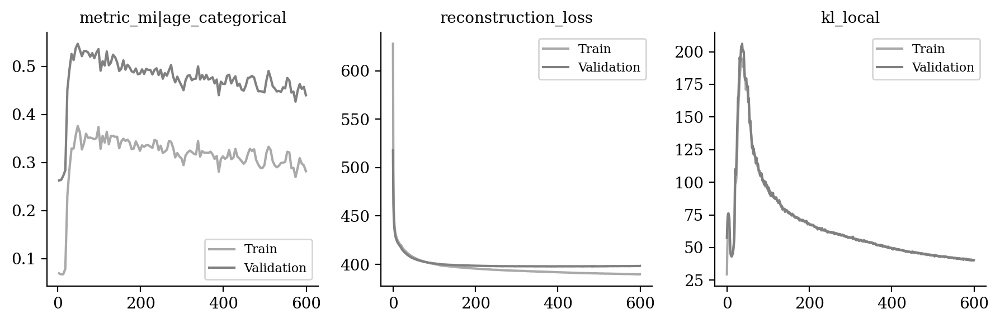

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|age_categorical", "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [13]:
sublatent = DM.configurations.get_by_obs_key("age_training").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

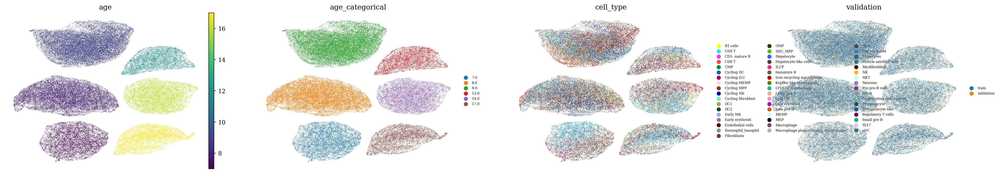

In [14]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

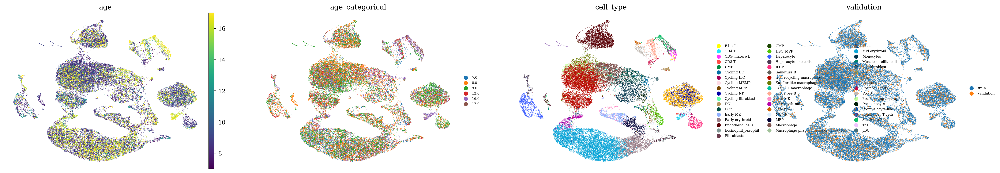

In [15]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

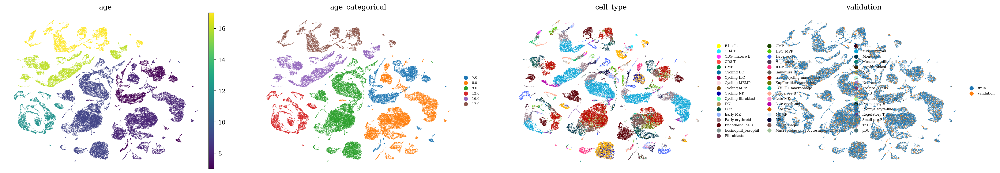

In [16]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )